Our work provides an insight in volatility-based portfolio switching and calculating the returns in the event of rule based portfolio allocation. we have selected four indices namely:
*  GSPC and FTSE for studying volatility-based portfolio switching in developed market condition and performance of indices based etfs(GSPC and FTSE can act as a proxy for etfs) in American and European market conditions.
* Similarly, HSI(China) will provide the knowledge about investors decision making pattern in a market which is transitioning from emerging to developed market.
* NSEI(India) has been selected to simulate an emerging market.
* We have also taken Gold and Gold prices to study their volatility movements and provide a more diversified solution for portfolio allocation.

### Adding libraries


In [ ]:
# Numerical Libraries
import numpy as np
import pandas as pd
import scipy
# Standard
import datetime, time, math, random
from itertools import permutations, combinations
from datetime import datetime, timedelta, date
import pandas_datareader.data as web
from matplotlib.dates import DateFormatter
import scipy.stats as stats
# Data Import Libraries
import yfinance as yf
import pandas_datareader as pdr
# Supress Warnings
import warnings
warnings.filterwarnings('ignore')
# Plots
import seaborn as sns
import networkx as nx
from pylab import plt, mpl
from pandas.plotting import scatter_matrix
from scipy.stats import kurtosis,norm,genpareto



# EQUITY
* GSPC - S&P500(USA)- Developed market(We can assume investors will be more rational in their decision making)
* FTSE - UK - Developed market
* HSI- Hong Kong Stock Exchange,China - A market transitioning from emerging to a developed market.
* NSEI- Nifty50 India, An emerging market.

In [ ]:

# Function to get closing price from Yahoo. Input tickers as in Yahoo URL and Start/End Date YYYY-MM-DD
def GetData(T, Start, End):
    '''
    T: List of Stock indices, as in Yahoo URL for Download e.g ^GSPC for S&P 500
    Start: Date in YYYY-MM-DD
    End: Date in YYYY-MM-DD
    '''
    Close_ser = []
    t1 = int(pd.to_datetime(Start).timestamp())
    t2 = int(pd.to_datetime(End).timestamp())
    for i in T:
        URL = 'https://query1.finance.yahoo.com/v7/finance/download/'+i + '?period1=' + str(int(t1)) + '&period2='+ str(int(t2)) + '&interval=1d&events=history&includeAdjustedClose=true'
        Fin_DF = pd.read_csv(URL, header = 0, encoding = 'utf-8')
        Fin_DT = pd.to_datetime(Fin_DF['Date'])
        Fin_DF.insert(1,'DateTime', Fin_DT, allow_duplicates = False)
        Fin_DF = Fin_DF.drop(['Date'], axis=1).set_index('DateTime')
        Close_ser.append(Fin_DF)
    return Close_ser

Function for getting closed price

In [ ]:
def GetAdjCloseQuotes(T, Start, End):
    '''
    T: List of Stock indices, as in Yahoo URL for Download e.g ^GSPC for S&P 500
    Start: Date in YYYY-MM-DD
    End: Date in YYYY-MM-DD
    '''
    P = GetData(T, Start, End)
    Indices_DF = []
    for i in range(len(P)):
        Indices_DF.append(pd.DataFrame(P[i]['Adj Close'].values, index = P[i].index, columns = [T[i]]))
    return Indices_DF[0].join(Indices_DF[1:], how = 'inner')





In [ ]:
Tickers = [ '^FTSE', '^GSPC', '^HSI','^NSEI','GLD','GOLD.AX',]
Start_Date = "2009-01-01"
End_Date = "2023-05-01"

In [ ]:
multiData = GetAdjCloseQuotes(Tickers, Start_Date, End_Date)
multiData.head()

,^FTSE,^GSPC,^HSI,^NSEI,GLD,GOLD.AX
DateTime,,,,,,
2009-01-02,4561.799805,931.799988,15042.809570,3046.750000,86.230003,124.330002
2009-01-05,4579.600098,927.450012,15563.309570,3121.449951,84.480003,120.639999
2009-01-06,4638.899902,934.700012,15509.509766,3112.800049,85.129997,118.199997
2009-01-07,4507.500000,906.650024,14987.459961,2920.399902,82.750000,117.660004
2009-01-09,4448.500000,890.349976,14377.440430,2873.000000,83.919998,119.599998


In [ ]:
# Calculating daily returns
return_multiData = multiData.pct_change().dropna()
return_multiData

,^FTSE,^GSPC,^HSI,^NSEI,GLD,GOLD.AX
DateTime,,,,,,
2009-01-05,0.003902,-0.004668,0.034601,0.024518,-0.020295,-0.029679
2009-01-06,0.012949,0.007817,-0.003457,-0.002771,0.007694,-0.020225
2009-01-07,-0.028326,-0.030010,-0.033660,-0.061809,-0.027957,-0.004568
2009-01-09,-0.013089,-0.017978,-0.040702,-0.016231,0.014139,0.016488
2009-01-12,-0.005013,-0.022564,-0.028269,-0.034772,-0.037655,0.011957
...,...,...,...,...,...,...
2023-04-21,0.001455,0.000903,-0.015749,-0.000023,-0.009888,0.002906
2023-04-24,-0.000240,0.000852,-0.005768,0.006772,0.003039,-0.004346
2023-04-26,-0.007533,-0.019591,-0.010154,0.003956,-0.000379,0.018188


We have selected historical volatility for our study as it will easier for investment decision makers to comprehend as historical data is readily available.

In [ ]:
# Daily Volatility
TRADING_DAYS = 252
ann_vol_portfolio = return_multiData.rolling(window=TRADING_DAYS).std()*np.sqrt(TRADING_DAYS)
ann_vol_portfolio = ann_vol_portfolio.dropna()
ann_vol_portfolio.head()


,^FTSE,^GSPC,^HSI,^NSEI,GLD,GOLD.AX
DateTime,,,,,,
2010-02-10,0.232625,0.277415,0.335965,0.348596,0.215220,0.232228
2010-02-11,0.232659,0.277507,0.334748,0.348095,0.214936,0.230634
2010-02-17,0.233344,0.278052,0.334885,0.348433,0.215652,0.230759
2010-02-18,0.231682,0.276385,0.333109,0.342569,0.213742,0.230807
2010-02-19,0.231327,0.275734,0.331550,0.342246,0.213427,0.230304


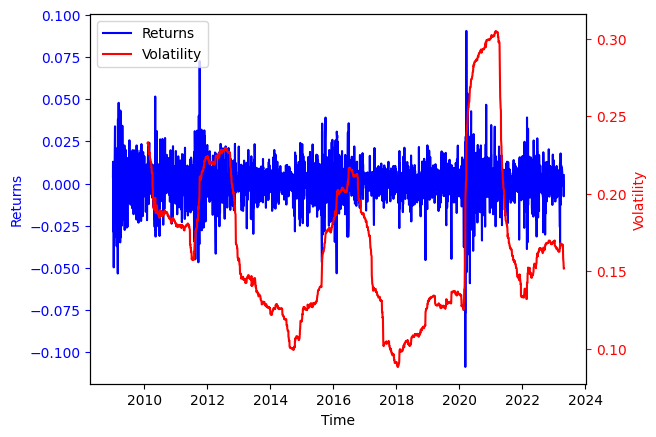

In [ ]:
# Create a figure and axis
fig, ax1 = plt.subplots()
# Plot returns on the first y-axis (left)
ax1.plot(return_multiData['^FTSE'], color='b', label='Returns')
ax1.set_xlabel('Time')
ax1.set_ylabel('Returns', color='b')
ax1.tick_params('y', colors='b')

# Create a second y-axis (right) for plotting volatility
ax2 = ax1.twinx()
ax2.plot(ann_vol_portfolio['^FTSE'], color='r', label='Volatility')
ax2.set_ylabel('Volatility', color='r')
ax2.tick_params('y', colors='r')

# Add legends
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
lines = lines1 + lines2
labels = labels1 + labels2
ax1.legend(lines, labels, loc='upper left')



In [ ]:
# Sharpe_ratio
sharpe_ratio = return_multiData.mean()/ann_vol_portfolio
sharpe_ratio.tail()

,^FTSE,^GSPC,^HSI,^NSEI,GLD,GOLD.AX
DateTime,,,,,,
2023-04-21,0.001478,0.002264,0.000561,0.003981,0.001780,0.000194
2023-04-24,0.001499,0.002264,0.000561,0.003982,0.001780,0.000194
2023-04-26,0.001537,0.002258,0.000563,0.004000,0.001789,0.000193
2023-04-27,0.001537,0.002267,0.000567,0.004045,0.001796,0.000194
2023-04-28,0.001536,0.002267,0.000567,0.004047,0.001822,0.000195


In [ ]:
# Cumulative Returns
cumprod_daily_return = (1 + return_multiData).cumprod()
cumprod_daily_return.head()

,^FTSE,^GSPC,^HSI,^NSEI,GLD,GOLD.AX
DateTime,,,,,,
2009-01-05,1.003902,0.995332,1.034601,1.024518,0.979705,0.970321
2009-01-06,1.016901,1.003112,1.031025,1.021679,0.987243,0.950696
2009-01-07,0.988097,0.973009,0.996321,0.958530,0.959643,0.946352
2009-01-09,0.975163,0.955516,0.955768,0.942972,0.973211,0.961956
2009-01-12,0.970275,0.933956,0.928749,0.910183,0.936565,0.973458


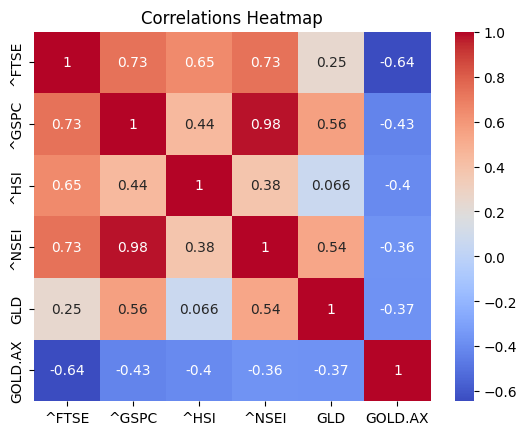

In [ ]:
# heatmap of equity
sns.heatmap(multiData.corr(), cmap = 'coolwarm', annot = True)
plt.title('Correlations Heatmap')
plt.show()

Text(0.5, 1.0, 'Indices sharpe_ratio')

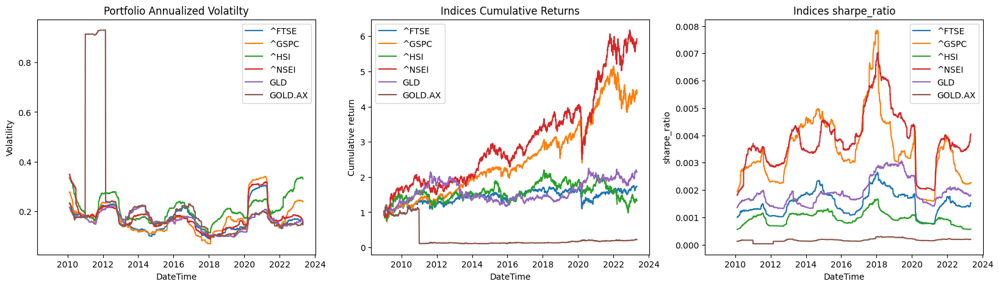

In [ ]:
fig, axes = plt.subplots(1, 3, sharex=True, figsize=(20,5))

sns.lineplot(data=ann_vol_portfolio, dashes=False, ax=axes[0])
axes[0].set_ylabel('Volatility')
axes[0].set_title('Portfolio Annualized Volatilty')


sns.lineplot(data=cumprod_daily_return, dashes=False, ax=axes[1])
axes[1].set_ylabel('Cumulative return')
axes[1].set_title('Indices Cumulative Returns')

sns.lineplot(data=sharpe_ratio, dashes=False, ax=axes[2])
axes[2].set_ylabel('sharpe_ratio')
axes[2].set_title('Indices sharpe_ratio')



#### Testing volatility Scenarios
We have converted historical volatility for simpler comprehension and binning for impletmentation of rules.

In [ ]:
ann_vol_portfolio= (ann_vol_portfolio * 100).round()
ann_vol_portfolio.head()

,^FTSE,^GSPC,^HSI,^NSEI,GLD,GOLD.AX
DateTime,,,,,,
2010-02-10,23.0,28.0,34.0,35.0,22.0,23.0
2010-02-11,23.0,28.0,33.0,35.0,21.0,23.0
2010-02-17,23.0,28.0,33.0,35.0,22.0,23.0
2010-02-18,23.0,28.0,33.0,34.0,21.0,23.0
2010-02-19,23.0,28.0,33.0,34.0,21.0,23.0


In [ ]:
vol_bins = [0, 10, 20, 30, 40, 50, 60]
vol_labels = ['0-9','10-19','20-29','30-39','40-49','50-59']
ann_vol_portfolio_2=pd.DataFrame()
ann_vol_portfolio_2['ftse_group'] = pd.cut(ann_vol_portfolio['^FTSE'], bins=vol_bins, labels=vol_labels, right=False)
ann_vol_portfolio_2['gspc_group'] = pd.cut(ann_vol_portfolio['^GSPC'], bins=vol_bins, labels=vol_labels, right=False)
ann_vol_portfolio_2['hsi_group'] = pd.cut(ann_vol_portfolio['^HSI'], bins=vol_bins, labels=vol_labels, right=False)
ann_vol_portfolio_2['nsei_group'] = pd.cut(ann_vol_portfolio['^NSEI'], bins=vol_bins, labels=vol_labels, right=False)
ann_vol_portfolio_2['gld_group'] = pd.cut(ann_vol_portfolio['GLD'], bins=vol_bins, labels=vol_labels, right=False)
ann_vol_portfolio_2['gold.ax_group'] = pd.cut(ann_vol_portfolio['GOLD.AX'], bins=vol_bins, labels=vol_labels, right=False)
ann_vol_portfolio_2.tail()

,ftse_group,gspc_group,hsi_group,nsei_group,gld_group,gold.ax_group
DateTime,,,,,,
2023-04-21,10-19,20-29,30-39,10-19,10-19,10-19
2023-04-24,10-19,20-29,30-39,10-19,10-19,10-19
2023-04-26,10-19,20-29,30-39,10-19,10-19,10-19
2023-04-27,10-19,20-29,30-39,10-19,10-19,10-19
2023-04-28,10-19,20-29,30-39,10-19,10-19,10-19


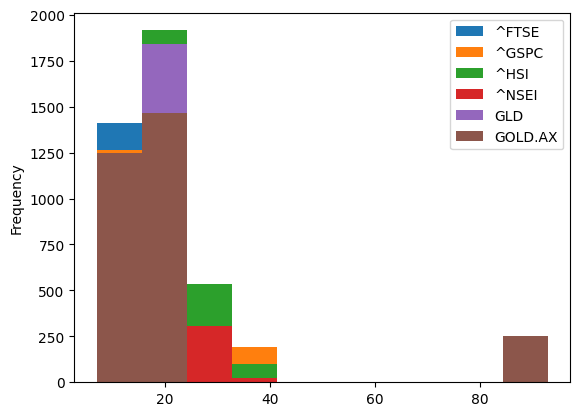

In [ ]:
# Histogram of equity
ann_vol_portfolio.plot.hist(bins=10);

We have taken five scenarios where we define different volatility levels based on variance of historical volatility dataframe and check for condition where succesive days volatility has breached previous days volatilty by a particular margin.

Since these values are arbitrary, investors are free to define their volatility levels for switching.


In [ ]:
# Count
count_df_1 = ((ann_vol_portfolio < 15) & (ann_vol_portfolio.diff() <10)).sum()
count_df_2 = (((20 > ann_vol_portfolio) & (ann_vol_portfolio >= 15)) | ((20 > ann_vol_portfolio.diff()) & (ann_vol_portfolio.diff() > 15))).sum()
count_df_3 = (((25 > ann_vol_portfolio) & (ann_vol_portfolio >= 20)) | ((30 > ann_vol_portfolio.diff()) & (ann_vol_portfolio.diff() > 20))).sum()
count_df_4 = (((27 > ann_vol_portfolio) & (ann_vol_portfolio >= 25)) | ((15 > ann_vol_portfolio.diff()) & (ann_vol_portfolio.diff() > 10))).sum()
count_df_5 = ((ann_vol_portfolio  >=  27) | (ann_vol_portfolio.diff() > 25)).sum()

The exihibit below shows number of times volatility has breached the above condtions in the given investment horizon.

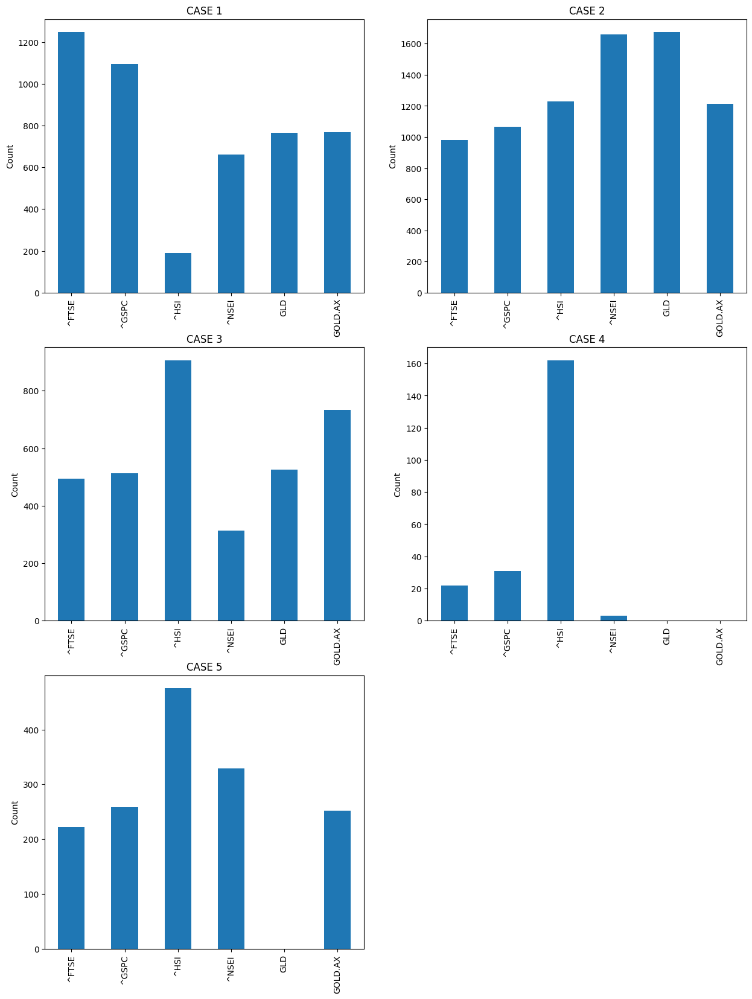

In [ ]:
plt.figure(figsize=(15, 20))
plt.subplot(3,2,1)
count_df_1.plot.bar()
plt.ylabel('Count')
plt.title('CASE 1')

plt.subplot(3,2,2)
count_df_2.plot.bar()
plt.ylabel('Count')
plt.title('CASE 2')

plt.subplot(3,2,3)
count_df_3.plot.bar()
plt.ylabel('Count')
plt.title('CASE 3')

plt.subplot(3,2,4)
count_df_4.plot.bar()
plt.ylabel('Count')
plt.title('CASE 4')

plt.subplot(3,2,5)
count_df_5.plot.bar()
plt.ylabel('Count')
plt.title('CASE 5')

plt.show()

In [ ]:
ann_vol_portfolio=ann_vol_portfolio.reset_index()
return_multiData=return_multiData.reset_index()

##  For ^FTSE

In [ ]:
filtered_dates1 = ann_vol_portfolio[((ann_vol_portfolio['^FTSE'] < 15) & (ann_vol_portfolio['^FTSE'].diff() <10))]['DateTime']
filtered_dates4  = ann_vol_portfolio[(((27 > ann_vol_portfolio['^FTSE']) & (ann_vol_portfolio['^FTSE'] >= 25)) | ((15 > ann_vol_portfolio['^FTSE'].diff()) & (ann_vol_portfolio['^FTSE'].diff() > 10)))]['DateTime']
filtered_dates3  = ann_vol_portfolio[(((25 > ann_vol_portfolio['^FTSE']) & (ann_vol_portfolio['^FTSE'] >= 20)) | ((30 > ann_vol_portfolio['^FTSE'].diff()) & (ann_vol_portfolio['^FTSE'].diff() > 20)))]['DateTime']
filtered_dates2  = ann_vol_portfolio[(((20 > ann_vol_portfolio['^FTSE']) & (ann_vol_portfolio['^FTSE'] >= 15)) | ((20 > ann_vol_portfolio['^FTSE'].diff()) & (ann_vol_portfolio['^FTSE'].diff() > 15)))]['DateTime']
filtered_dates5  = ann_vol_portfolio[((ann_vol_portfolio['^FTSE']  >=  27) | (ann_vol_portfolio['^FTSE'].diff() >25))]['DateTime']

In [ ]:
# Dates fullfilling the condition
def selected_returns_dataframe(filtered_dates):
  selected_returns = []
  for date in filtered_dates:
    return_value = return_multiData.loc[return_multiData['DateTime'] == date, '^FTSE'].values
    if len(return_value) > 0:
        selected_returns.append((date, return_value[0]))

  selected_return=pd.DataFrame(selected_returns)
  selected_return.set_axis(['Date', 'Portfolio_Return_ftse'], axis=1, inplace=True)
  return selected_return

In [ ]:
def filtered_return_dataframe(selected_return_df):
  filtered_return_df = return_multiData[~return_multiData['DateTime'].isin(selected_return_df['Date'])]
  filtered_return_df1=pd.DataFrame()
  filtered_return_df1=filtered_return_df[['DateTime','^FTSE']]
  return filtered_return_df1

#### CASE 1

In [ ]:
case1_ftse=selected_returns_dataframe(filtered_dates1)
case1_ftse.head()

,Date,Portfolio_Return_ftse
0,2013-02-22,0.007025
1,2013-02-25,0.003109
2,2013-03-01,0.002798
3,2013-03-04,-0.005174
4,2013-03-06,-0.000684


In [ ]:
# Comparing filtered dates with the main return dataframes dates and extract date and return from return dataframe which is not fulfilling condition
filt_case1_ftse= filtered_return_dataframe(case1_ftse)
filt_case1_ftse.head()

,DateTime,^FTSE
0,2009-01-05,0.003902
1,2009-01-06,0.012949
2,2009-01-07,-0.028326
3,2009-01-09,-0.013089
4,2009-01-12,-0.005013


In [ ]:
# cumulative product of return which is not satisfied the condition 1
filt_case1_ftse=filt_case1_ftse.set_index('DateTime')
filt_case1_ftse_cumpro=(1+filt_case1_ftse).cumprod()
filt_case1_ftse_cumpro.head()

,^FTSE
DateTime,
2009-01-05,1.003902
2009-01-06,1.016901
2009-01-07,0.988097
2009-01-09,0.975163
2009-01-12,0.970275


<Axes: ylabel='Frequency'>

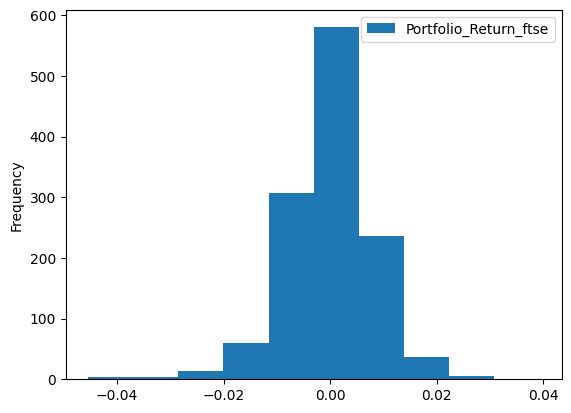

In [ ]:
case1_ftse.plot.hist()

In [ ]:
selected_return1_ftse=case1_ftse.set_index('Date')


In [ ]:
def price_parameters(df_ser):
    return round(df_ser.mean(),2),round(df_ser.std(),2),round(df_ser.skew(),2),round(df_ser.kurtosis(),2)

#Plot distribution of series
def plot_dist(df):
    figure, axis = plt.subplots(1, 2)
    figure.set_figheight(10)
    figure.set_figwidth(20)
    mean,std,skew,kurt=price_parameters(df['Portfolio_Return_ftse']*100)
    sns.lineplot(data=df['Portfolio_Return_ftse']*100,ax=axis[0])
    axis[0].axhline(mean,color='r',ls='--')
    axis[0].set_title('Daily return chart(%), Total Returns:'+str(round(np.product(1+df['Portfolio_Return_ftse'])-1,2)*100)+'% Std-dev:'+str(std)+'%')
    sns.distplot(df['Portfolio_Return_ftse']*100,bins=50,ax=axis[1])
    x_axis=np.arange(min(df['Portfolio_Return_ftse']*100),max(df['Portfolio_Return_ftse']*100),0.0001)
    axis[1].axvline(mean,color='r',ls='--')
    axis[1].axvline(norm.ppf(0.05, loc=mean, scale=std),ls='--',color='r')
    axis[1].axvline(norm.ppf(0.95, loc=mean, scale=std),ls='--',color='r')
    axis[1].plot(x_axis,norm.pdf(x_axis, loc=mean, scale=std),ls='--',color='r')
    axis[1].set_title('Returns distribution, Mean:'+str(mean)+' std-dev:'+str(std)+' Skew:'+str(skew)+' Kurtosis:'+str(kurt))

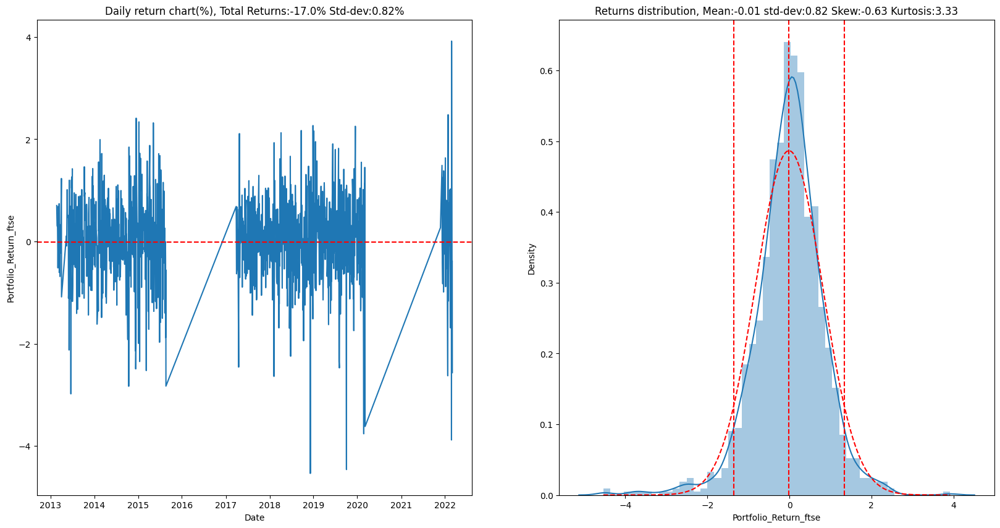

In [ ]:
plot_dist(selected_return1_ftse)

#### *CASE* 2

In [ ]:
case2_ftse= selected_returns_dataframe(filtered_dates2)
case2_ftse.head()

,Date,Portfolio_Return_ftse
0,2010-04-20,0.009742
1,2010-04-21,-0.010426
2,2010-04-22,-0.010151
3,2010-04-23,0.010308
4,2010-04-27,-0.021000


In [ ]:
filt_case2_ftse= filtered_return_dataframe(case2_ftse)
filt_case2_ftse.head()

,DateTime,^FTSE
0,2009-01-05,0.003902
1,2009-01-06,0.012949
2,2009-01-07,-0.028326
3,2009-01-09,-0.013089
4,2009-01-12,-0.005013


In [ ]:
# cumulative product of return which is not satisfied the condition 2
filt_case2_ftse=filt_case2_ftse.set_index('DateTime')
filt_case2_ftse_cumpro=(1+filt_case2_ftse).cumprod()
filt_case2_ftse_cumpro.head()

,^FTSE
DateTime,
2009-01-05,1.003902
2009-01-06,1.016901
2009-01-07,0.988097
2009-01-09,0.975163
2009-01-12,0.970275


<Axes: ylabel='Frequency'>

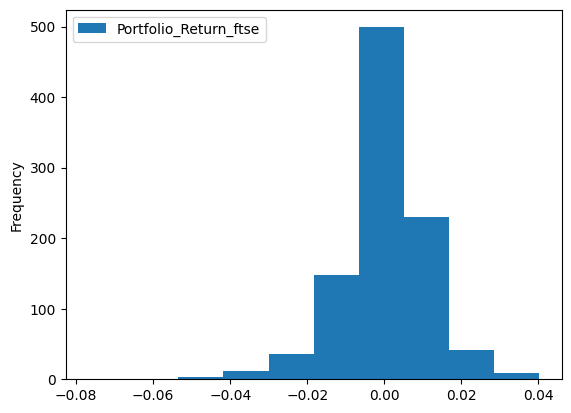

In [ ]:
# Histogram of ftse
case2_ftse.plot.hist()

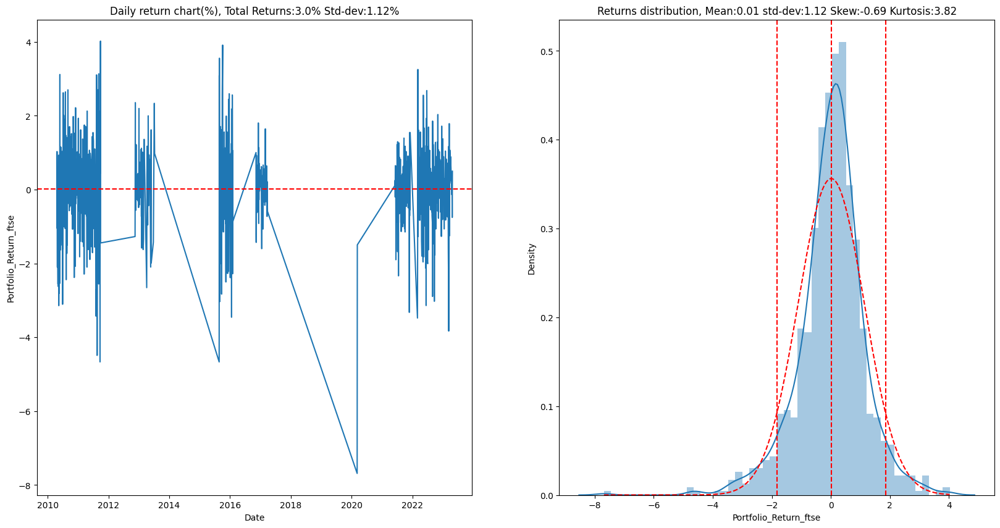

In [ ]:
selected_return2_ftse=case2_ftse.set_index('Date')
plot_dist(selected_return2_ftse)

#### CASE 3

In [ ]:
case3_ftse= selected_returns_dataframe(filtered_dates3)
case3_ftse.head()

,Date,Portfolio_Return_ftse
0,2010-02-10,0.003952
1,2010-02-11,0.005748
2,2010-02-17,0.022300
3,2010-02-18,0.009192
4,2010-02-19,0.006216


In [ ]:
filt_case3_ftse= filtered_return_dataframe(case3_ftse)
filt_case3_ftse.head()

,DateTime,^FTSE
0,2009-01-05,0.003902
1,2009-01-06,0.012949
2,2009-01-07,-0.028326
3,2009-01-09,-0.013089
4,2009-01-12,-0.005013


In [ ]:
# cumulative product of return which is not satisfied the condition 3
filt_case3_ftse=filt_case3_ftse.set_index('DateTime')
filt_case3_ftse_cumpro=(1+filt_case3_ftse).cumprod()
filt_case3_ftse_cumpro.head()

,^FTSE
DateTime,
2009-01-05,1.003902
2009-01-06,1.016901
2009-01-07,0.988097
2009-01-09,0.975163
2009-01-12,0.970275


<Axes: ylabel='Frequency'>

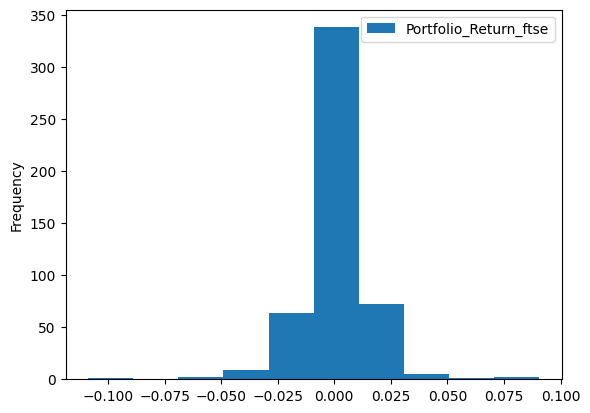

In [ ]:
# Histogram of ftse
case3_ftse.plot.hist()

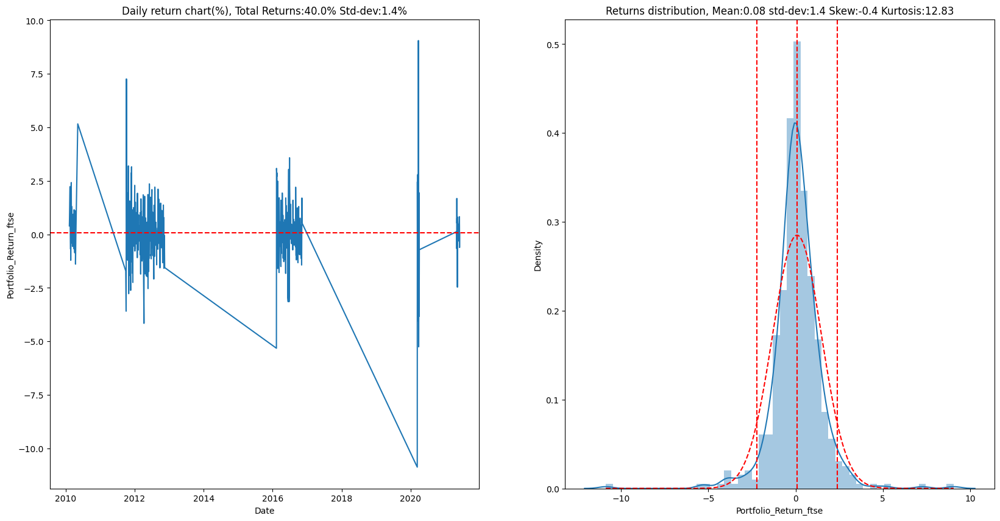

In [ ]:
selected_return3_ftse=case3_ftse.set_index('Date')
plot_dist(selected_return3_ftse)

#### CASE 4

In [ ]:
case4_ftse= selected_returns_dataframe(filtered_dates4)
case4_ftse.head()

,Date,Portfolio_Return_ftse
0,2020-04-07,0.053365
1,2020-04-08,-0.004698
2,2020-04-09,0.029061
3,2020-04-15,-0.041933
4,2020-04-16,0.005484


In [ ]:
filt_case4_ftse= filtered_return_dataframe(case4_ftse)
filt_case4_ftse.head()

,DateTime,^FTSE
0,2009-01-05,0.003902
1,2009-01-06,0.012949
2,2009-01-07,-0.028326
3,2009-01-09,-0.013089
4,2009-01-12,-0.005013


In [ ]:
# cumulative product of return which is not satisfied the condition 4
filt_case4_ftse=filt_case4_ftse.set_index('DateTime')
filt_case4_ftse_cumpro=(1+filt_case4_ftse).cumprod()
filt_case4_ftse_cumpro.head()

,^FTSE
DateTime,
2009-01-05,1.003902
2009-01-06,1.016901
2009-01-07,0.988097
2009-01-09,0.975163
2009-01-12,0.970275


<Axes: ylabel='Frequency'>

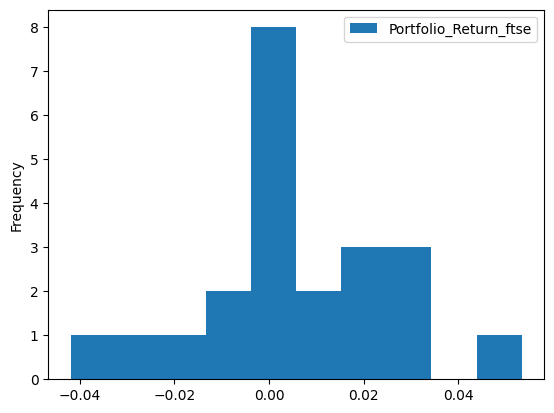

In [ ]:
# Histogram of ftse
case4_ftse.plot.hist()

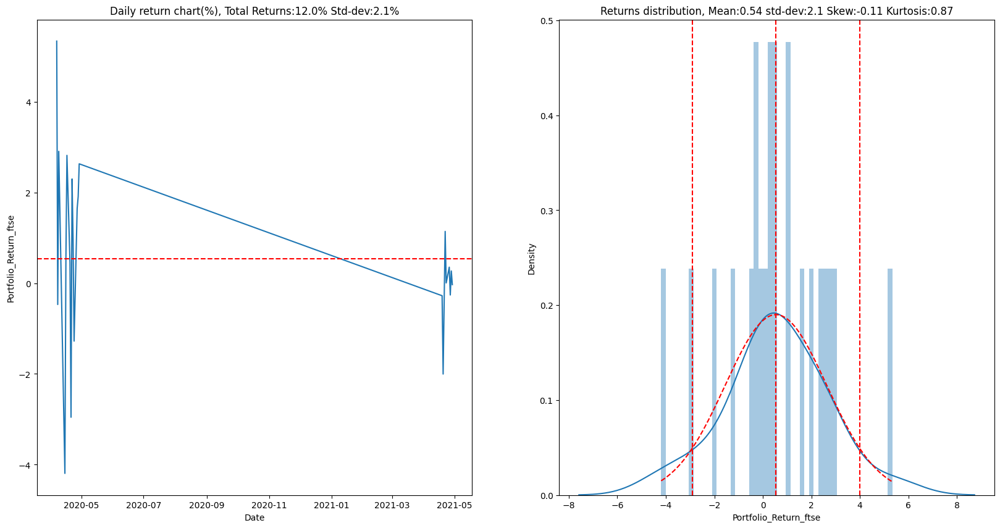

In [ ]:
selected_return4_ftse=case4_ftse.set_index('Date')
plot_dist(selected_return4_ftse)

#### CASE 5

In [ ]:
case5_ftse= selected_returns_dataframe(filtered_dates5)
case5_ftse.head()

,Date,Portfolio_Return_ftse
0,2020-05-04,-0.059114
1,2020-05-05,0.016615
2,2020-05-06,0.000752
3,2020-05-07,0.014042
4,2020-05-11,0.000623


In [ ]:
filt_case5_ftse= filtered_return_dataframe(case5_ftse)
filt_case5_ftse.head()

,DateTime,^FTSE
0,2009-01-05,0.003902
1,2009-01-06,0.012949
2,2009-01-07,-0.028326
3,2009-01-09,-0.013089
4,2009-01-12,-0.005013


In [ ]:
# cumulative product of return which is not satisfied the condition 5
filt_case5_ftse=filt_case5_ftse.set_index('DateTime')
filt_case5_ftse_cumpro=(1+filt_case5_ftse).cumprod()
filt_case5_ftse_cumpro.head()

,^FTSE
DateTime,
2009-01-05,1.003902
2009-01-06,1.016901
2009-01-07,0.988097
2009-01-09,0.975163
2009-01-12,0.970275


<Axes: ylabel='Frequency'>

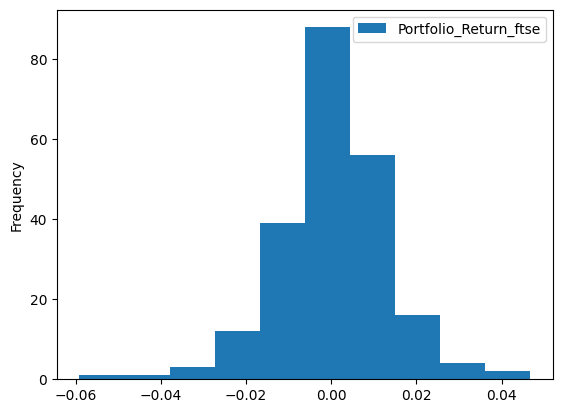

In [ ]:
# Histogram of ftse
case5_ftse.plot.hist()

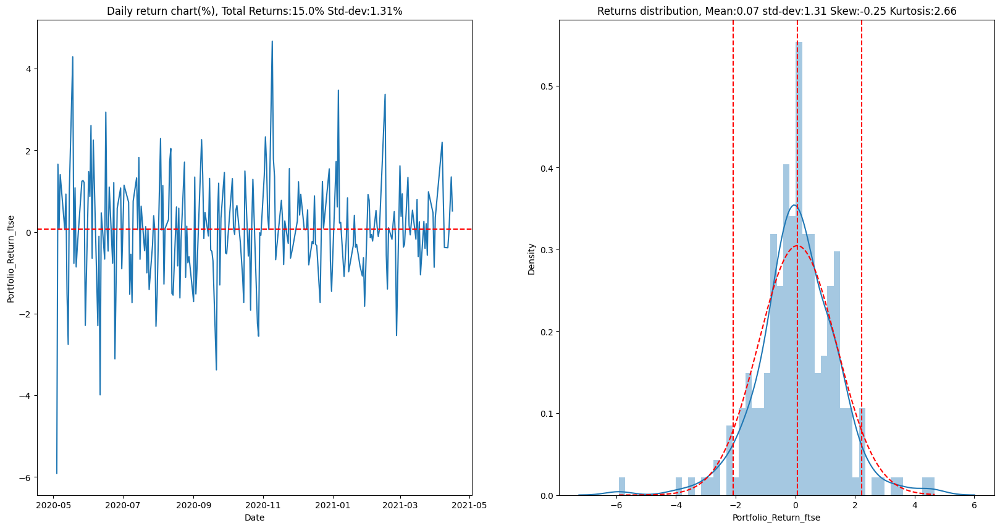

In [ ]:
selected_return5_ftse=case5_ftse.set_index('Date')
plot_dist(selected_return5_ftse)

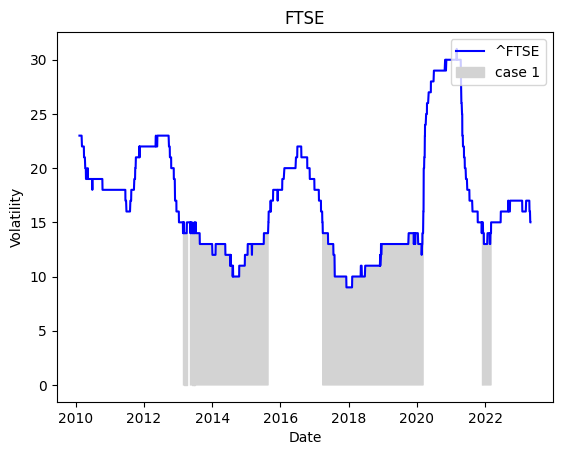

In [ ]:
# Create a figure and axis
fig, ax = plt.subplots()

ax.plot(ann_vol_portfolio['DateTime'],ann_vol_portfolio['^FTSE'], color='blue', label='^FTSE')


# Create a mask for the condition
mask1 = (ann_vol_portfolio['^FTSE'] < 15) & (ann_vol_portfolio['^FTSE'].diff() <10)

# Shade the regions where the condition is met
ax.fill_between(ann_vol_portfolio['DateTime'], ann_vol_portfolio['^FTSE'], where=mask1, color='lightgray',label='case 1')


# Set labels and title
ax.set_xlabel('Date')
ax.set_ylabel('Volatility')
ax.set_title('FTSE')
ax.legend(loc='upper right')

# Show the plot
plt.show()

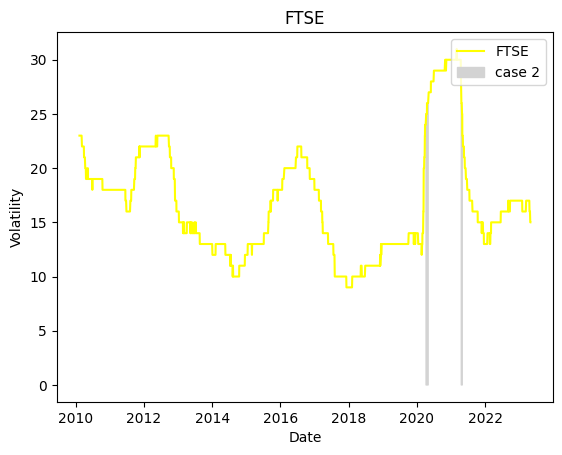

In [ ]:
# Create a figure and axis
fig, ax = plt.subplots()

ax.plot(ann_vol_portfolio['DateTime'],ann_vol_portfolio['^FTSE'], color='yellow', label='FTSE')


# Create a mask for the condition
mask2 = (((27 > ann_vol_portfolio['^FTSE']) & (ann_vol_portfolio['^FTSE'] >= 25)) | ((15 > ann_vol_portfolio['^FTSE'].diff()) & (ann_vol_portfolio['^FTSE'].diff() > 10)))

# Shade the regions where the condition is met
ax.fill_between(ann_vol_portfolio['DateTime'], ann_vol_portfolio['^FTSE'], where=mask2, color='lightgray',label='case 2')


# Set labels and title
ax.set_xlabel('Date')
ax.set_ylabel('Volatility')
ax.set_title('FTSE')
ax.legend(loc='upper right')

# Show the plot
plt.show()

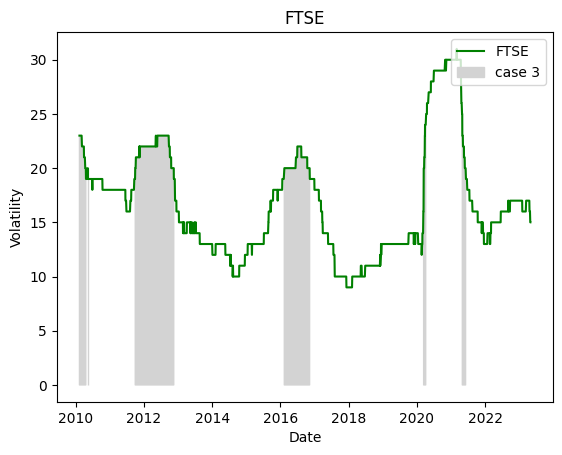

In [ ]:
# Create a figure and axis
fig, ax = plt.subplots()

ax.plot(ann_vol_portfolio['DateTime'],ann_vol_portfolio['^FTSE'], color='green', label='FTSE')


# Create a mask for the condition
mask3 = (((25 > ann_vol_portfolio['^FTSE']) & (ann_vol_portfolio['^FTSE'] >= 20)) | ((30 > ann_vol_portfolio['^FTSE'].diff()) & (ann_vol_portfolio['^FTSE'].diff() > 20)))

# Shade the regions where the condition is met
ax.fill_between(ann_vol_portfolio['DateTime'], ann_vol_portfolio['^FTSE'], where=mask3, color='lightgray',label='case 3')


# Set labels and title
ax.set_xlabel('Date')
ax.set_ylabel('Volatility')
ax.set_title('FTSE')
ax.legend(loc='upper right')

# Show the plot
plt.show()

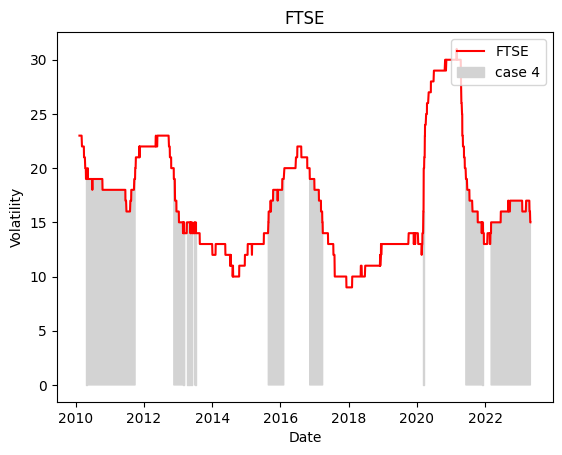

In [ ]:
# Create a figure and axis
fig, ax = plt.subplots()

ax.plot(ann_vol_portfolio['DateTime'],ann_vol_portfolio['^FTSE'], color='red', label='FTSE')


# Create a mask for the condition
mask4 = (((20 > ann_vol_portfolio['^FTSE']) & (ann_vol_portfolio['^FTSE'] >= 15)) | ((20 > ann_vol_portfolio['^FTSE'].diff()) & (ann_vol_portfolio['^FTSE'].diff() > 15)))

# Shade the regions where the condition is met
ax.fill_between(ann_vol_portfolio['DateTime'], ann_vol_portfolio['^FTSE'], where=mask4, color='lightgray',label='case 4')


# Set labels and title
ax.set_xlabel('Date')
ax.set_ylabel('Volatility')
ax.set_title('FTSE')
ax.legend(loc='upper right')

# Show the plot
plt.show()

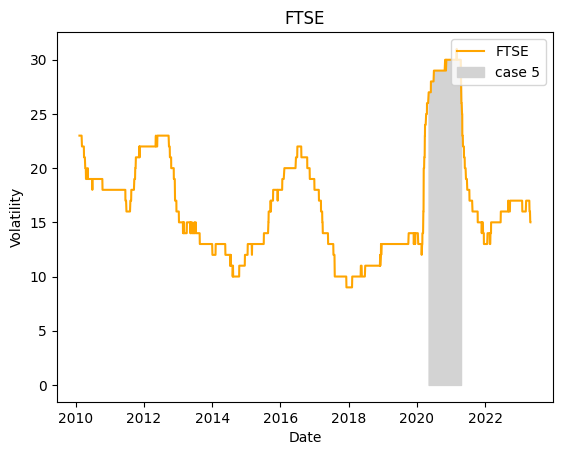

In [ ]:
# Create a figure and axis
fig, ax = plt.subplots()

ax.plot(ann_vol_portfolio['DateTime'],ann_vol_portfolio['^FTSE'], color='orange', label='FTSE')


# Create a mask for the condition
mask5 = (ann_vol_portfolio['^FTSE'] >= 27) | (ann_vol_portfolio['^FTSE'].diff() > 25)

# Shade the regions where the condition is met
ax.fill_between(ann_vol_portfolio['DateTime'], ann_vol_portfolio['^FTSE'], where=mask5, color='lightgray',label='case 5')


# Set labels and title
ax.set_xlabel('Date')
ax.set_ylabel('Volatility')
ax.set_title('FTSE')
ax.legend(loc='upper right')

# Show the plot
plt.show()



## FOR ^GSPC

In [ ]:
#Plot distribution of series
def plot_dist(df):
    figure, axis = plt.subplots(1, 2)
    figure.set_figheight(10)
    figure.set_figwidth(20)
    mean,std,skew,kurt=price_parameters(df['Portfolio_Return_gspc']*100)
    sns.lineplot(data=df['Portfolio_Return_gspc']*100,ax=axis[0])
    axis[0].axhline(mean,color='r',ls='--')
    axis[0].set_title('Daily return chart(%), Total Returns:'+str(round(np.product(1+df['Portfolio_Return_gspc'])-1,2)*100)+'% Std-dev:'+str(std)+'%')
    sns.distplot(df['Portfolio_Return_gspc']*100,bins=50,ax=axis[1])
    x_axis=np.arange(min(df['Portfolio_Return_gspc']*100),max(df['Portfolio_Return_gspc']*100),0.0001)
    axis[1].axvline(mean,color='r',ls='--')
    axis[1].axvline(norm.ppf(0.05, loc=mean, scale=std),ls='--',color='r')
    axis[1].axvline(norm.ppf(0.95, loc=mean, scale=std),ls='--',color='r')
    axis[1].plot(x_axis,norm.pdf(x_axis, loc=mean, scale=std),ls='--',color='r')
    axis[1].set_title('Returns distribution, Mean:'+str(mean)+' std-dev:'+str(std)+' Skew:'+str(skew)+' Kurtosis:'+str(kurt))

In [ ]:
filtered_dates1 = ann_vol_portfolio[((ann_vol_portfolio['^GSPC'] < 15) & (ann_vol_portfolio['^GSPC'].diff() <10))]['DateTime']
filtered_dates4  = ann_vol_portfolio[(((27 > ann_vol_portfolio['^GSPC']) & (ann_vol_portfolio['^GSPC'] >= 25)) | ((15 > ann_vol_portfolio['^GSPC'].diff()) & (ann_vol_portfolio['^GSPC'].diff() > 10)))]['DateTime']
filtered_dates3  = ann_vol_portfolio[(((25 > ann_vol_portfolio['^GSPC']) & (ann_vol_portfolio['^GSPC'] >= 20)) | ((30 > ann_vol_portfolio['^GSPC'].diff()) & (ann_vol_portfolio['^GSPC'].diff() > 20)))]['DateTime']
filtered_dates2  = ann_vol_portfolio[(((20 > ann_vol_portfolio['^GSPC']) & (ann_vol_portfolio['^GSPC'] >= 15)) | ((20 > ann_vol_portfolio['^GSPC'].diff()) & (ann_vol_portfolio['^GSPC'].diff() > 15)))]['DateTime']
filtered_dates5  = ann_vol_portfolio[((ann_vol_portfolio['^GSPC']  >=  27) | (ann_vol_portfolio['^GSPC'].diff() >25))]['DateTime']

In [ ]:
# Dates fullfilling the condition
def selected_returns_dataframe(filtered_dates):
  selected_returns = []
  for date in filtered_dates:
    return_value = return_multiData.loc[return_multiData['DateTime'] == date, '^GSPC'].values
    if len(return_value) > 0:
        selected_returns.append((date, return_value[0]))

  selected_return=pd.DataFrame(selected_returns)
  selected_return.set_axis(['Date', 'Portfolio_Return_gspc'], axis=1, inplace=True)
  return selected_return

In [ ]:
def filtered_return_dataframe(selected_return_df):
  filtered_return_df = return_multiData[~return_multiData['DateTime'].isin(selected_return_df['Date'])]
  filtered_return_df1=pd.DataFrame()
  filtered_return_df1=filtered_return_df[['DateTime','^GSPC']]
  return filtered_return_df1

#### CASE 1

In [ ]:
case1_gspc=selected_returns_dataframe(filtered_dates1)
case1_gspc.head()

,Date,Portfolio_Return_gspc
0,2013-01-23,0.001507
1,2013-01-24,0.000007
2,2013-01-25,0.005445
3,2013-01-29,0.003247
4,2013-01-30,-0.003900


In [ ]:
# Comparing filtered dates with the main return dataframes dates and extract date and return from return dataframe which is not fulfilling condition

filt_case1_gspc= filtered_return_dataframe(case1_gspc)
filt_case1_gspc.head()

,DateTime,^GSPC
0,2009-01-05,-0.004668
1,2009-01-06,0.007817
2,2009-01-07,-0.030010
3,2009-01-09,-0.017978
4,2009-01-12,-0.022564


In [ ]:
# cumulative product of return which is not satisfied the condition 1
filt_case1_gspc=filt_case1_gspc.set_index('DateTime')
filt_case1_gspc_cumpro=(1+filt_case1_gspc).cumprod()
filt_case1_gspc_cumpro.head()

,^GSPC
DateTime,
2009-01-05,0.995332
2009-01-06,1.003112
2009-01-07,0.973009
2009-01-09,0.955516
2009-01-12,0.933956


<Axes: ylabel='Frequency'>

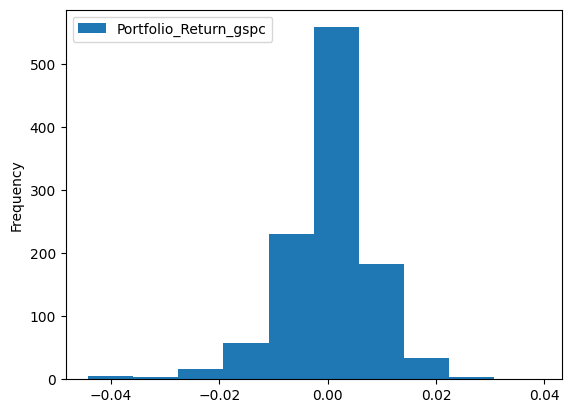

In [ ]:
case1_gspc.plot.hist()

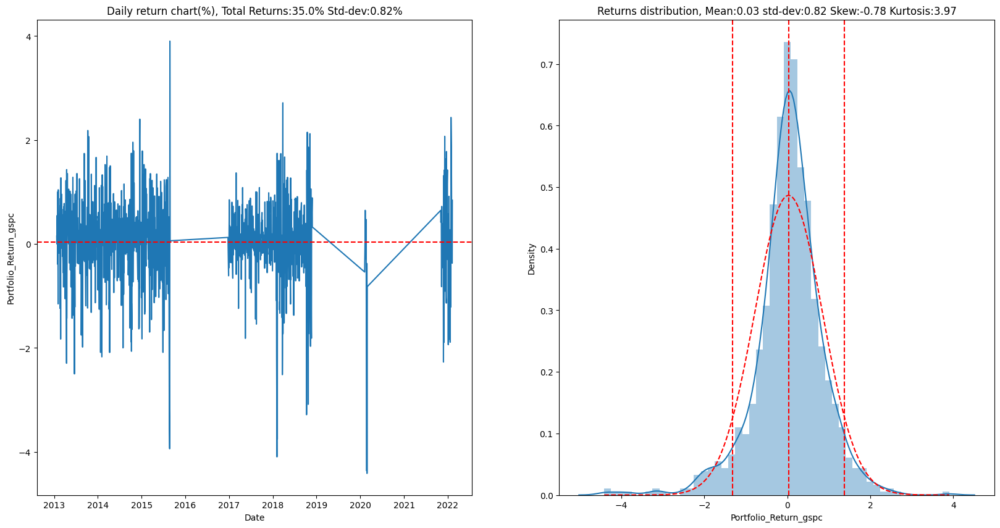

In [ ]:
selected_return1_gspc=case1_gspc.set_index('Date')
plot_dist(selected_return1_gspc)

#### *CASE* 2

In [ ]:
case2_gspc= selected_returns_dataframe(filtered_dates2)
case2_gspc.head()

,Date,Portfolio_Return_gspc
0,2010-06-23,-0.002985
1,2010-06-28,-0.002034
2,2010-07-02,-0.007888
3,2010-07-06,0.005359
4,2010-07-07,0.031331


In [ ]:
filt_case2_gspc= filtered_return_dataframe(case2_gspc)
filt_case2_gspc.head()

,DateTime,^GSPC
0,2009-01-05,-0.004668
1,2009-01-06,0.007817
2,2009-01-07,-0.030010
3,2009-01-09,-0.017978
4,2009-01-12,-0.022564


In [ ]:
# cumulative product of return which is not satisfied the condition 2
filt_case2_gspc=filt_case2_gspc.set_index('DateTime')
filt_case2_gspc_cumpro=(1+filt_case2_gspc).cumprod()
filt_case2_gspc_cumpro.head()

,^GSPC
DateTime,
2009-01-05,0.995332
2009-01-06,1.003112
2009-01-07,0.973009
2009-01-09,0.955516
2009-01-12,0.933956


<Axes: ylabel='Frequency'>

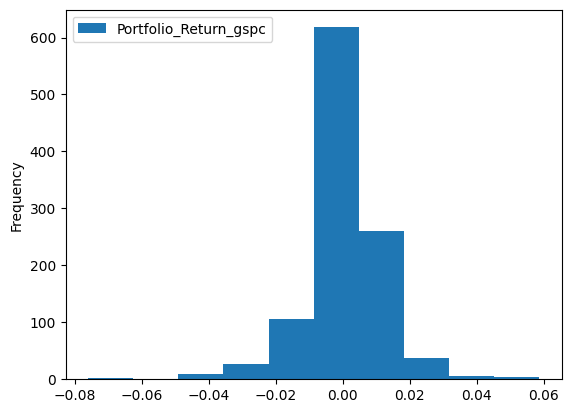

In [ ]:
# Histogram of gspc
case2_gspc.plot.hist()

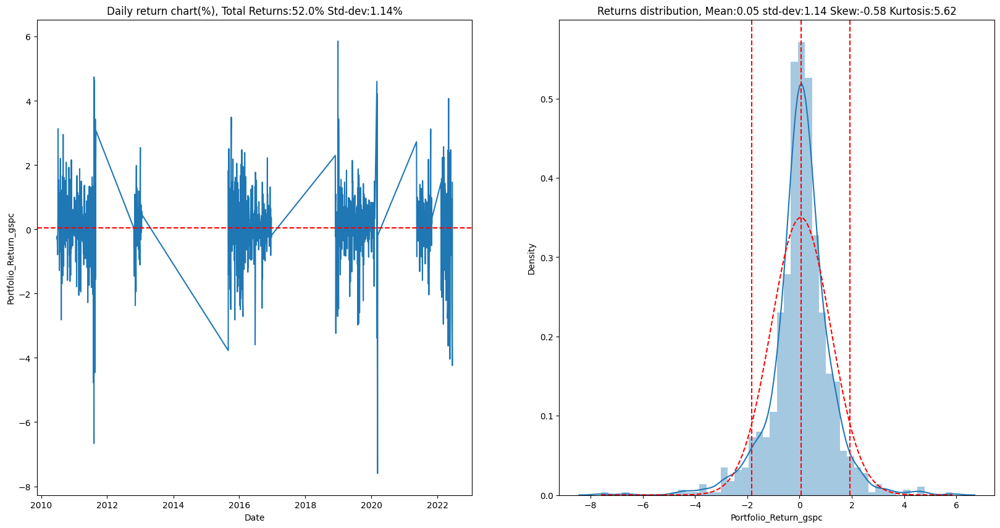

In [ ]:
selected_return2_gspc=case2_gspc.set_index('Date')
plot_dist(selected_return2_gspc)

#### CASE 3

In [ ]:
case3_gspc= selected_returns_dataframe(filtered_dates3)
case3_gspc.head()

,Date,Portfolio_Return_gspc
0,2010-04-09,0.006684
1,2010-04-12,0.001767
2,2010-04-13,0.000685
3,2010-04-15,0.012002
4,2010-04-16,-0.016127


In [ ]:
filt_case3_gspc= filtered_return_dataframe(case3_gspc)
filt_case3_gspc.head()

,DateTime,^GSPC
0,2009-01-05,-0.004668
1,2009-01-06,0.007817
2,2009-01-07,-0.030010
3,2009-01-09,-0.017978
4,2009-01-12,-0.022564


In [ ]:
# cumulative product of return which is not satisfied the condition 3
filt_case3_gspc=filt_case3_gspc.set_index('DateTime')
filt_case3_gspc_cumpro=(1+filt_case3_gspc).cumprod()
filt_case3_gspc_cumpro.head()

,^GSPC
DateTime,
2009-01-05,0.995332
2009-01-06,1.003112
2009-01-07,0.973009
2009-01-09,0.955516
2009-01-12,0.933956


<Axes: ylabel='Frequency'>

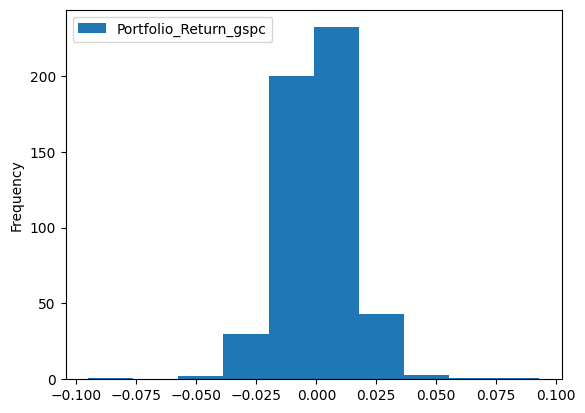

In [ ]:
# Histogram of gspc
case3_gspc.plot.hist()

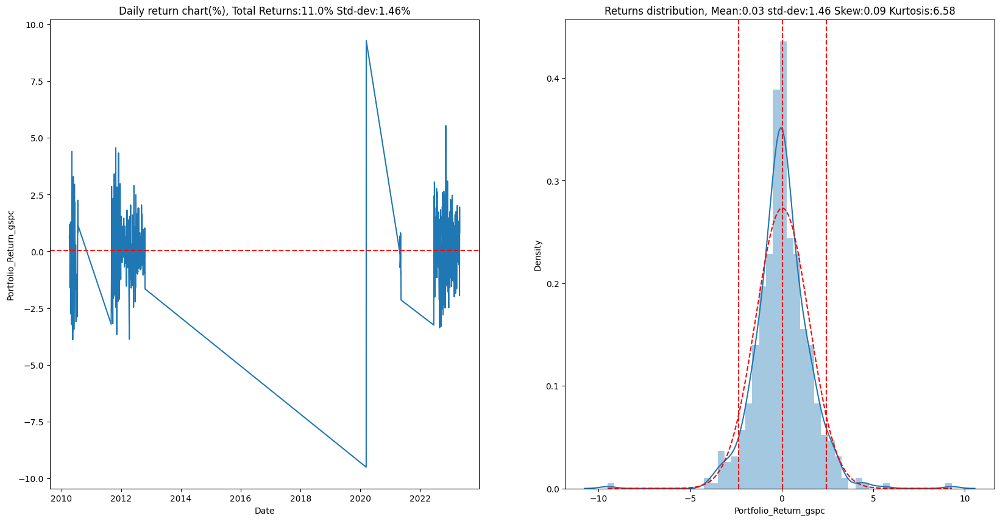

In [ ]:
selected_return3_gspc=case3_gspc.set_index('Date')
plot_dist(selected_return3_gspc)

#### CASE 4

In [ ]:
case4_gspc= selected_returns_dataframe(filtered_dates4)
case4_gspc.head()

,Date,Portfolio_Return_gspc
0,2010-03-03,0.000429
1,2010-03-04,0.003736
2,2010-03-05,0.014007
3,2010-03-08,-0.000176
4,2010-03-09,0.001713


In [ ]:
filt_case4_gspc= filtered_return_dataframe(case4_gspc)
filt_case4_gspc.head()

,DateTime,^GSPC
0,2009-01-05,-0.004668
1,2009-01-06,0.007817
2,2009-01-07,-0.030010
3,2009-01-09,-0.017978
4,2009-01-12,-0.022564


In [ ]:
# cumulative product of return which is not satisfied the condition 4
filt_case4_gspc=filt_case4_gspc.set_index('DateTime')
filt_case4_gspc_cumpro=(1+filt_case4_gspc).cumprod()
filt_case4_gspc_cumpro.head()

,^GSPC
DateTime,
2009-01-05,0.995332
2009-01-06,1.003112
2009-01-07,0.973009
2009-01-09,0.955516
2009-01-12,0.933956


<Axes: ylabel='Frequency'>

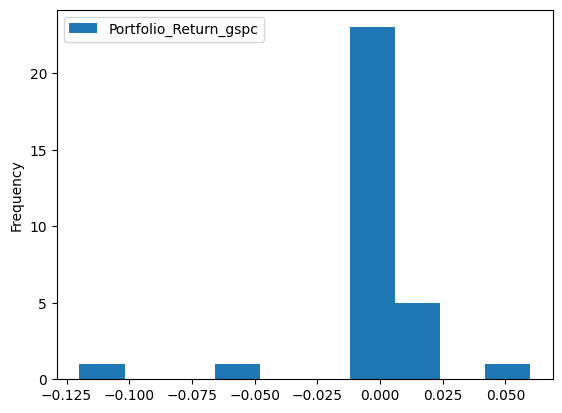

In [ ]:
# Histogram of gspc
case4_gspc.plot.hist()

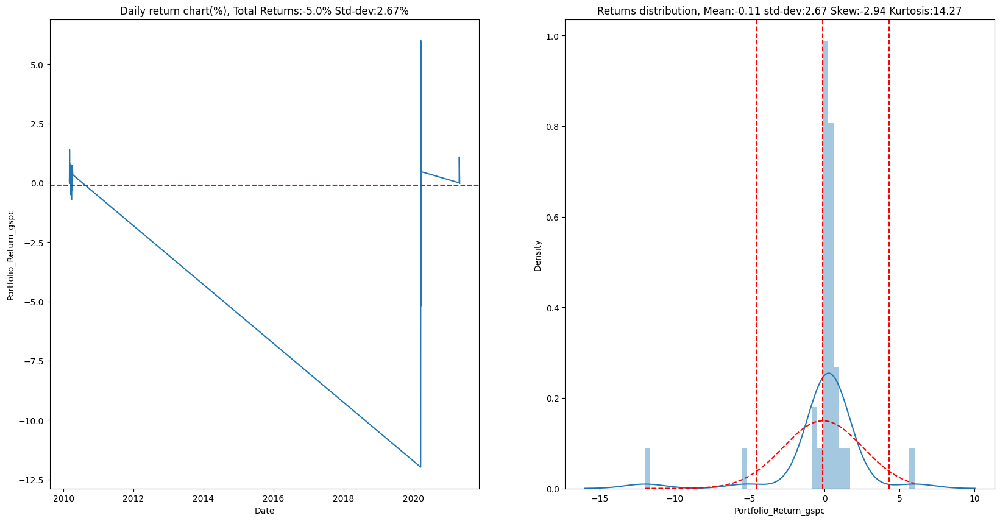

In [ ]:
selected_return4_gspc=case4_gspc.set_index('Date')
plot_dist(selected_return4_gspc)

#### CASE 5

In [ ]:
case5_gspc= selected_returns_dataframe(filtered_dates5)
case5_gspc.head()

,Date,Portfolio_Return_gspc
0,2010-02-10,-0.002233
1,2010-02-11,0.009680
2,2010-02-17,0.019509
3,2010-02-18,0.006585
4,2010-02-19,0.002187


In [ ]:
filt_case5_gspc= filtered_return_dataframe(case5_gspc)
filt_case5_gspc.head()

,DateTime,^GSPC
0,2009-01-05,-0.004668
1,2009-01-06,0.007817
2,2009-01-07,-0.030010
3,2009-01-09,-0.017978
4,2009-01-12,-0.022564


In [ ]:
# cumulative product of return which is not satisfied the condition 5
filt_case5_gspc=filt_case5_gspc.set_index('DateTime')
filt_case5_gspc_cumpro=(1+filt_case5_gspc).cumprod()
filt_case5_gspc_cumpro.head()

,^GSPC
DateTime,
2009-01-05,0.995332
2009-01-06,1.003112
2009-01-07,0.973009
2009-01-09,0.955516
2009-01-12,0.933956


<Axes: ylabel='Frequency'>

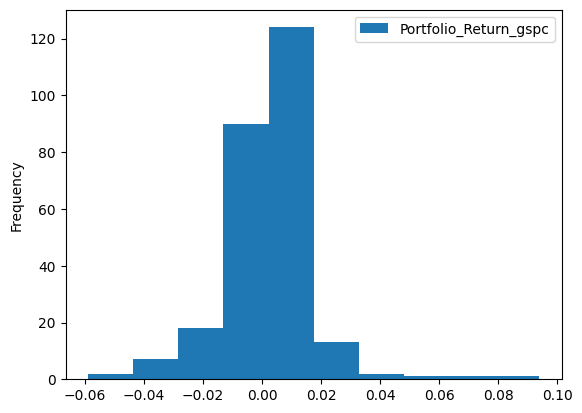

In [ ]:
# Histogram of gspc
case5_gspc.plot.hist()

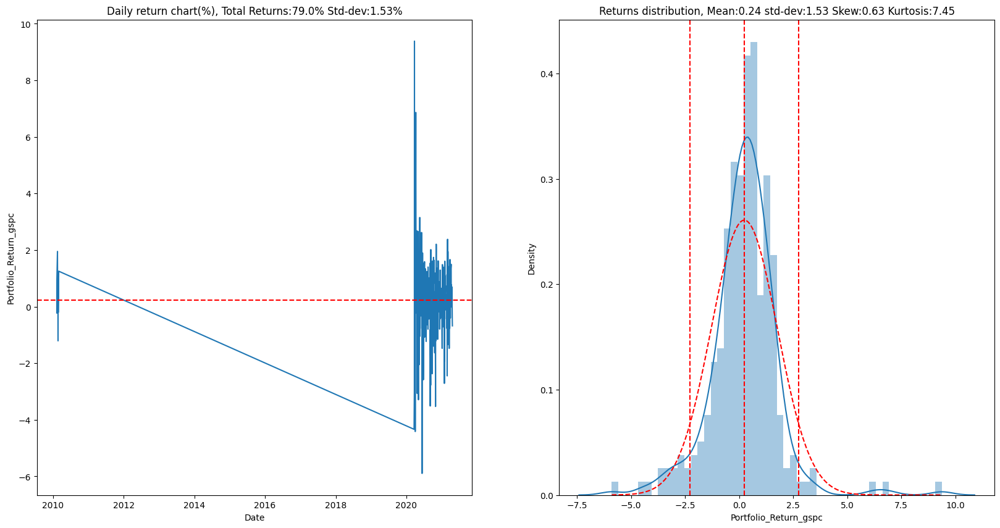

In [ ]:
selected_return5_gspc=case5_gspc.set_index('Date')
plot_dist(selected_return5_gspc)

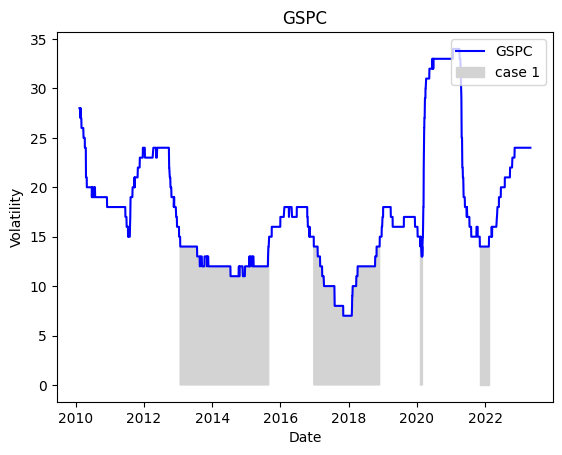

In [ ]:
# Create a figure and axis
fig, ax = plt.subplots()

# Plot the entire '^GSPC' column
ax.plot(ann_vol_portfolio['DateTime'],ann_vol_portfolio['^GSPC'], color='blue', label='GSPC')


# Create a mask for the condition
mask1 = (ann_vol_portfolio['^GSPC'] < 15) & (ann_vol_portfolio['^GSPC'].diff() <10)

# Shade the regions where the condition is met
ax.fill_between(ann_vol_portfolio['DateTime'], ann_vol_portfolio['^GSPC'], where=mask1, color='lightgray',label='case 1')


# Set labels and title
ax.set_xlabel('Date')
ax.set_ylabel('Volatility')
ax.set_title('GSPC')
ax.legend(loc='upper right')

# Show the plot
plt.show()

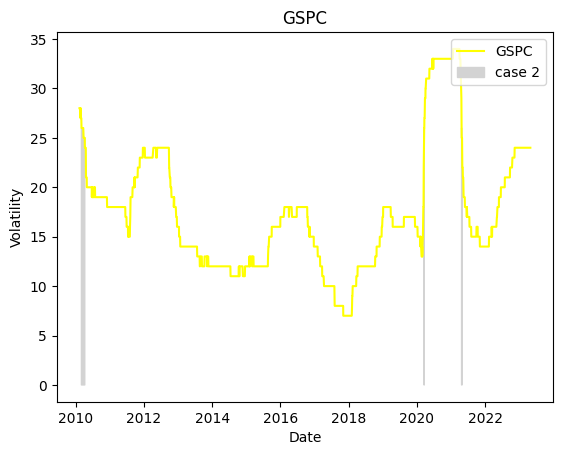

In [ ]:
# Create a figure and axis
fig, ax = plt.subplots()

# Plot the entire '^GSPC' column
ax.plot(ann_vol_portfolio['DateTime'],ann_vol_portfolio['^GSPC'], color='yellow', label='GSPC')


# Create a mask for the condition
mask2 = (((27 > ann_vol_portfolio['^GSPC']) & (ann_vol_portfolio['^GSPC'] >= 25)) | ((15 > ann_vol_portfolio['^GSPC'].diff()) & (ann_vol_portfolio['^GSPC'].diff() > 10)))

# Shade the regions where the condition is met
ax.fill_between(ann_vol_portfolio['DateTime'], ann_vol_portfolio['^GSPC'], where=mask2, color='lightgray',label='case 2')


# Set labels and title
ax.set_xlabel('Date')
ax.set_ylabel('Volatility')
ax.set_title('GSPC')
ax.legend(loc='upper right')

# Show the plot
plt.show()

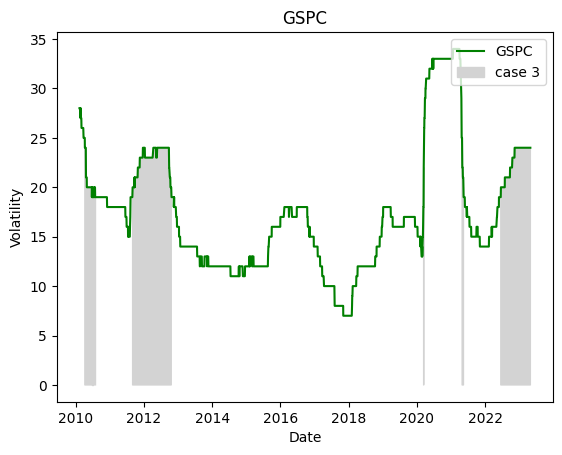

In [ ]:
# Create a figure and axis
fig, ax = plt.subplots()

# Plot the entire '^GSPC' column
ax.plot(ann_vol_portfolio['DateTime'],ann_vol_portfolio['^GSPC'], color='green', label='GSPC')


# Create a mask for the condition
mask3 = (((25 > ann_vol_portfolio['^GSPC']) & (ann_vol_portfolio['^GSPC'] >= 20)) | ((30 > ann_vol_portfolio['^GSPC'].diff()) & (ann_vol_portfolio['^GSPC'].diff() > 20)))

# Shade the regions where the condition is met
ax.fill_between(ann_vol_portfolio['DateTime'], ann_vol_portfolio['^GSPC'], where=mask3, color='lightgray',label='case 3')


# Set labels and title
ax.set_xlabel('Date')
ax.set_ylabel('Volatility')
ax.set_title('GSPC')
ax.legend(loc='upper right')

# Show the plot
plt.show()

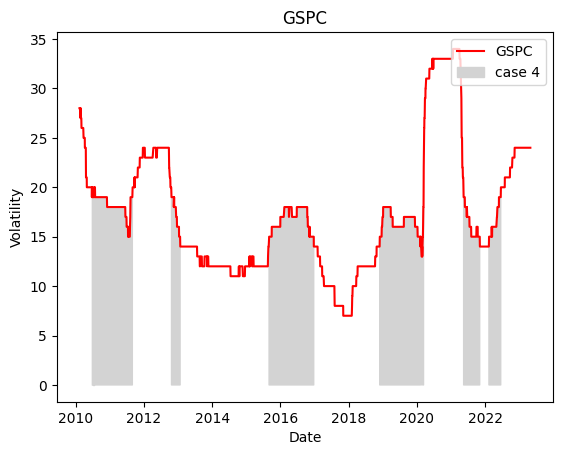

In [ ]:
# Create a figure and axis
fig, ax = plt.subplots()

# Plot the entire '^GSPC' column
ax.plot(ann_vol_portfolio['DateTime'],ann_vol_portfolio['^GSPC'], color='red', label='GSPC')


# Create a mask for the condition
mask4 = (((20 > ann_vol_portfolio['^GSPC']) & (ann_vol_portfolio['^GSPC'] >= 15)) | ((20 > ann_vol_portfolio['^GSPC'].diff()) & (ann_vol_portfolio['^GSPC'].diff() > 15)))

# Shade the regions where the condition is met
ax.fill_between(ann_vol_portfolio['DateTime'], ann_vol_portfolio['^GSPC'], where=mask4, color='lightgray',label='case 4')


# Set labels and title
ax.set_xlabel('Date')
ax.set_ylabel('Volatility')
ax.set_title('GSPC')
ax.legend(loc='upper right')

# Show the plot
plt.show()

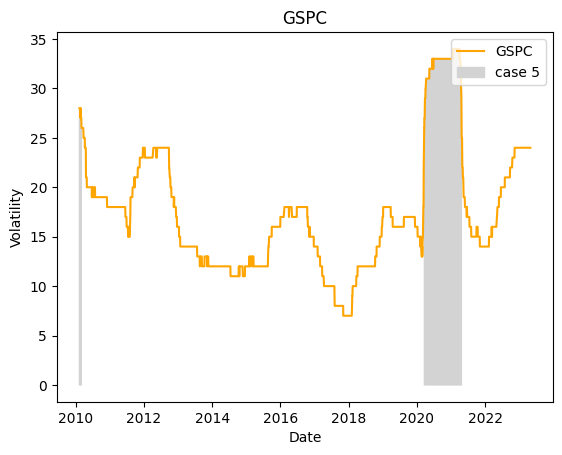

In [ ]:
# Create a figure and axis
fig, ax = plt.subplots()

# Plot the entire '^GSPC' column
ax.plot(ann_vol_portfolio['DateTime'],ann_vol_portfolio['^GSPC'], color='orange', label='GSPC')


# Create a mask for the condition
mask5 = (ann_vol_portfolio['^GSPC'] >= 27) | (ann_vol_portfolio['^GSPC'].diff() > 25)

# Shade the regions where the condition is met
ax.fill_between(ann_vol_portfolio['DateTime'], ann_vol_portfolio['^GSPC'], where=mask5, color='lightgray',label='case 5')


# Set labels and title
ax.set_xlabel('Date')
ax.set_ylabel('Volatility')
ax.set_title('GSPC')
ax.legend(loc='upper right')

# Show the plot
plt.show()



## FOR ^HSI

In [ ]:
#Plot distribution of series
def plot_dist(df):
    figure, axis = plt.subplots(1, 2)
    figure.set_figheight(10)
    figure.set_figwidth(20)
    mean,std,skew,kurt=price_parameters(df['Portfolio_Return_hsi']*100)
    sns.lineplot(data=df['Portfolio_Return_hsi']*100,ax=axis[0])
    axis[0].axhline(mean,color='r',ls='--')
    axis[0].set_title('Daily return chart(%), Total Returns:'+str(round(np.product(1+df['Portfolio_Return_hsi'])-1,2)*100)+'% Std-dev:'+str(std)+'%')
    sns.distplot(df['Portfolio_Return_hsi']*100,bins=50,ax=axis[1])
    x_axis=np.arange(min(df['Portfolio_Return_hsi']*100),max(df['Portfolio_Return_hsi']*100),0.0001)
    axis[1].axvline(mean,color='r',ls='--')
    axis[1].axvline(norm.ppf(0.05, loc=mean, scale=std),ls='--',color='r')
    axis[1].axvline(norm.ppf(0.95, loc=mean, scale=std),ls='--',color='r')
    axis[1].plot(x_axis,norm.pdf(x_axis, loc=mean, scale=std),ls='--',color='r')
    axis[1].set_title('Returns distribution, Mean:'+str(mean)+' std-dev:'+str(std)+' Skew:'+str(skew)+' Kurtosis:'+str(kurt))

In [ ]:
filtered_dates1 = ann_vol_portfolio[((ann_vol_portfolio['^HSI'] < 15) & (ann_vol_portfolio['^HSI'].diff() <10))]['DateTime']
filtered_dates4  = ann_vol_portfolio[(((27 > ann_vol_portfolio['^HSI']) & (ann_vol_portfolio['^HSI'] >= 25)) | ((15 > ann_vol_portfolio['^HSI'].diff()) & (ann_vol_portfolio['^HSI'].diff() > 10)))]['DateTime']
filtered_dates3  = ann_vol_portfolio[(((25 > ann_vol_portfolio['^HSI']) & (ann_vol_portfolio['^HSI'] >= 20)) | ((30 > ann_vol_portfolio['^HSI'].diff()) & (ann_vol_portfolio['^HSI'].diff() > 20)))]['DateTime']
filtered_dates2  = ann_vol_portfolio[(((20 > ann_vol_portfolio['^HSI']) & (ann_vol_portfolio['^HSI'] >= 15)) | ((20 > ann_vol_portfolio['^HSI'].diff()) & (ann_vol_portfolio['^HSI'].diff() > 15)))]['DateTime']
filtered_dates5  = ann_vol_portfolio[((ann_vol_portfolio['^HSI']  >=  27) | (ann_vol_portfolio['^HSI'].diff() >25))]['DateTime']

In [ ]:
# Dates fullfilling the condition
def selected_returns_dataframe(filtered_dates):
  selected_returns = []
  for date in filtered_dates:
    return_value = return_multiData.loc[return_multiData['DateTime'] == date, '^HSI'].values
    if len(return_value) > 0:
        selected_returns.append((date, return_value[0]))

  selected_return=pd.DataFrame(selected_returns)
  selected_return.set_axis(['Date', 'Portfolio_Return_hsi'], axis=1, inplace=True)
  return selected_return

In [ ]:
def filtered_return_dataframe(selected_return_df):
  filtered_return_df = return_multiData[~return_multiData['DateTime'].isin(selected_return_df['Date'])]
  filtered_return_df1=pd.DataFrame()
  filtered_return_df1=filtered_return_df[['DateTime','^HSI']]
  return filtered_return_df1

#### CASE 1

In [ ]:
case1_hsi=selected_returns_dataframe(filtered_dates1)
case1_hsi.head()

,Date,Portfolio_Return_hsi
0,2015-03-20,-0.003827
1,2015-03-23,0.004893
2,2015-03-24,-0.003875
3,2015-03-25,0.005272
4,2015-03-26,-0.001270


In [ ]:
# Comparing filtered dates with the main return dataframes dates and extract date and return from return dataframe which is not fulfilling condition

filt_case1_hsi= filtered_return_dataframe(case1_hsi)
filt_case1_hsi.head()

,DateTime,^HSI
0,2009-01-05,0.034601
1,2009-01-06,-0.003457
2,2009-01-07,-0.033660
3,2009-01-09,-0.040702
4,2009-01-12,-0.028269


In [ ]:
# cumulative product of return which is not satisfied the condition 1
filt_case1_hsi=filt_case1_hsi.set_index('DateTime')
filt_case1_hsi_cumpro=(1+filt_case1_hsi).cumprod()
filt_case1_hsi_cumpro.head()

,^HSI
DateTime,
2009-01-05,1.034601
2009-01-06,1.031025
2009-01-07,0.996321
2009-01-09,0.955768
2009-01-12,0.928749


<Axes: ylabel='Frequency'>

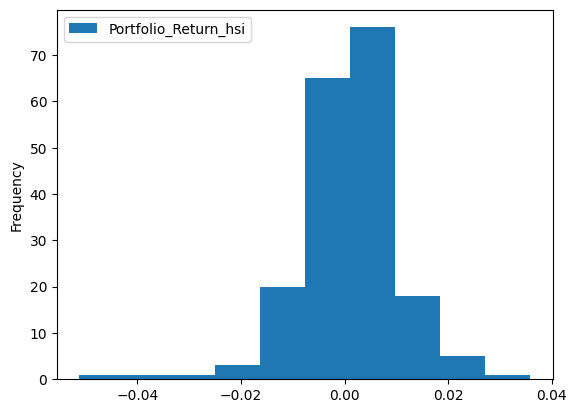

In [ ]:
case1_hsi.plot.hist()

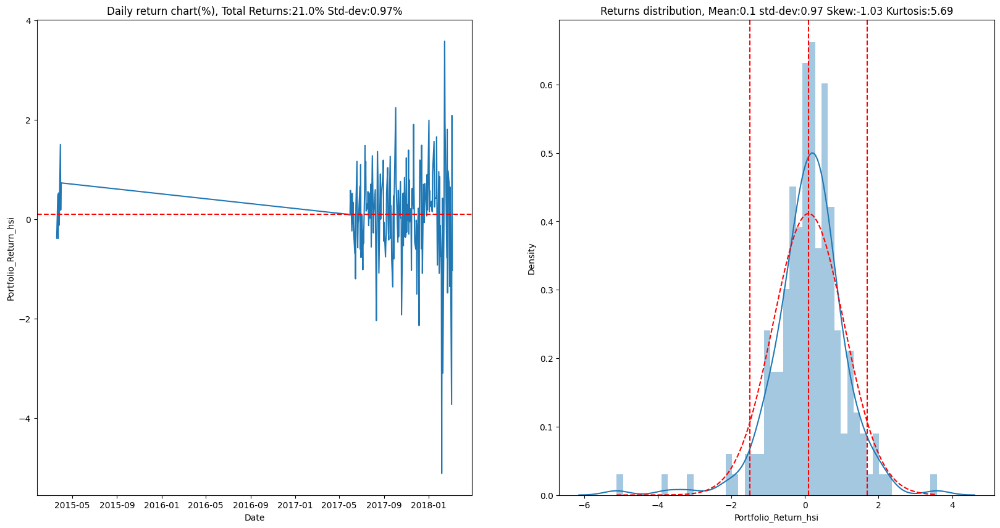

In [ ]:
selected_return1_hsi=case1_hsi.set_index('Date')
plot_dist(selected_return1_hsi)

#### *CASE* 2

In [ ]:
case2_hsi= selected_returns_dataframe(filtered_dates2)
case2_hsi.head()

,Date,Portfolio_Return_hsi
0,2010-12-31,0.001570
1,2011-01-04,0.027481
2,2011-01-05,0.003775
3,2011-01-06,0.001199
4,2011-01-07,-0.004190


In [ ]:
filt_case2_hsi= filtered_return_dataframe(case2_hsi)
filt_case2_hsi.head()

,DateTime,^HSI
0,2009-01-05,0.034601
1,2009-01-06,-0.003457
2,2009-01-07,-0.033660
3,2009-01-09,-0.040702
4,2009-01-12,-0.028269


In [ ]:
# cumulative product of return which is not satisfied the condition 2
filt_case2_hsi=filt_case2_hsi.set_index('DateTime')
filt_case2_hsi_cumpro=(1+filt_case2_hsi).cumprod()
filt_case2_hsi_cumpro.head()

,^HSI
DateTime,
2009-01-05,1.034601
2009-01-06,1.031025
2009-01-07,0.996321
2009-01-09,0.955768
2009-01-12,0.928749


<Axes: ylabel='Frequency'>

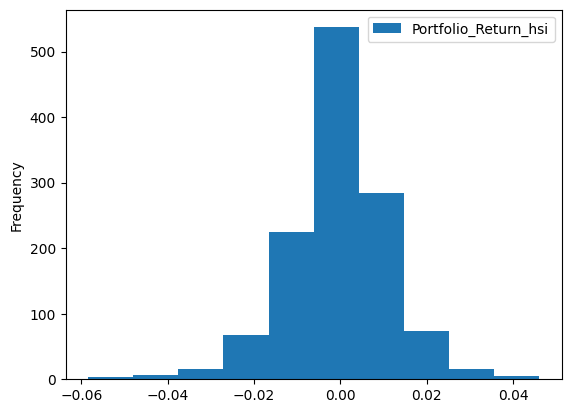

In [ ]:
# Histogram of hsi
case2_hsi.plot.hist()

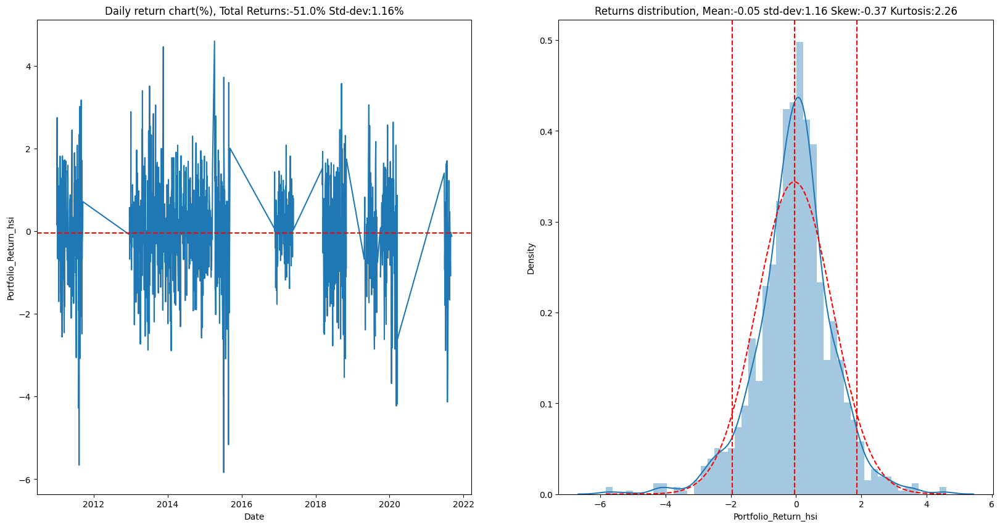

In [ ]:
selected_return2_hsi=case2_hsi.set_index('Date')
plot_dist(selected_return2_hsi)

#### CASE 3

In [ ]:
case3_hsi= selected_returns_dataframe(filtered_dates3)
case3_hsi.head()

,Date,Portfolio_Return_hsi
0,2010-07-07,-0.011305
1,2010-07-08,0.009744
2,2010-07-09,0.016364
3,2010-07-12,0.004356
4,2010-07-13,-0.001777


In [ ]:
filt_case3_hsi= filtered_return_dataframe(case3_hsi)
filt_case3_hsi.head()

,DateTime,^HSI
0,2009-01-05,0.034601
1,2009-01-06,-0.003457
2,2009-01-07,-0.033660
3,2009-01-09,-0.040702
4,2009-01-12,-0.028269


In [ ]:
# cumulative product of return which is not satisfied the condition 3
filt_case3_hsi=filt_case3_hsi.set_index('DateTime')
filt_case3_hsi_cumpro=(1+filt_case3_hsi).cumprod()
filt_case3_hsi_cumpro.head()

,^HSI
DateTime,
2009-01-05,1.034601
2009-01-06,1.031025
2009-01-07,0.996321
2009-01-09,0.955768
2009-01-12,0.928749


<Axes: ylabel='Frequency'>

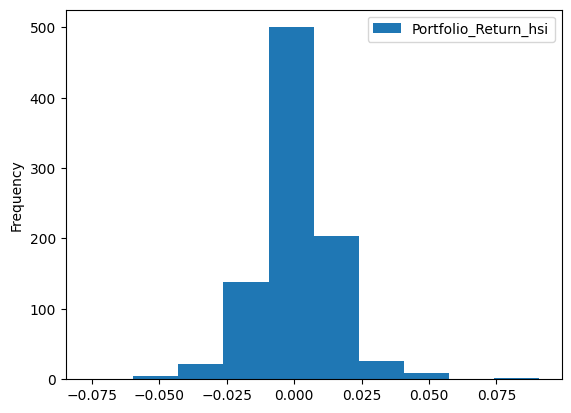

In [ ]:
# Histogram of hsi
case3_hsi.plot.hist()

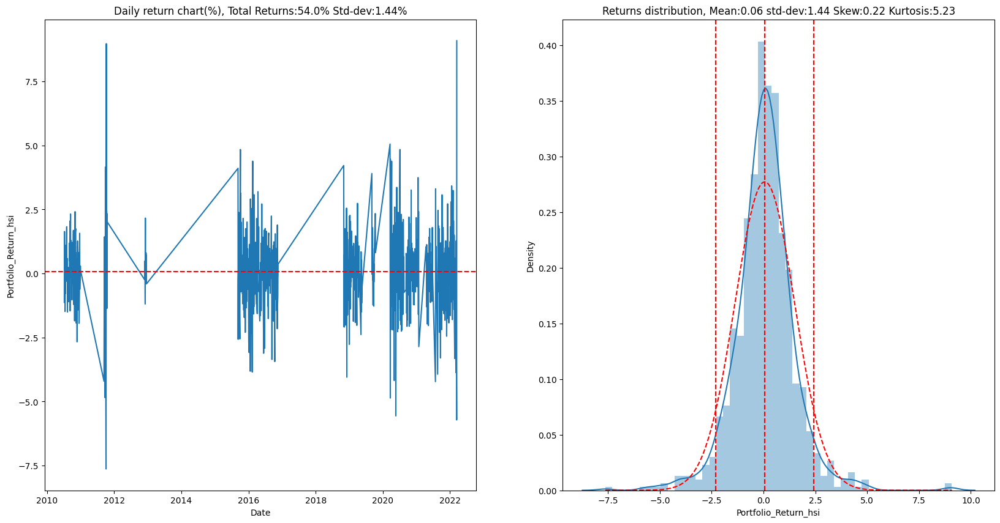

In [ ]:
selected_return3_hsi=case3_hsi.set_index('Date')
plot_dist(selected_return3_hsi)

#### CASE 4

In [ ]:
case4_hsi= selected_returns_dataframe(filtered_dates4)
case4_hsi.head()

,Date,Portfolio_Return_hsi
0,2010-06-07,-0.020319
1,2010-06-08,0.005642
2,2010-06-09,0.006864
3,2010-06-10,0.000584
4,2010-06-11,0.012208


In [ ]:
filt_case4_hsi= filtered_return_dataframe(case4_hsi)
filt_case4_hsi.head()

,DateTime,^HSI
0,2009-01-05,0.034601
1,2009-01-06,-0.003457
2,2009-01-07,-0.033660
3,2009-01-09,-0.040702
4,2009-01-12,-0.028269


In [ ]:
# cumulative product of return which is not satisfied the condition 4
filt_case4_hsi=filt_case4_hsi.set_index('DateTime')
filt_case4_hsi_cumpro=(1+filt_case4_hsi).cumprod()
filt_case4_hsi_cumpro.head()

,^HSI
DateTime,
2009-01-05,1.034601
2009-01-06,1.031025
2009-01-07,0.996321
2009-01-09,0.955768
2009-01-12,0.928749


<Axes: ylabel='Frequency'>

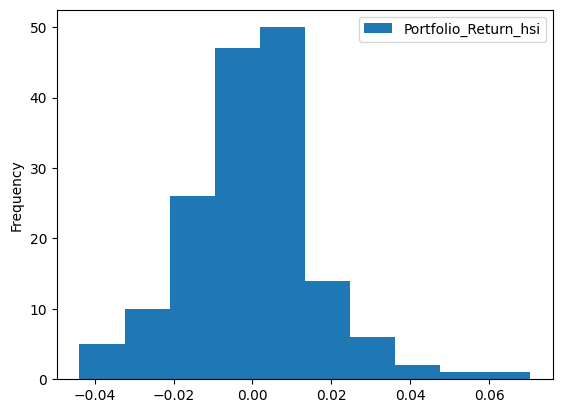

In [ ]:
# Histogram of hsi
case4_hsi.plot.hist()

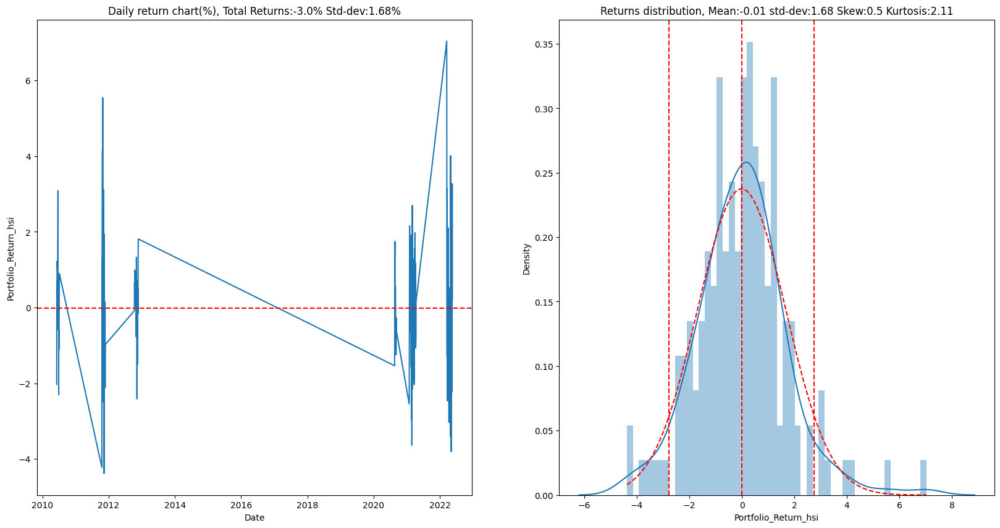

In [ ]:
selected_return4_hsi=case4_hsi.set_index('Date')
plot_dist(selected_return4_hsi)

#### CASE 5

In [ ]:
case5_hsi= selected_returns_dataframe(filtered_dates5)
case5_hsi.head()

,Date,Portfolio_Return_hsi
0,2010-02-10,0.006667
1,2010-02-11,0.018495
2,2010-02-17,0.011992
3,2010-02-18,-0.005448
4,2010-02-19,-0.025861


In [ ]:
filt_case5_hsi= filtered_return_dataframe(case5_hsi)
filt_case5_hsi.head()

,DateTime,^HSI
0,2009-01-05,0.034601
1,2009-01-06,-0.003457
2,2009-01-07,-0.033660
3,2009-01-09,-0.040702
4,2009-01-12,-0.028269


In [ ]:
# cumulative product of return which is not satisfied the condition 5
filt_case5_hsi=filt_case5_hsi.set_index('DateTime')
filt_case5_hsi_cumpro=(1+filt_case5_hsi).cumprod()
filt_case5_hsi_cumpro.head()

,^HSI
DateTime,
2009-01-05,1.034601
2009-01-06,1.031025
2009-01-07,0.996321
2009-01-09,0.955768
2009-01-12,0.928749


<Axes: ylabel='Frequency'>

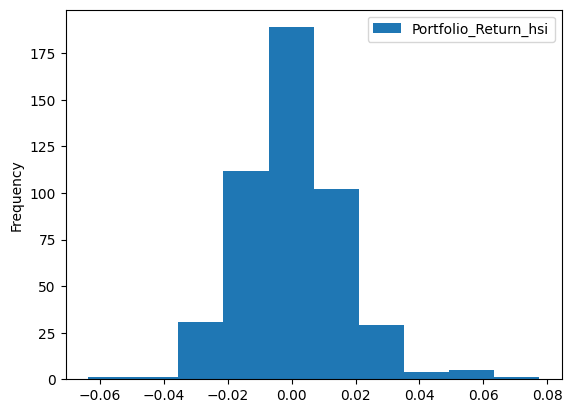

In [ ]:
# Histogram of hsi
case5_hsi.plot.hist()

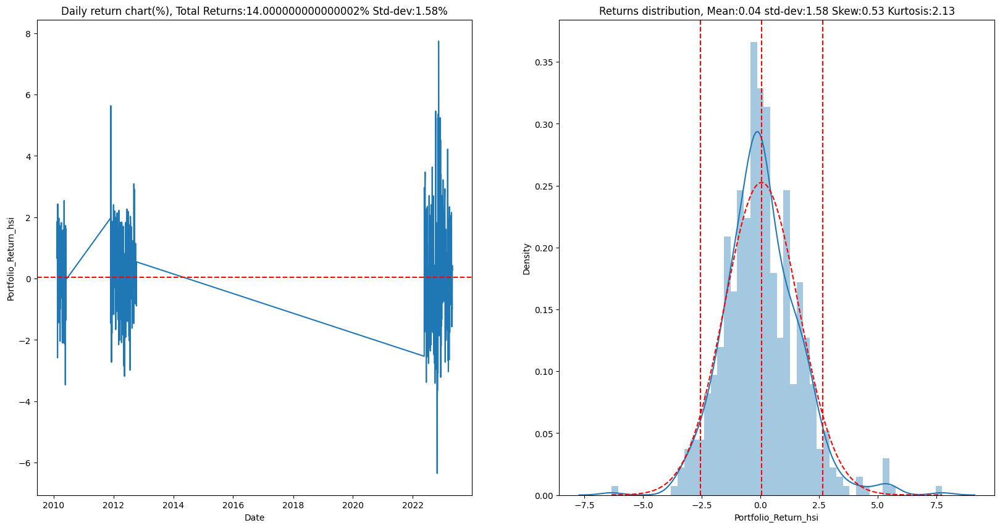

In [ ]:
selected_return5_hsi=case5_hsi.set_index('Date')
plot_dist(selected_return5_hsi)

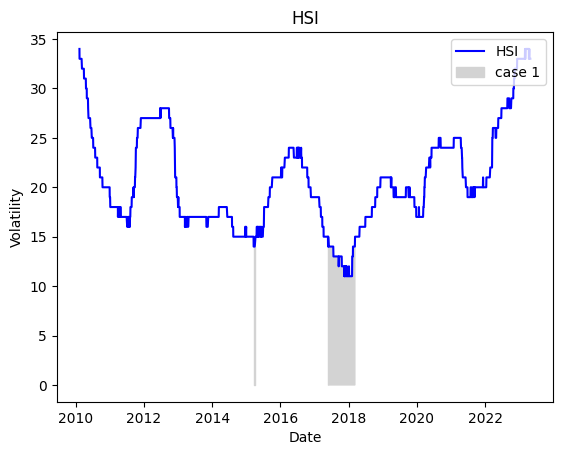

In [ ]:
# Create a figure and axis
fig, ax = plt.subplots()

ax.plot(ann_vol_portfolio['DateTime'],ann_vol_portfolio['^HSI'], color='blue', label='HSI')


# Create a mask for the condition
mask1 = (ann_vol_portfolio['^HSI'] < 15) & (ann_vol_portfolio['^HSI'].diff() <10)

# Shade the regions where the condition is met
ax.fill_between(ann_vol_portfolio['DateTime'], ann_vol_portfolio['^HSI'], where=mask1, color='lightgray',label='case 1')


# Set labels and title
ax.set_xlabel('Date')
ax.set_ylabel('Volatility')
ax.set_title('HSI')
ax.legend(loc='upper right')

# Show the plot
plt.show()

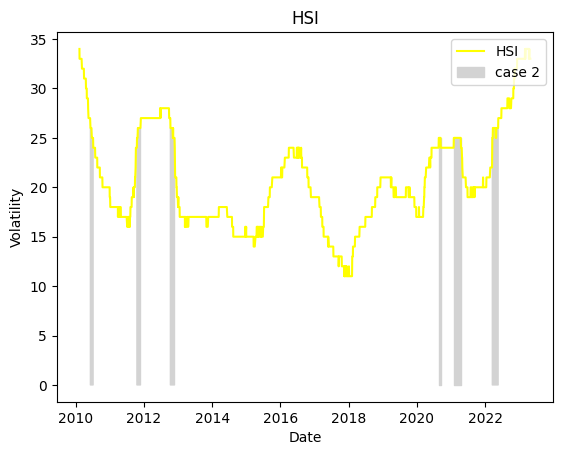

In [ ]:
# Create a figure and axis
fig, ax = plt.subplots()

ax.plot(ann_vol_portfolio['DateTime'],ann_vol_portfolio['^HSI'], color='yellow', label='HSI')


# Create a mask for the condition
mask2 = (((27 > ann_vol_portfolio['^HSI']) & (ann_vol_portfolio['^HSI'] >= 25)) | ((15 > ann_vol_portfolio['^HSI'].diff()) & (ann_vol_portfolio['^HSI'].diff() > 10)))

# Shade the regions where the condition is met
ax.fill_between(ann_vol_portfolio['DateTime'], ann_vol_portfolio['^HSI'], where=mask2, color='lightgray',label='case 2')


# Set labels and title
ax.set_xlabel('Date')
ax.set_ylabel('Volatility')
ax.set_title('HSI')
ax.legend(loc='upper right')

# Show the plot
plt.show()

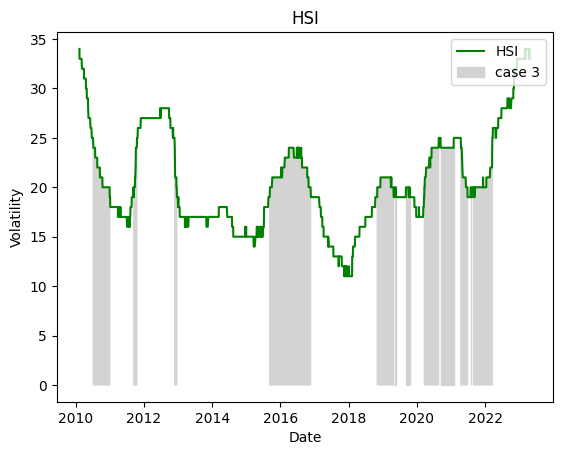

In [ ]:
# Create a figure and axis
fig, ax = plt.subplots()

ax.plot(ann_vol_portfolio['DateTime'],ann_vol_portfolio['^HSI'], color='green', label='HSI')


# Create a mask for the condition
mask3 = (((25 > ann_vol_portfolio['^HSI']) & (ann_vol_portfolio['^HSI'] >= 20)) | ((30 > ann_vol_portfolio['^HSI'].diff()) & (ann_vol_portfolio['^HSI'].diff() > 20)))

# Shade the regions where the condition is met
ax.fill_between(ann_vol_portfolio['DateTime'], ann_vol_portfolio['^HSI'], where=mask3, color='lightgray',label='case 3')


# Set labels and title
ax.set_xlabel('Date')
ax.set_ylabel('Volatility')
ax.set_title('HSI')
ax.legend(loc='upper right')

# Show the plot
plt.show()

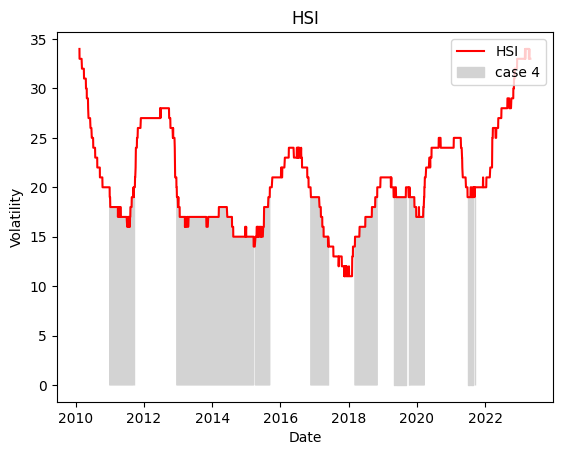

In [ ]:
# Create a figure and axis
fig, ax = plt.subplots()

ax.plot(ann_vol_portfolio['DateTime'],ann_vol_portfolio['^HSI'], color='red', label='HSI')


# Create a mask for the condition
mask4 = (((20 > ann_vol_portfolio['^HSI']) & (ann_vol_portfolio['^HSI'] >= 15)) | ((20 > ann_vol_portfolio['^HSI'].diff()) & (ann_vol_portfolio['^HSI'].diff() > 15)))

# Shade the regions where the condition is met
ax.fill_between(ann_vol_portfolio['DateTime'], ann_vol_portfolio['^HSI'], where=mask4, color='lightgray',label='case 4')


# Set labels and title
ax.set_xlabel('Date')
ax.set_ylabel('Volatility')
ax.set_title('HSI')
ax.legend(loc='upper right')

# Show the plot
plt.show()

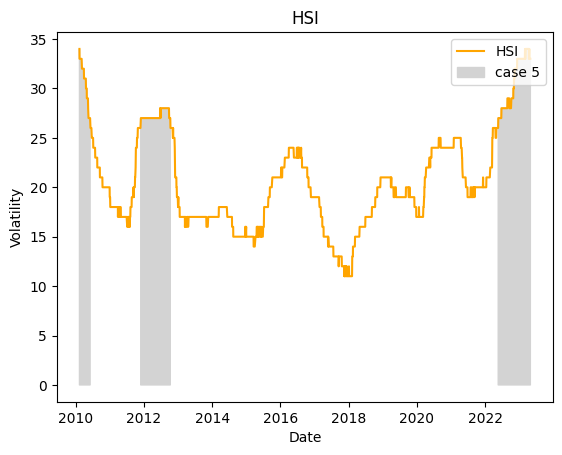

In [ ]:
# Create a figure and axis
fig, ax = plt.subplots()

ax.plot(ann_vol_portfolio['DateTime'],ann_vol_portfolio['^HSI'], color='orange', label='HSI')


# Create a mask for the condition
mask5 = (ann_vol_portfolio['^HSI'] >= 27) | (ann_vol_portfolio['^HSI'].diff() > 25)

# Shade the regions where the condition is met
ax.fill_between(ann_vol_portfolio['DateTime'], ann_vol_portfolio['^HSI'], where=mask5, color='lightgray',label='case 5')


# Set labels and title
ax.set_xlabel('Date')
ax.set_ylabel('Volatility')
ax.set_title('HSI')
ax.legend(loc='upper right')

# Show the plot
plt.show()



## FOR ^NSEI

In [ ]:
#Plot distribution of series
def plot_dist(df):
    figure, axis = plt.subplots(1, 2)
    figure.set_figheight(10)
    figure.set_figwidth(20)
    mean,std,skew,kurt=price_parameters(df['Portfolio_Return_nsei']*100)
    sns.lineplot(data=df['Portfolio_Return_nsei']*100,ax=axis[0])
    axis[0].axhline(mean,color='r',ls='--')
    axis[0].set_title('Daily return chart(%), Total Returns:'+str(round(np.product(1+df['Portfolio_Return_nsei'])-1,2)*100)+'% Std-dev:'+str(std)+'%')
    sns.distplot(df['Portfolio_Return_nsei']*100,bins=50,ax=axis[1])
    x_axis=np.arange(min(df['Portfolio_Return_nsei']*100),max(df['Portfolio_Return_nsei']*100),0.0001)
    axis[1].axvline(mean,color='r',ls='--')
    axis[1].axvline(norm.ppf(0.05, loc=mean, scale=std),ls='--',color='r')
    axis[1].axvline(norm.ppf(0.95, loc=mean, scale=std),ls='--',color='r')
    axis[1].plot(x_axis,norm.pdf(x_axis, loc=mean, scale=std),ls='--',color='r')
    axis[1].set_title('Returns distribution, Mean:'+str(mean)+' std-dev:'+str(std)+' Skew:'+str(skew)+' Kurtosis:'+str(kurt))

In [ ]:
filtered_dates1 = ann_vol_portfolio[((ann_vol_portfolio['^NSEI'] < 15) & (ann_vol_portfolio['^NSEI'].diff() <10))]['DateTime']
filtered_dates4  = ann_vol_portfolio[(((27 > ann_vol_portfolio['^NSEI']) & (ann_vol_portfolio['^NSEI'] >= 25)) | ((15 > ann_vol_portfolio['^NSEI'].diff()) & (ann_vol_portfolio['^NSEI'].diff() > 10)))]['DateTime']
filtered_dates3  = ann_vol_portfolio[(((25 > ann_vol_portfolio['^NSEI']) & (ann_vol_portfolio['^NSEI'] >= 20)) | ((30 > ann_vol_portfolio['^NSEI'].diff()) & (ann_vol_portfolio['^NSEI'].diff() > 20)))]['DateTime']
filtered_dates2  = ann_vol_portfolio[(((20 > ann_vol_portfolio['^NSEI']) & (ann_vol_portfolio['^NSEI'] >= 15)) | ((20 > ann_vol_portfolio['^NSEI'].diff()) & (ann_vol_portfolio['^NSEI'].diff() > 15)))]['DateTime']
filtered_dates5  = ann_vol_portfolio[((ann_vol_portfolio['^NSEI']  >=  27) | (ann_vol_portfolio['^NSEI'].diff() >25))]['DateTime']

In [ ]:
# Dates fullfilling the condition
def selected_returns_dataframe(filtered_dates):
  selected_returns = []
  for date in filtered_dates:
    return_value = return_multiData.loc[return_multiData['DateTime'] == date, '^NSEI'].values
    if len(return_value) > 0:
        selected_returns.append((date, return_value[0]))

  selected_return=pd.DataFrame(selected_returns)
  selected_return.set_axis(['Date', 'Portfolio_Return_nsei'], axis=1, inplace=True)
  return selected_return

In [ ]:
def filtered_return_dataframe(selected_return_df):
  filtered_return_df = return_multiData[~return_multiData['DateTime'].isin(selected_return_df['Date'])]
  filtered_return_df1=pd.DataFrame()
  filtered_return_df1=filtered_return_df[['DateTime','^NSEI']]
  return filtered_return_df1

#### CASE 1

In [ ]:
case1_nsei=selected_returns_dataframe(filtered_dates1)
case1_nsei.head()

,Date,Portfolio_Return_nsei
0,2014-11-11,0.002205
1,2014-11-12,0.002469
2,2014-11-13,-0.003036
3,2014-11-14,0.003835
4,2014-11-17,0.004869


In [ ]:
# Comparing filtered dates with the main return dataframes dates and extract date and return from return dataframe which is not fulfilling condition

filt_case1_nsei= filtered_return_dataframe(case1_nsei)
filt_case1_nsei.head()

,DateTime,^NSEI
0,2009-01-05,0.024518
1,2009-01-06,-0.002771
2,2009-01-07,-0.061809
3,2009-01-09,-0.016231
4,2009-01-12,-0.034772


In [ ]:
# cumulative product of return which is not satisfied the condition 1
filt_case1_nsei=filt_case1_nsei.set_index('DateTime')
filt_case1_nsei_cumpro=(1+filt_case1_nsei).cumprod()
filt_case1_nsei_cumpro.head()

,^NSEI
DateTime,
2009-01-05,1.024518
2009-01-06,1.021679
2009-01-07,0.958530
2009-01-09,0.942972
2009-01-12,0.910183


<Axes: ylabel='Frequency'>

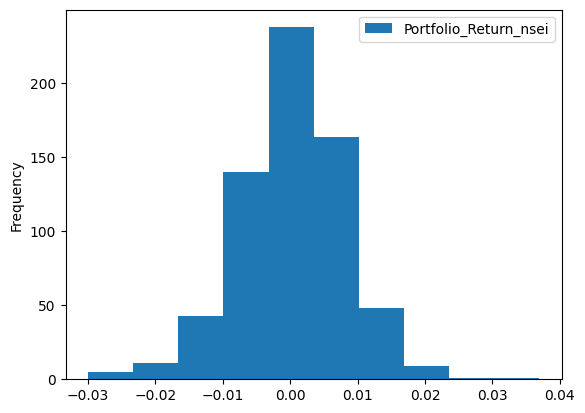

In [ ]:
case1_nsei.plot.hist()

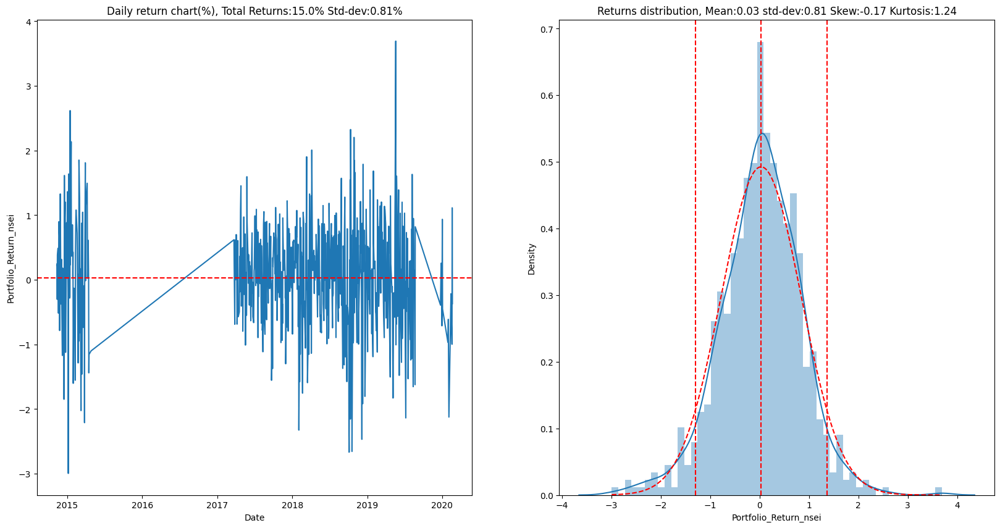

In [ ]:
selected_return1_nsei=case1_nsei.set_index('Date')
plot_dist(selected_return1_nsei)

#### *CASE* 2

In [ ]:
case2_nsei= selected_returns_dataframe(filtered_dates2)
case2_nsei.head()

,Date,Portfolio_Return_nsei
0,2010-08-20,-0.001724
1,2010-08-23,0.002323
2,2010-08-24,-0.006927
3,2010-08-25,-0.007766
4,2010-08-26,0.002847


In [ ]:
filt_case2_nsei= filtered_return_dataframe(case2_nsei)
filt_case2_nsei.head()

,DateTime,^NSEI
0,2009-01-05,0.024518
1,2009-01-06,-0.002771
2,2009-01-07,-0.061809
3,2009-01-09,-0.016231
4,2009-01-12,-0.034772


In [ ]:
# cumulative product of return which is not satisfied the condition 2
filt_case2_nsei=filt_case2_nsei.set_index('DateTime')
filt_case2_nsei_cumpro=(1+filt_case2_nsei).cumprod()
filt_case2_nsei_cumpro.head()

,^NSEI
DateTime,
2009-01-05,1.024518
2009-01-06,1.021679
2009-01-07,0.958530
2009-01-09,0.942972
2009-01-12,0.910183


<Axes: ylabel='Frequency'>

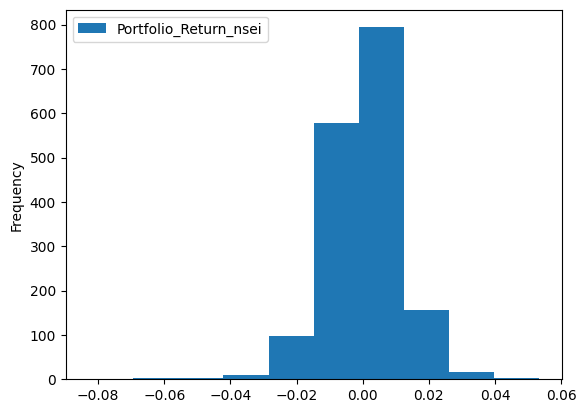

In [ ]:
# Histogram of nsei
case2_nsei.plot.hist()

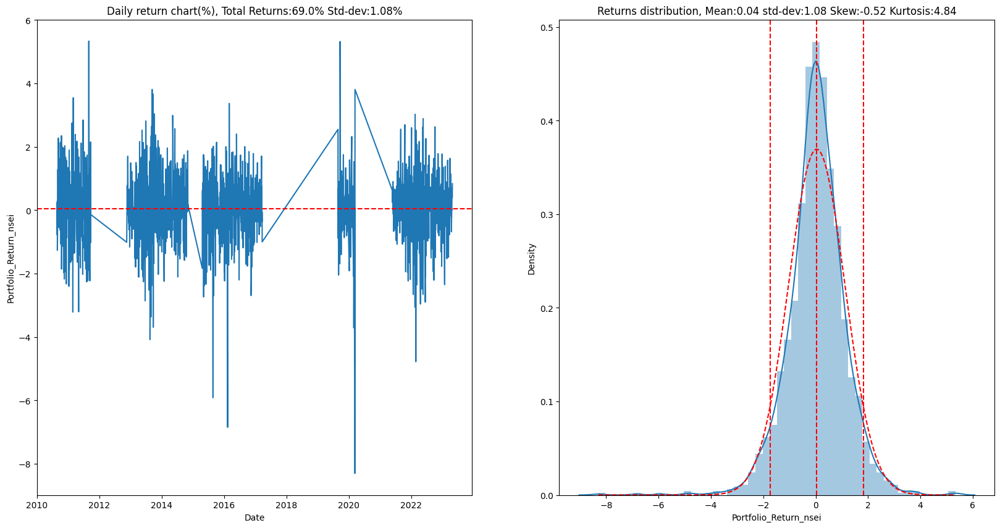

In [ ]:
selected_return2_nsei=case2_nsei.set_index('Date')
plot_dist(selected_return2_nsei)

#### CASE 3

In [ ]:
case3_nsei= selected_returns_dataframe(filtered_dates3)
case3_nsei.head()

,Date,Portfolio_Return_nsei
0,2010-06-23,0.001241
1,2010-06-24,-0.000479
2,2010-06-25,-0.009689
3,2010-06-28,0.012232
4,2010-06-29,-0.014503


In [ ]:
filt_case3_nsei= filtered_return_dataframe(case3_nsei)
filt_case3_nsei.head()

,DateTime,^NSEI
0,2009-01-05,0.024518
1,2009-01-06,-0.002771
2,2009-01-07,-0.061809
3,2009-01-09,-0.016231
4,2009-01-12,-0.034772


In [ ]:
# cumulative product of return which is not satisfied the condition 3
filt_case3_nsei=filt_case3_nsei.set_index('DateTime')
filt_case3_nsei_cumpro=(1+filt_case3_nsei).cumprod()
filt_case3_nsei_cumpro.head()

,^NSEI
DateTime,
2009-01-05,1.024518
2009-01-06,1.021679
2009-01-07,0.958530
2009-01-09,0.942972
2009-01-12,0.910183


<Axes: ylabel='Frequency'>

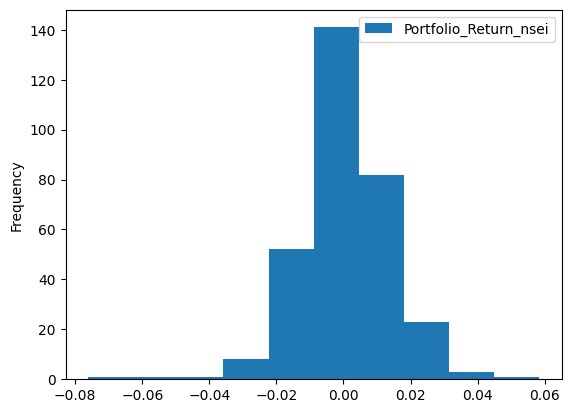

In [ ]:
# Histogram of nsei
case3_nsei.plot.hist()

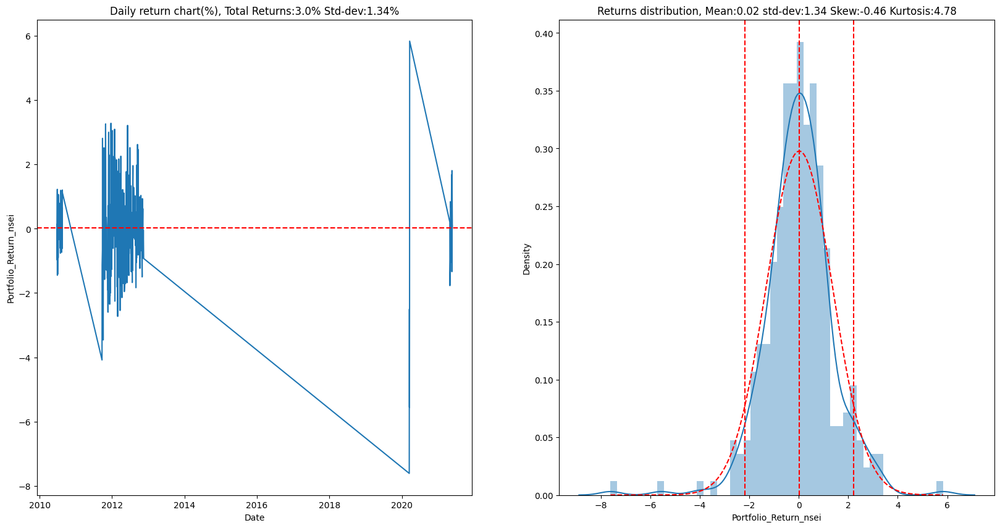

In [ ]:
selected_return3_nsei=case3_nsei.set_index('Date')
plot_dist(selected_return3_nsei)

#### CASE 4

In [ ]:
case4_nsei= selected_returns_dataframe(filtered_dates4)
case4_nsei.head()

,Date,Portfolio_Return_nsei
0,2020-03-23,-0.129805
1,2020-03-24,0.025071
2,2020-03-25,0.066247


In [ ]:
filt_case4_nsei= filtered_return_dataframe(case4_nsei)
filt_case4_nsei.head()

,DateTime,^NSEI
0,2009-01-05,0.024518
1,2009-01-06,-0.002771
2,2009-01-07,-0.061809
3,2009-01-09,-0.016231
4,2009-01-12,-0.034772


In [ ]:
# cumulative product of return which is not satisfied the condition 4
filt_case4_nsei=filt_case4_nsei.set_index('DateTime')
filt_case4_nsei_cumpro=(1+filt_case4_nsei).cumprod()
filt_case4_nsei_cumpro.head()

,^NSEI
DateTime,
2009-01-05,1.024518
2009-01-06,1.021679
2009-01-07,0.958530
2009-01-09,0.942972
2009-01-12,0.910183


<Axes: ylabel='Frequency'>

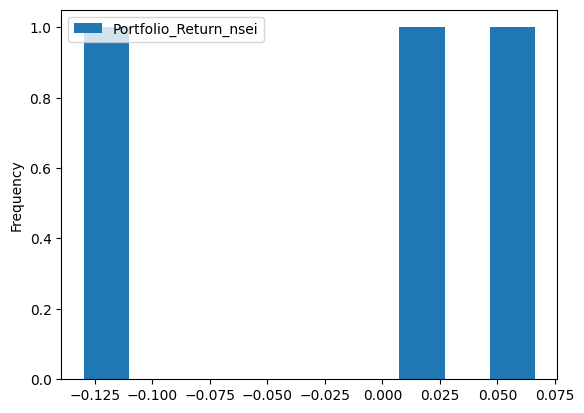

In [ ]:
# Histogram of nsei
case4_nsei.plot.hist()

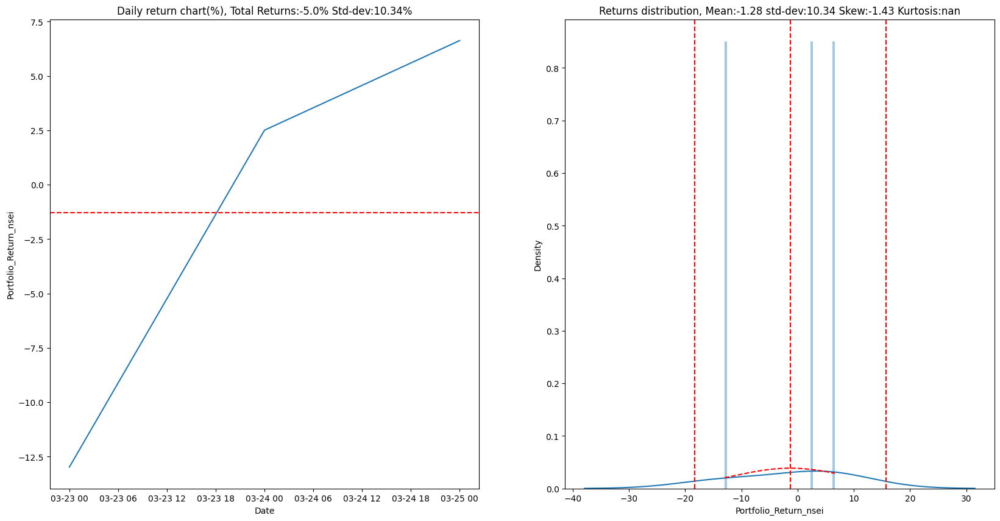

In [ ]:
selected_return4_nsei=case4_nsei.set_index('Date')
plot_dist(selected_return4_nsei)

#### CASE 5

In [ ]:
case5_nsei= selected_returns_dataframe(filtered_dates5)
case5_nsei.head()

,Date,Portfolio_Return_nsei
0,2010-02-10,-0.007397
1,2010-02-11,0.014641
2,2010-02-17,0.018055
3,2010-02-18,-0.005342
4,2010-02-19,-0.008767


In [ ]:
filt_case5_nsei= filtered_return_dataframe(case5_nsei)
filt_case5_nsei.head()

,DateTime,^NSEI
0,2009-01-05,0.024518
1,2009-01-06,-0.002771
2,2009-01-07,-0.061809
3,2009-01-09,-0.016231
4,2009-01-12,-0.034772


In [ ]:
# cumulative product of return which is not satisfied the condition 5
filt_case5_nsei=filt_case5_nsei.set_index('DateTime')
filt_case5_nsei_cumpro=(1+filt_case5_nsei).cumprod()
filt_case5_nsei_cumpro.head()

,^NSEI
DateTime,
2009-01-05,1.024518
2009-01-06,1.021679
2009-01-07,0.958530
2009-01-09,0.942972
2009-01-12,0.910183


<Axes: ylabel='Frequency'>

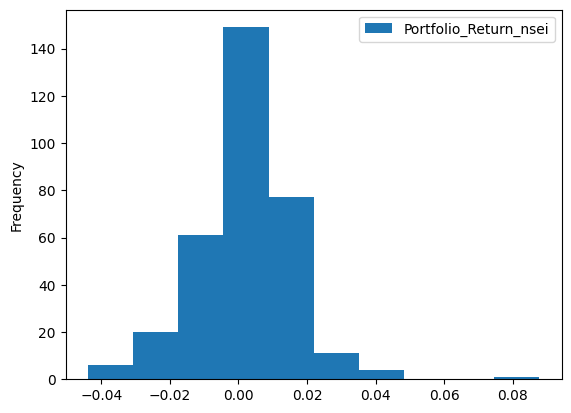

In [ ]:
# Histogram of nsei
case5_nsei.plot.hist()

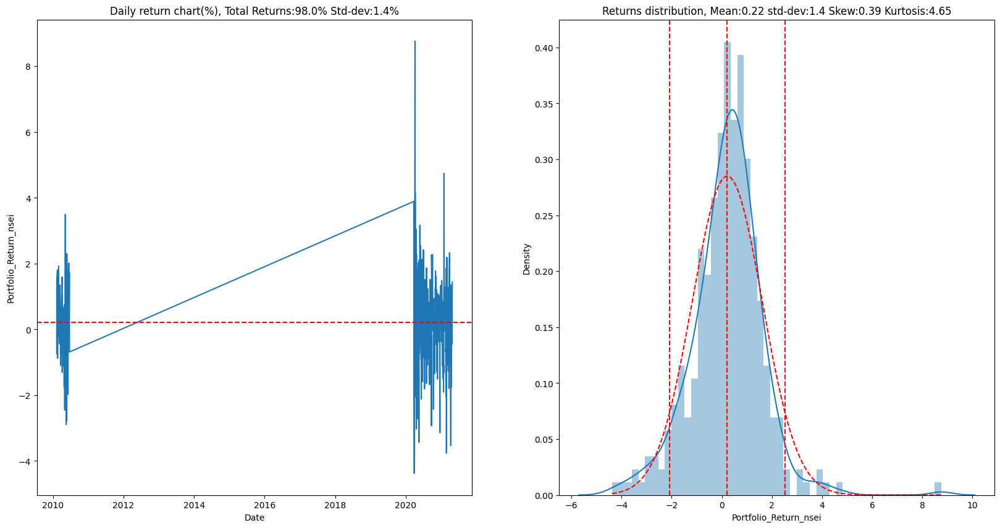

In [ ]:
selected_return5_nsei=case5_nsei.set_index('Date')
plot_dist(selected_return5_nsei)

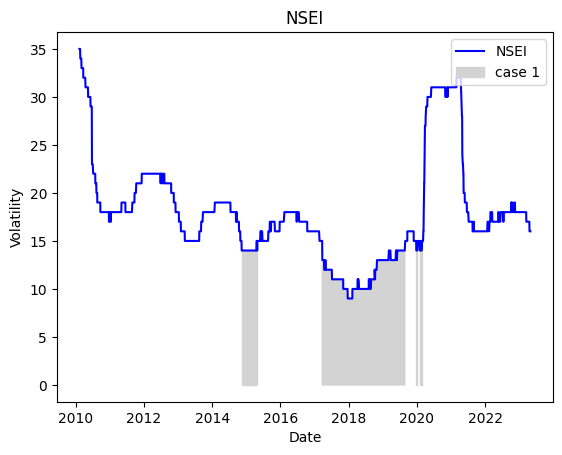

In [ ]:
# Create a figure and axis
fig, ax = plt.subplots()

ax.plot(ann_vol_portfolio['DateTime'],ann_vol_portfolio['^NSEI'], color='blue', label='NSEI')


# Create a mask for the condition
mask1 = (ann_vol_portfolio['^NSEI'] < 15) & (ann_vol_portfolio['^NSEI'].diff() <10)

# Shade the regions where the condition is met
ax.fill_between(ann_vol_portfolio['DateTime'], ann_vol_portfolio['^NSEI'], where=mask1, color='lightgray',label='case 1')


# Set labels and title
ax.set_xlabel('Date')
ax.set_ylabel('Volatility')
ax.set_title('NSEI')
ax.legend(loc='upper right')

# Show the plot
plt.show()

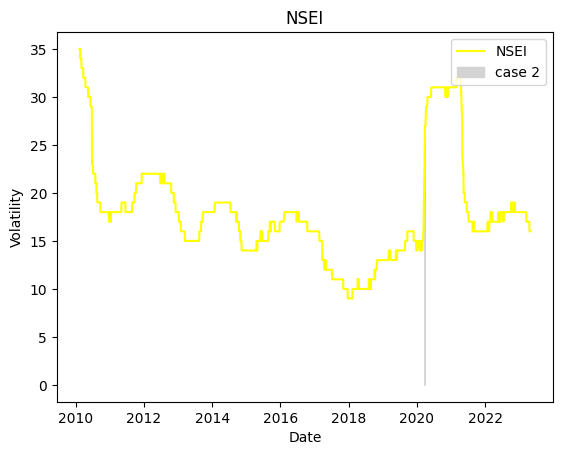

In [ ]:
# Create a figure and axis
fig, ax = plt.subplots()

ax.plot(ann_vol_portfolio['DateTime'],ann_vol_portfolio['^NSEI'], color='yellow', label='NSEI')


# Create a mask for the condition
mask2 = (((27 > ann_vol_portfolio['^NSEI']) & (ann_vol_portfolio['^NSEI'] >= 25)) | ((15 > ann_vol_portfolio['^NSEI'].diff()) & (ann_vol_portfolio['^NSEI'].diff() > 10)))

# Shade the regions where the condition is met
ax.fill_between(ann_vol_portfolio['DateTime'], ann_vol_portfolio['^NSEI'], where=mask2, color='lightgray',label='case 2')


# Set labels and title
ax.set_xlabel('Date')
ax.set_ylabel('Volatility')
ax.set_title('NSEI')
ax.legend(loc='upper right')

# Show the plot
plt.show()

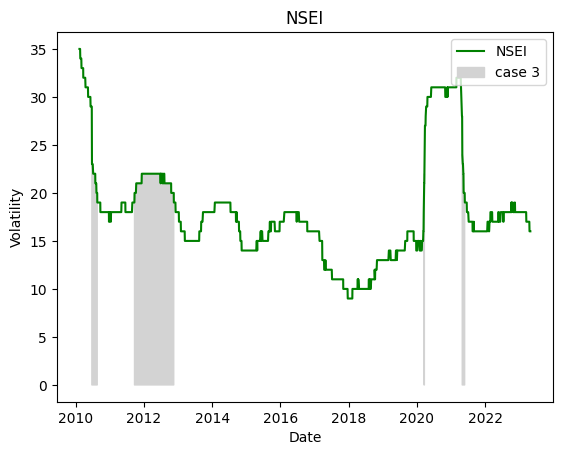

In [ ]:
# Create a figure and axis
fig, ax = plt.subplots()

ax.plot(ann_vol_portfolio['DateTime'],ann_vol_portfolio['^NSEI'], color='green', label='NSEI')


# Create a mask for the condition
mask3 = (((25 > ann_vol_portfolio['^NSEI']) & (ann_vol_portfolio['^NSEI'] >= 20)) | ((30 > ann_vol_portfolio['^NSEI'].diff()) & (ann_vol_portfolio['^NSEI'].diff() > 20)))

# Shade the regions where the condition is met
ax.fill_between(ann_vol_portfolio['DateTime'], ann_vol_portfolio['^NSEI'], where=mask3, color='lightgray',label='case 3')


# Set labels and title
ax.set_xlabel('Date')
ax.set_ylabel('Volatility')
ax.set_title('NSEI')
ax.legend(loc='upper right')

# Show the plot
plt.show()

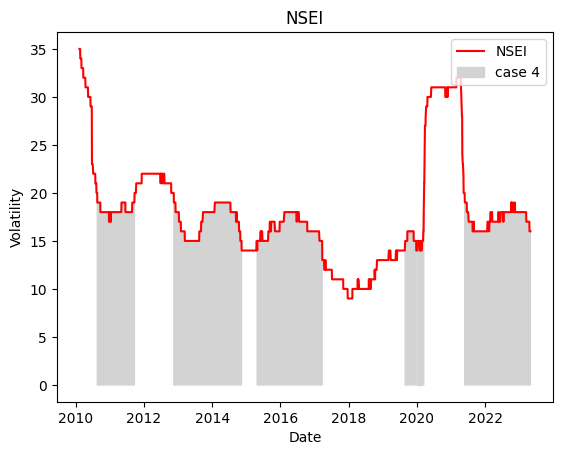

In [ ]:
# Create a figure and axis
fig, ax = plt.subplots()

ax.plot(ann_vol_portfolio['DateTime'],ann_vol_portfolio['^NSEI'], color='red', label='NSEI')


# Create a mask for the condition
mask4 = (((20 > ann_vol_portfolio['^NSEI']) & (ann_vol_portfolio['^NSEI'] >= 15)) | ((20 > ann_vol_portfolio['^NSEI'].diff()) & (ann_vol_portfolio['^NSEI'].diff() > 15)))

# Shade the regions where the condition is met
ax.fill_between(ann_vol_portfolio['DateTime'], ann_vol_portfolio['^NSEI'], where=mask4, color='lightgray',label='case 4')


# Set labels and title
ax.set_xlabel('Date')
ax.set_ylabel('Volatility')
ax.set_title('NSEI')
ax.legend(loc='upper right')

# Show the plot
plt.show()

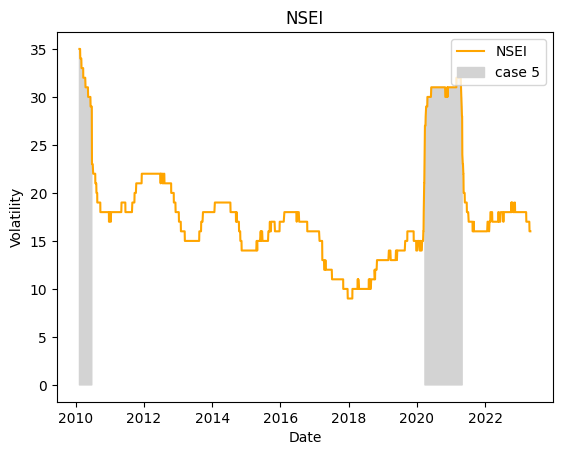

In [ ]:
# Create a figure and axis
fig, ax = plt.subplots()

ax.plot(ann_vol_portfolio['DateTime'],ann_vol_portfolio['^NSEI'], color='orange', label='NSEI')


# Create a mask for the condition
mask5 = (ann_vol_portfolio['^NSEI'] >= 27) | (ann_vol_portfolio['^NSEI'].diff() > 25)

# Shade the regions where the condition is met
ax.fill_between(ann_vol_portfolio['DateTime'], ann_vol_portfolio['^NSEI'], where=mask5, color='lightgray',label='case 5')


# Set labels and title
ax.set_xlabel('Date')
ax.set_ylabel('Volatility')
ax.set_title('NSEI')
ax.legend(loc='upper right')

# Show the plot
plt.show()



## FOR GLD

In [ ]:
#Plot distribution of series
def plot_dist(df):
    figure, axis = plt.subplots(1, 2)
    figure.set_figheight(10)
    figure.set_figwidth(20)
    mean,std,skew,kurt=price_parameters(df['Portfolio_Return_gld']*100)
    sns.lineplot(data=df['Portfolio_Return_gld']*100,ax=axis[0])
    axis[0].axhline(mean,color='r',ls='--')
    axis[0].set_title('Daily return chart(%), Total Returns:'+str(round(np.product(1+df['Portfolio_Return_gld'])-1,2)*100)+'% Std-dev:'+str(std)+'%')
    sns.distplot(df['Portfolio_Return_gld']*100,bins=50,ax=axis[1])
    x_axis=np.arange(min(df['Portfolio_Return_gld']*100),max(df['Portfolio_Return_gld']*100),0.0001)
    axis[1].axvline(mean,color='r',ls='--')
    axis[1].axvline(norm.ppf(0.05, loc=mean, scale=std),ls='--',color='r')
    axis[1].axvline(norm.ppf(0.95, loc=mean, scale=std),ls='--',color='r')
    axis[1].plot(x_axis,norm.pdf(x_axis, loc=mean, scale=std),ls='--',color='r')
    axis[1].set_title('Returns distribution, Mean:'+str(mean)+' std-dev:'+str(std)+' Skew:'+str(skew)+' Kurtosis:'+str(kurt))

In [ ]:
filtered_dates1 = ann_vol_portfolio[((ann_vol_portfolio['^GSPC'] < 15) & (ann_vol_portfolio['^GSPC'].diff() <10))]['DateTime']
filtered_dates4  = ann_vol_portfolio[(((27 > ann_vol_portfolio['^GSPC']) & (ann_vol_portfolio['^GSPC'] >= 25)) | ((15 > ann_vol_portfolio['^GSPC'].diff()) & (ann_vol_portfolio['^GSPC'].diff() > 10)))]['DateTime']
filtered_dates3  = ann_vol_portfolio[(((25 > ann_vol_portfolio['^GSPC']) & (ann_vol_portfolio['^GSPC'] >= 20)) | ((30 > ann_vol_portfolio['^GSPC'].diff()) & (ann_vol_portfolio['^GSPC'].diff() > 20)))]['DateTime']
filtered_dates2  = ann_vol_portfolio[(((20 > ann_vol_portfolio['^GSPC']) & (ann_vol_portfolio['^GSPC'] >= 15)) | ((20 > ann_vol_portfolio['^GSPC'].diff()) & (ann_vol_portfolio['^GSPC'].diff() > 15)))]['DateTime']
filtered_dates5  = ann_vol_portfolio[((ann_vol_portfolio['^GSPC']  >=  27) | (ann_vol_portfolio['^GSPC'].diff() >25))]['DateTime']

In [ ]:
# Dates fullfilling the condition
def selected_returns_dataframe(filtered_dates):
  selected_returns = []
  for date in filtered_dates:
    return_value = return_multiData.loc[return_multiData['DateTime'] == date, 'GLD'].values
    if len(return_value) > 0:
        selected_returns.append((date, return_value[0]))

  selected_return=pd.DataFrame(selected_returns)
  selected_return.set_axis(['Date', 'Portfolio_Return_gld'], axis=1, inplace=True)
  return selected_return

#### CASE 1

In [ ]:
case1_gld=selected_returns_dataframe(filtered_dates1)
case1_gld.head()

,Date,Portfolio_Return_gld
0,2013-01-23,-0.002810
1,2013-01-24,-0.010968
2,2013-01-25,-0.004770
3,2013-01-29,0.002116
4,2013-01-30,0.007454


<Axes: ylabel='Frequency'>

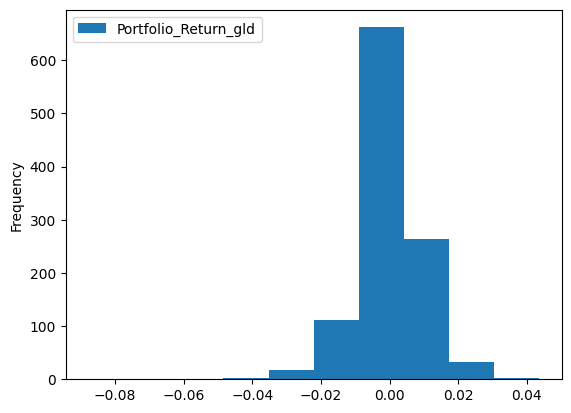

In [ ]:
case1_gld.plot.hist()

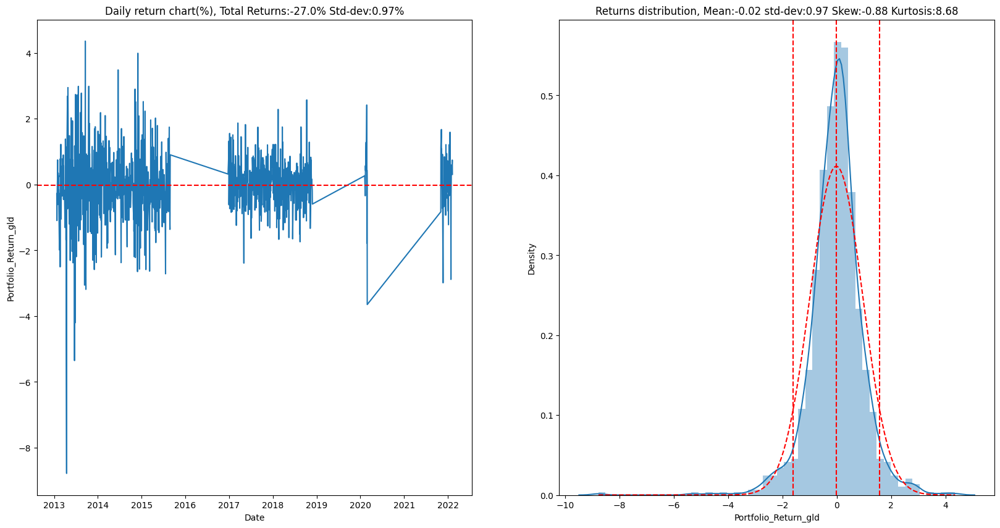

In [ ]:
selected_return1_gld=case1_gld.set_index('Date')
plot_dist(selected_return1_gld)

#### *CASE* 2

In [ ]:
case2_gld= selected_returns_dataframe(filtered_dates2)
case2_gld.head()

,Date,Portfolio_Return_gld
0,2010-06-23,-0.004117
1,2010-06-28,-0.013604
2,2010-07-02,-0.026216
3,2010-07-06,-0.016710
4,2010-07-07,0.010471


<Axes: ylabel='Frequency'>

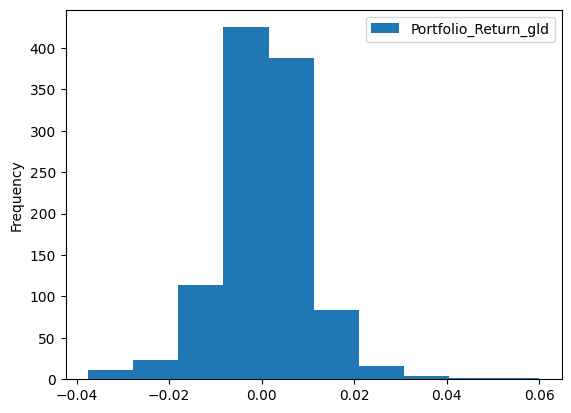

In [ ]:
# Histogram of gld
case2_gld.plot.hist()

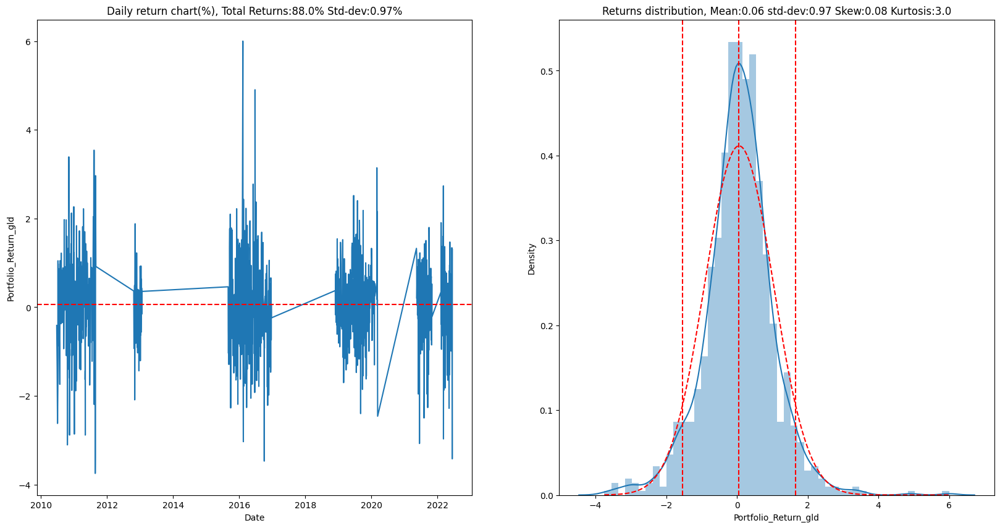

In [ ]:
selected_return2_gld=case2_gld.set_index('Date')
plot_dist(selected_return2_gld)

#### CASE 3

In [ ]:
case3_gld= selected_returns_dataframe(filtered_dates3)
case3_gld.head()

,Date,Portfolio_Return_gld
0,2010-04-09,0.008788
1,2010-04-12,-0.005544
2,2010-04-13,-0.002832
3,2010-04-15,0.008519
4,2010-04-16,-0.021205


<Axes: ylabel='Frequency'>

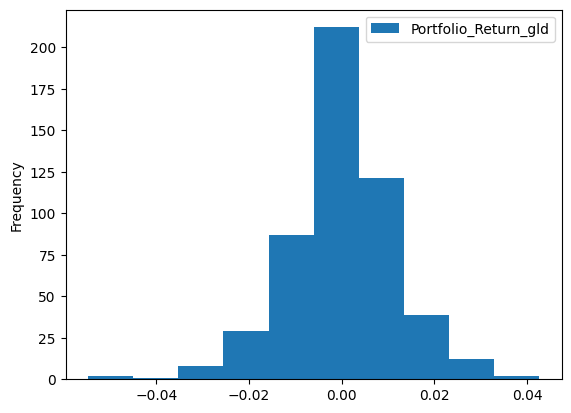

In [ ]:
# Histogram of gld
case3_gld.plot.hist()

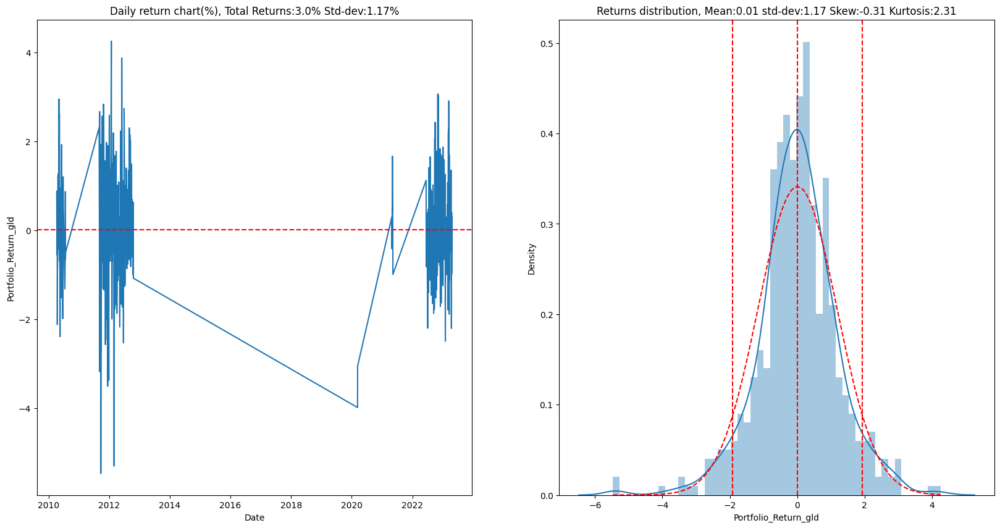

In [ ]:
selected_return3_gld=case3_gld.set_index('Date')
plot_dist(selected_return3_gld)

#### CASE 4

In [ ]:
case4_gld= selected_returns_dataframe(filtered_dates4)
case4_gld.head()

,Date,Portfolio_Return_gld
0,2010-03-03,0.005495
1,2010-03-04,-0.007166
2,2010-03-05,-0.000180
3,2010-03-08,-0.008393
4,2010-03-09,-0.001456


<Axes: ylabel='Frequency'>

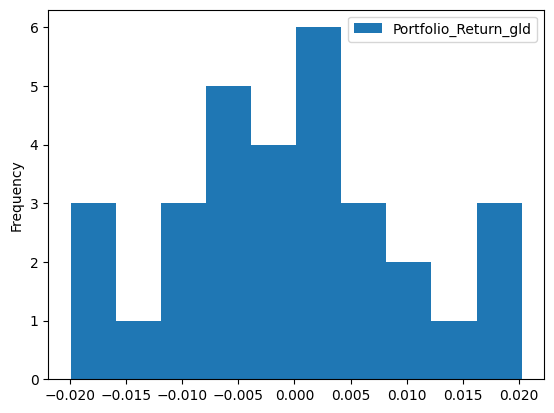

In [ ]:
# Histogram of gld
case4_gld.plot.hist()

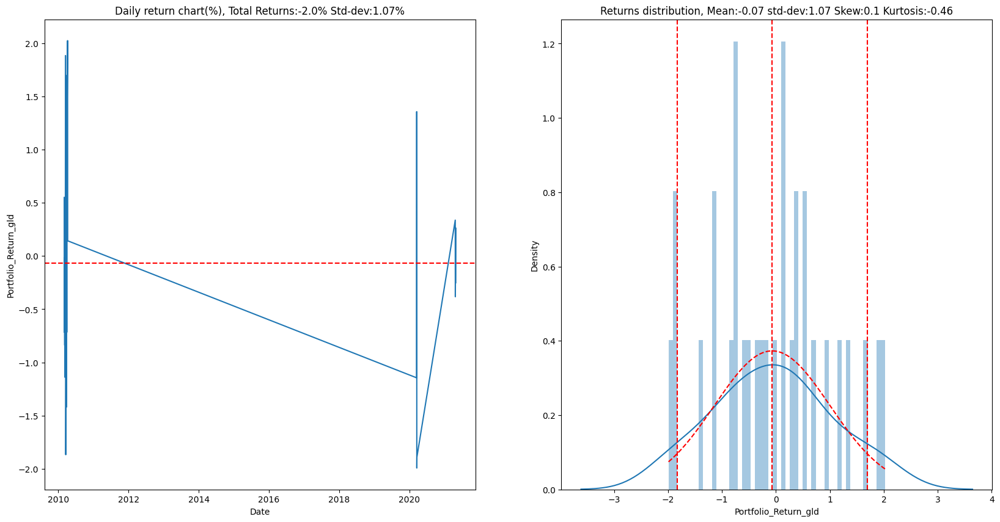

In [ ]:
selected_return4_gld=case4_gld.set_index('Date')
plot_dist(selected_return4_gld)

#### CASE 5

In [ ]:
case5_gld= selected_returns_dataframe(filtered_dates5)
case5_gld.head()

,Date,Portfolio_Return_gld
0,2010-02-10,-0.002751
1,2010-02-11,0.019121
2,2010-02-17,0.019789
3,2010-02-18,0.006682
4,2010-02-19,-0.004637


<Axes: ylabel='Frequency'>

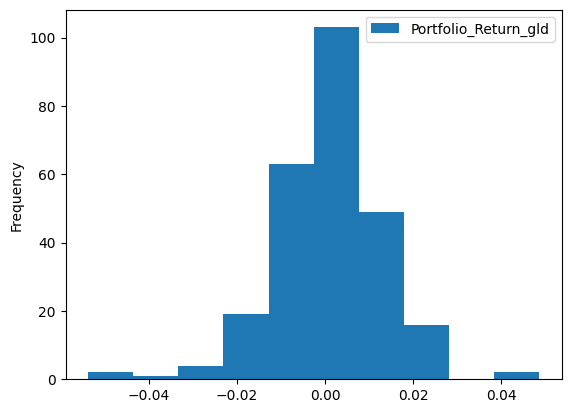

In [ ]:
# Histogram of gld
case5_gld.plot.hist()

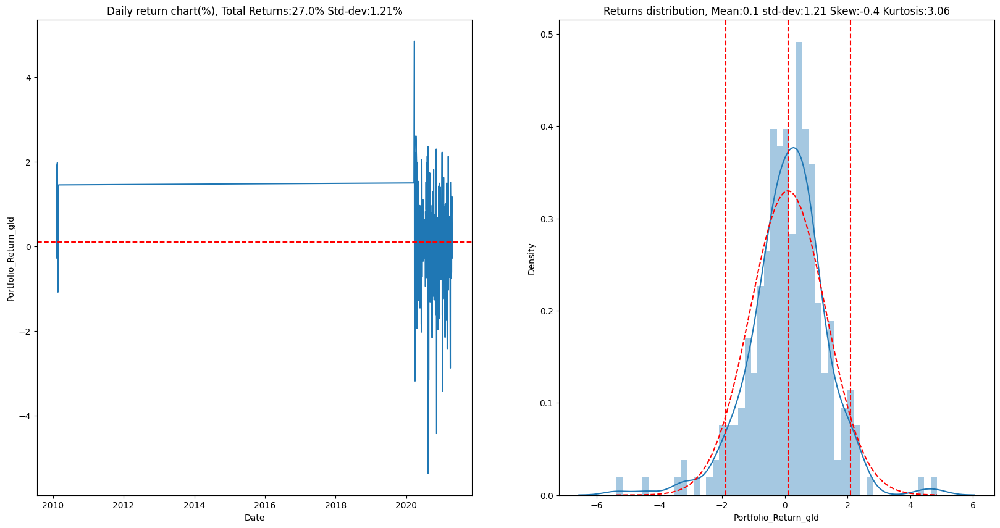

In [ ]:
selected_return5_gld=case5_gld.set_index('Date')
plot_dist(selected_return5_gld)

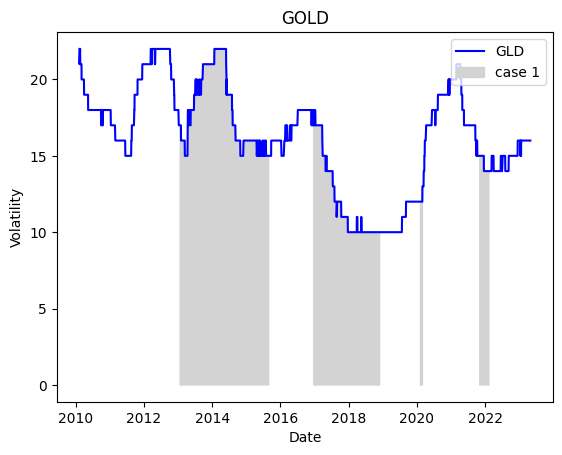

In [ ]:
# Create a figure and axis
fig, ax = plt.subplots()

ax.plot(ann_vol_portfolio['DateTime'],ann_vol_portfolio['GLD'], color='blue', label='GLD')


# Create a mask for the condition
mask1 = (ann_vol_portfolio['^GSPC'] < 15) & (ann_vol_portfolio['^GSPC'].diff() <10)

# Shade the regions where the condition is met
ax.fill_between(ann_vol_portfolio['DateTime'], ann_vol_portfolio['GLD'], where=mask1, color='lightgray',label='case 1')


# Set labels and title
ax.set_xlabel('Date')
ax.set_ylabel('Volatility')
ax.set_title('GOLD')
ax.legend(loc='upper right')

# Show the plot
plt.show()

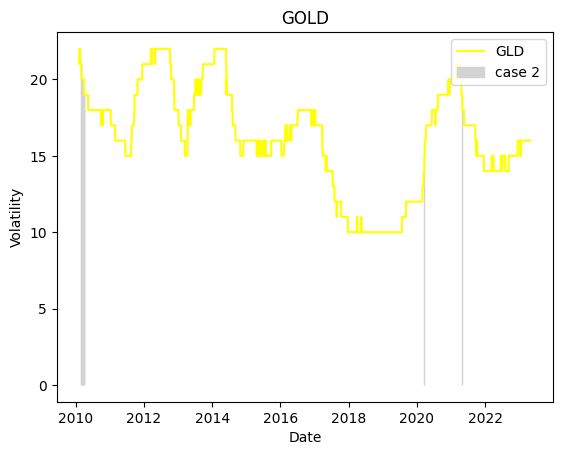

In [ ]:
# Create a figure and axis
fig, ax = plt.subplots()

ax.plot(ann_vol_portfolio['DateTime'],ann_vol_portfolio['GLD'], color='yellow', label='GLD')


# Create a mask for the condition
mask2 = (((27 > ann_vol_portfolio['^GSPC']) & (ann_vol_portfolio['^GSPC'] >= 25)) | ((15 > ann_vol_portfolio['^GSPC'].diff()) & (ann_vol_portfolio['^GSPC'].diff() > 10)))

# Shade the regions where the condition is met
ax.fill_between(ann_vol_portfolio['DateTime'], ann_vol_portfolio['GLD'], where=mask2, color='lightgray',label='case 2')


# Set labels and title
ax.set_xlabel('Date')
ax.set_ylabel('Volatility')
ax.set_title('GOLD')
ax.legend(loc='upper right')

# Show the plot
plt.show()

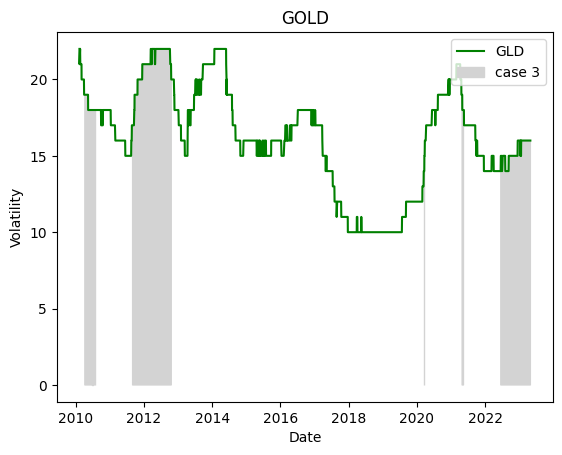

In [ ]:
# Create a figure and axis
fig, ax = plt.subplots()

ax.plot(ann_vol_portfolio['DateTime'],ann_vol_portfolio['GLD'], color='green', label='GLD')


# Create a mask for the condition
mask3 = (((25 > ann_vol_portfolio['^GSPC']) & (ann_vol_portfolio['^GSPC'] >= 20)) | ((30 > ann_vol_portfolio['^GSPC'].diff()) & (ann_vol_portfolio['^GSPC'].diff() > 20)))

# Shade the regions where the condition is met
ax.fill_between(ann_vol_portfolio['DateTime'], ann_vol_portfolio['GLD'], where=mask3, color='lightgray',label='case 3')


# Set labels and title
ax.set_xlabel('Date')
ax.set_ylabel('Volatility')
ax.set_title('GOLD')
ax.legend(loc='upper right')

# Show the plot
plt.show()

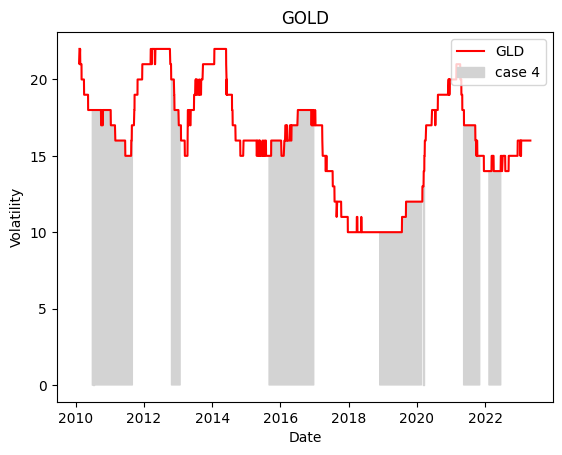

In [ ]:
# Create a figure and axis
fig, ax = plt.subplots()

ax.plot(ann_vol_portfolio['DateTime'],ann_vol_portfolio['GLD'], color='red', label='GLD')


# Create a mask for the condition
mask4 = (((20 > ann_vol_portfolio['^GSPC']) & (ann_vol_portfolio['^GSPC'] >= 15)) | ((20 > ann_vol_portfolio['^GSPC'].diff()) & (ann_vol_portfolio['^GSPC'].diff() > 15)))

# Shade the regions where the condition is met
ax.fill_between(ann_vol_portfolio['DateTime'], ann_vol_portfolio['GLD'], where=mask4, color='lightgray',label='case 4')


# Set labels and title
ax.set_xlabel('Date')
ax.set_ylabel('Volatility')
ax.set_title('GOLD')
ax.legend(loc='upper right')

# Show the plot
plt.show()

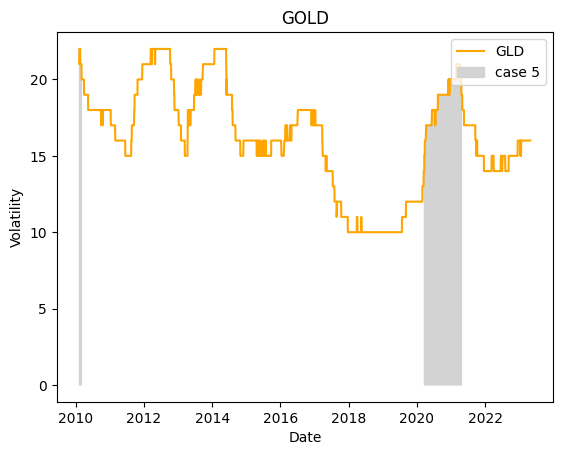

In [ ]:
# Create a figure and axis
fig, ax = plt.subplots()

ax.plot(ann_vol_portfolio['DateTime'],ann_vol_portfolio['GLD'], color='orange', label='GLD')


# Create a mask for the condition
mask5 = (ann_vol_portfolio['^GSPC'] >= 27) | (ann_vol_portfolio['^GSPC'].diff() > 25)

# Shade the regions where the condition is met
ax.fill_between(ann_vol_portfolio['DateTime'], ann_vol_portfolio['GLD'], where=mask5, color='lightgray',label='case 5')


# Set labels and title
ax.set_xlabel('Date')
ax.set_ylabel('Volatility')
ax.set_title('GOLD')
ax.legend(loc='upper right')

# Show the plot
plt.show()



# BOND DATA

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving China 10-Year Bond Yield Historical Data.csv to China 10-Year Bond Yield Historical Data (2).csv
Saving India 10-Year Bond Yield Historical Data.csv to India 10-Year Bond Yield Historical Data (2).csv
Saving United Kingdom 10-Year Bond Yield Historical Data.csv to United Kingdom 10-Year Bond Yield Historical Data (2).csv
Saving United States 10-Year Bond Yield Historical Data.csv to United States 10-Year Bond Yield Historical Data (2).csv


In [ ]:
df_data_us=pd.read_csv('United States 10-Year Bond Yield Historical Data.csv')
df_data_ind=pd.read_csv('India 10-Year Bond Yield Historical Data.csv')
df_data_chi=pd.read_csv('China 10-Year Bond Yield Historical Data.csv')
df_data_uk=pd.read_csv('United Kingdom 10-Year Bond Yield Historical Data.csv')


In [ ]:
df_data_us=df_data_us.set_index('Date')
df_data_chi=df_data_chi.set_index('Date')
df_data_ind=df_data_ind.set_index('Date')
df_data_uk=df_data_uk.set_index('Date')


In [ ]:
df_bond=pd.DataFrame()
df_bond['US_Price']=df_data_us['Price']
df_bond['IN_Price']=df_data_ind['Price']
df_bond['UK_Price']=df_data_uk['Price']

df_bond['CHI_Price']=df_data_chi['Price']

df_bond.head()

,US_Price,IN_Price,UK_Price,CHI_Price
Date,,,,
01/05/2023,3.722,7.327,3.552,2.870
01/04/2023,3.690,7.321,3.493,2.863
01/03/2023,3.752,7.321,3.653,2.873
01/02/2023,3.879,7.340,3.699,NaN
12/30/2022,3.879,7.327,3.669,2.884


In [ ]:
df_bond=df_bond.reset_index()
df_bond

,Date,US_Price,IN_Price,UK_Price,CHI_Price
0,01/05/2023,3.722,7.327,3.552,2.870
1,01/04/2023,3.690,7.321,3.493,2.863
2,01/03/2023,3.752,7.321,3.653,2.873
3,01/02/2023,3.879,7.340,3.699,NaN
4,12/30/2022,3.879,7.327,3.669,2.884
...,...,...,...,...,...
2617,01/08/2013,1.864,7.906,2.030,3.600
2618,01/07/2013,1.901,7.900,2.086,3.590
2619,01/04/2013,1.903,7.930,2.117,3.610
2620,01/03/2013,1.911,7.967,2.073,NaN


In [ ]:
df_bond['Date'] = pd.to_datetime(df_bond['Date'], infer_datetime_format=True)
df_bond=df_bond.set_index('Date')
df_bond


,US_Price,IN_Price,UK_Price,CHI_Price
Date,,,,
2023-01-05,3.722,7.327,3.552,2.870
2023-01-04,3.690,7.321,3.493,2.863
2023-01-03,3.752,7.321,3.653,2.873
2023-01-02,3.879,7.340,3.699,NaN
2022-12-30,3.879,7.327,3.669,2.884
...,...,...,...,...
2013-01-08,1.864,7.906,2.030,3.600
2013-01-07,1.901,7.900,2.086,3.590
2013-01-04,1.903,7.930,2.117,3.610


In [ ]:
df_bond=df_bond.dropna()
df_bond.head()

,US_Price,IN_Price,UK_Price,CHI_Price
Date,,,,
2023-01-05,3.722,7.327,3.552,2.870
2023-01-04,3.690,7.321,3.493,2.863
2023-01-03,3.752,7.321,3.653,2.873
2022-12-30,3.879,7.327,3.669,2.884
2022-12-29,3.820,7.311,3.661,2.882


In [ ]:
df_bond_return=df_bond.pct_change()
df_bond_return.fillna(0, inplace=True)
df_bond_return.head()

,US_Price,IN_Price,UK_Price,CHI_Price
Date,,,,
2023-01-05,0.000000,0.000000,0.000000,0.000000
2023-01-04,-0.008598,-0.000819,-0.016610,-0.002439
2023-01-03,0.016802,0.000000,0.045806,0.003493
2022-12-30,0.033849,0.000820,0.004380,0.003829
2022-12-29,-0.015210,-0.002184,-0.002180,-0.000693


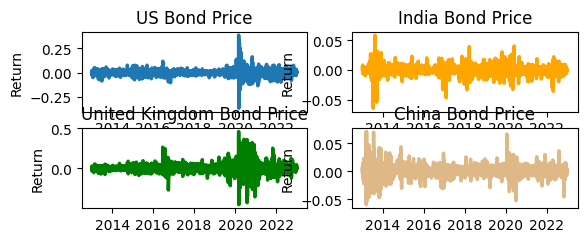

In [ ]:
ax1 = plt.subplot(4,2,1)
ax2 = plt.subplot(4,2,2)
ax3 = plt.subplot(4,2,3)
ax4 = plt.subplot(4,2,4)



ax1.plot(df_bond_return['US_Price'], linewidth = 2.5)
ax1.set_ylabel('Return')
ax1.set_title('US Bond Price')

ax2.plot(df_bond_return['IN_Price'], color = 'orange', linewidth = 2.5)
ax2.set_ylabel('Return')
ax2.set_title('India Bond Price')

ax3.plot(df_bond_return['UK_Price'], color = 'green', linewidth = 2.5)
ax3.set_ylabel('Return')
ax3.set_title('United Kingdom Bond Price')



ax4.plot(df_bond_return['CHI_Price'], color = '#DEB887', linewidth = 2.5)
ax4.set_ylabel('Return')
ax4.set_title('China Bond Price')


plt.show()

In [ ]:
df_bond_return=df_bond_return.reset_index()
df_bond_return.head()

,Date,US_Price,IN_Price,UK_Price,CHI_Price
0,2023-01-05,0.000000,0.000000,0.000000,0.000000
1,2023-01-04,-0.008598,-0.000819,-0.016610,-0.002439
2,2023-01-03,0.016802,0.000000,0.045806,0.003493
3,2022-12-30,0.033849,0.000820,0.004380,0.003829
4,2022-12-29,-0.015210,-0.002184,-0.002180,-0.000693


In [ ]:
def drawdown(return_series: pd.Series):
    """Takes a time series of asset returns.
       returns a DataFrame with columns for
       the wealth index,
       the previous peaks, and
       the percentage drawdown
    """
    wealth_index = 1000*(1+return_series).cumprod()
    previous_peaks = wealth_index.cummax()
    drawdowns = (wealth_index - previous_peaks)/previous_peaks
    return pd.DataFrame({"Wealth": wealth_index,
                         "Previous Peak": previous_peaks,
                         "Drawdown": drawdowns})

## FOR UK BOND

In [ ]:
filtered_dates1 = ann_vol_portfolio[((ann_vol_portfolio['^FTSE'] < 15) & (ann_vol_portfolio['^FTSE'].diff() <10))]['DateTime']
filtered_dates4  = ann_vol_portfolio[(((27 > ann_vol_portfolio['^FTSE']) & (ann_vol_portfolio['^FTSE'] >= 25)) | ((15 > ann_vol_portfolio['^FTSE'].diff()) & (ann_vol_portfolio['^FTSE'].diff() > 10)))]['DateTime']
filtered_dates3  = ann_vol_portfolio[(((25 > ann_vol_portfolio['^FTSE']) & (ann_vol_portfolio['^FTSE'] >= 20)) | ((30 > ann_vol_portfolio['^FTSE'].diff()) & (ann_vol_portfolio['^FTSE'].diff() > 20)))]['DateTime']
filtered_dates2  = ann_vol_portfolio[(((20 > ann_vol_portfolio['^FTSE']) & (ann_vol_portfolio['^FTSE'] >= 15)) | ((20 > ann_vol_portfolio['^FTSE'].diff()) & (ann_vol_portfolio['^FTSE'].diff() > 15)))]['DateTime']
filtered_dates5  = ann_vol_portfolio[((ann_vol_portfolio['^FTSE']  >=  27) | (ann_vol_portfolio['^FTSE'].diff() >25))]['DateTime']

In [ ]:
# Dates fullfilling the condition
def selected_returns_dataframe(filtered_dates):
  selected_returns = []
  for date in filtered_dates:
    return_value = df_bond_return.loc[df_bond_return['Date'] == date, 'UK_Price'].values
    if len(return_value) > 0:
        selected_returns.append((date, return_value[0]))

  selected_return=pd.DataFrame(selected_returns)
  selected_return.set_axis(['Date', 'Portfolio_Return_uk_bond'], axis=1, inplace=True)
  return selected_return

In [ ]:
# Define weights
wts_c1 = [0.9, 0.1]
wts_c2 = [0.8, 0.2]
wts_c3 = [0.7, 0.3]
wts_c4 = [0.6, 0.4]
wts_c5 = [0.1, 0.9]
wts_b = [1, 0]

#### CASE 1

In [ ]:
case1_uk=selected_returns_dataframe(filtered_dates1)
case1_uk.head()

,Date,Portfolio_Return_uk_bond
0,2013-02-22,0.014897
1,2013-02-25,0.042585
2,2013-03-01,-0.019916
3,2013-03-04,-0.027523
4,2013-03-06,-0.028798


<Axes: ylabel='Frequency'>

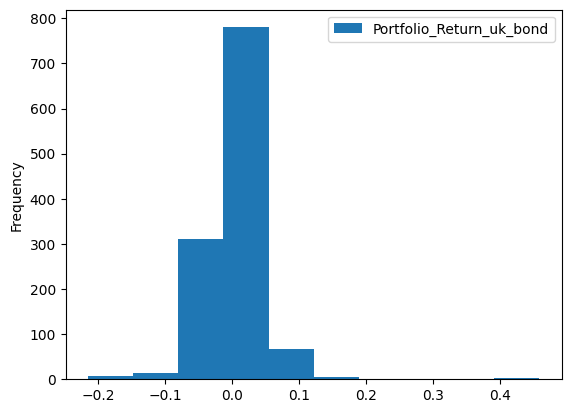

In [ ]:
# Histogram of bond
case1_uk.plot.hist()

Text(0, 0.5, 'Return')

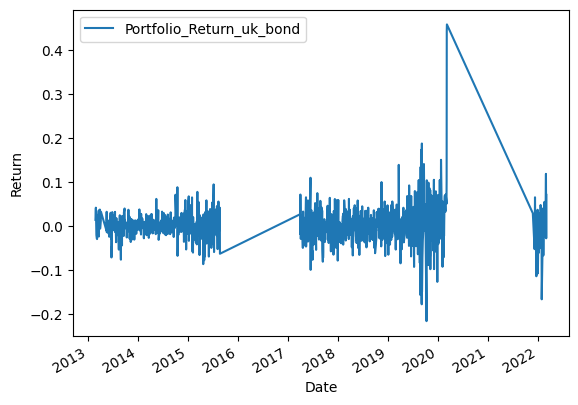

In [ ]:
selected_returns_bond_uk=case1_uk.set_index('Date')
selected_returns_bond_uk.plot()
plt.ylabel('Return')

In [ ]:
case1_ftse=case1_ftse.set_index('Date')
case1_uk=case1_uk.set_index('Date')

In [ ]:
case1_data_uk_ftse = case1_ftse.join(case1_uk, how='inner')
case1_data_uk_ftse.head()

,Portfolio_Return_ftse,Portfolio_Return_uk_bond
Date,,
2013-02-22,0.007025,0.014897
2013-02-25,0.003109,0.042585
2013-03-01,0.002798,-0.019916
2013-03-04,-0.005174,-0.027523
2013-03-06,-0.000684,-0.028798


Text(0, 0.5, 'Cumulative Return')

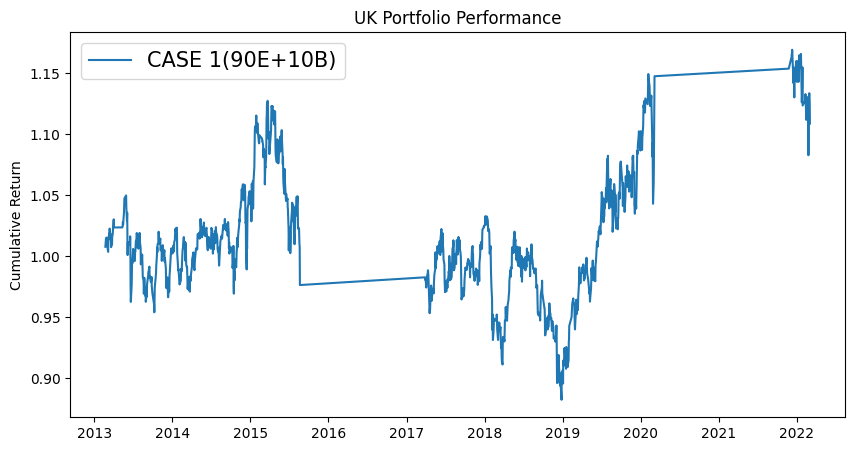

In [ ]:
# UK
weighted_return_c1_uk = (wts_c1 * case1_data_uk_ftse)


#Cumulative Portfolio UK
portfolio_return_c1_uk = weighted_return_c1_uk.sum(axis=1)
cumprod_portfolio_c1_uk = (1 + portfolio_return_c1_uk).cumprod()


#Plotting the solution portfolio's returns
plt.figure(figsize=(10, 5))
plt.plot(cumprod_portfolio_c1_uk, label='CASE 1(90E+10B)')

plt.legend(loc='upper left', fontsize=15)
plt.title("UK Portfolio Performance")
plt.ylabel('Cumulative Return')

#### CASE 2

In [ ]:
case2_uk=selected_returns_dataframe(filtered_dates2)
case2_uk.head()

,Date,Portfolio_Return_uk_bond
0,2013-01-04,0.014861
1,2013-01-07,0.027586
2,2013-01-08,0.002964
3,2013-01-09,-0.034351
4,2013-01-10,0.006241


<Axes: ylabel='Frequency'>

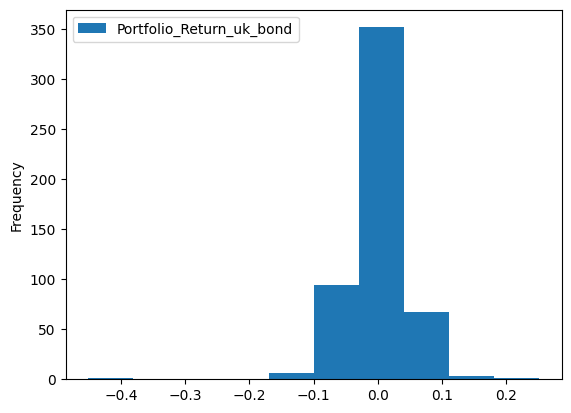

In [ ]:
# Histogram of bond
case2_uk.plot.hist()

Text(0, 0.5, 'Return')

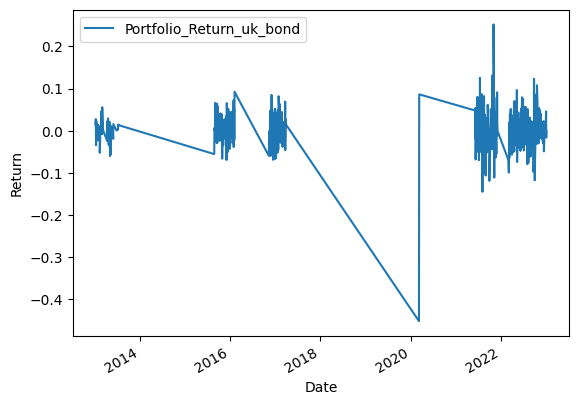

In [ ]:
selected_returns_bond_uk=case2_uk.set_index('Date')
selected_returns_bond_uk.plot()
plt.ylabel('Return')

In [ ]:
case2_ftse=case2_ftse.set_index('Date')
case2_uk=case2_uk.set_index('Date')

In [ ]:
case2_data_uk_ftse = case2_ftse.join(case2_uk, how='inner')
case2_data_uk_ftse.head()

,Portfolio_Return_ftse,Portfolio_Return_uk_bond
Date,,
2013-01-04,0.007028,0.014861
2013-01-07,-0.004138,0.027586
2013-01-08,-0.001814,0.002964
2013-01-09,0.007450,-0.034351
2013-01-10,0.000459,0.006241


Text(0, 0.5, 'Cumulative Return')

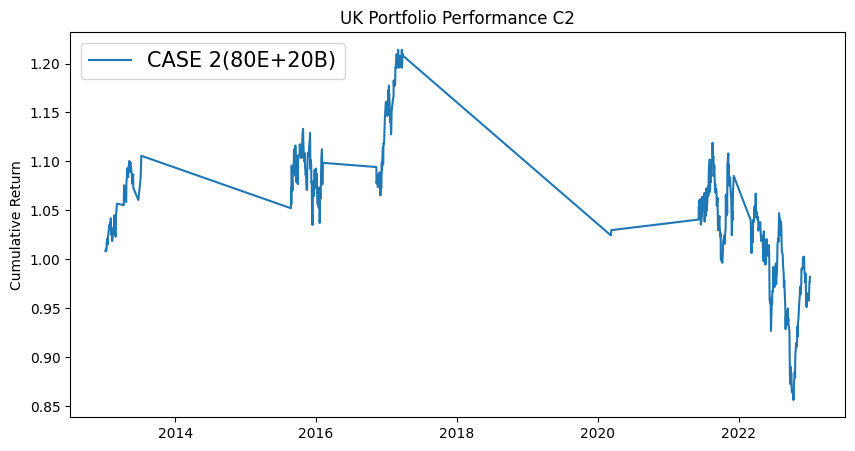

In [ ]:
# UK

weighted_return_c2_uk = (wts_c2 * case2_data_uk_ftse)


#Cumulative Portfolio UK
portfolio_return_c2_uk = weighted_return_c2_uk.sum(axis=1)
cumprod_portfolio_c2_uk = (1 + portfolio_return_c2_uk).cumprod()

#Plotting the solution portfolio's returns
plt.figure(figsize=(10, 5))
plt.plot(cumprod_portfolio_c2_uk, label='CASE 2(80E+20B)')
plt.legend(loc='upper left', fontsize=15)
plt.title("UK Portfolio Performance C2")
plt.ylabel('Cumulative Return')

#### CASE 3

In [ ]:
case3_uk=selected_returns_dataframe(filtered_dates3)
case3_uk.head()

,Date,Portfolio_Return_uk_bond
0,2016-02-16,-0.028340
1,2016-02-17,0.025606
2,2016-02-18,0.036585
3,2016-02-22,-0.027216
4,2016-02-23,0.051357


<Axes: ylabel='Frequency'>

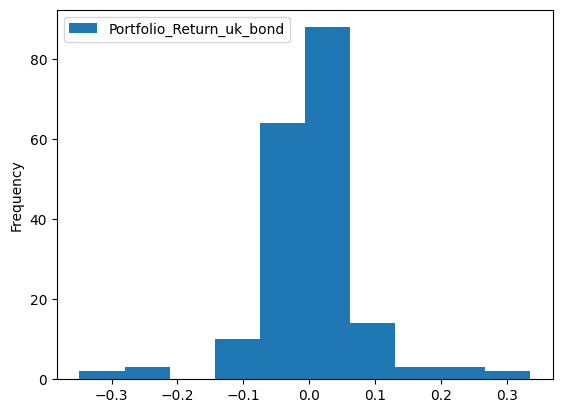

In [ ]:
# Histogram of bond
case3_uk.plot.hist()

Text(0, 0.5, 'Return')

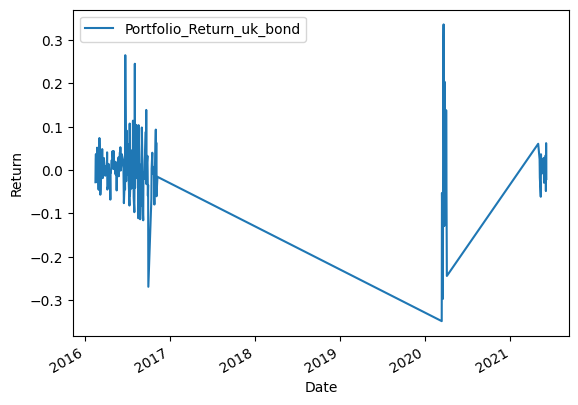

In [ ]:
selected_returns_bond_uk=case3_uk.set_index('Date')
selected_returns_bond_uk.plot()
plt.ylabel('Return')

In [ ]:
case3_ftse=case3_ftse.set_index('Date')
case3_uk=case3_uk.set_index('Date')

In [ ]:
case3_data_uk_ftse = case3_ftse.join(case3_uk, how='inner')
case3_data_uk_ftse.head()

,Portfolio_Return_ftse,Portfolio_Return_uk_bond
Date,,
2016-02-16,0.027087,-0.028340
2016-02-17,0.028675,0.025606
2016-02-18,-0.009668,0.036585
2016-02-22,0.014705,-0.027216
2016-02-23,-0.012488,0.051357


Text(0, 0.5, 'Cumulative Return')

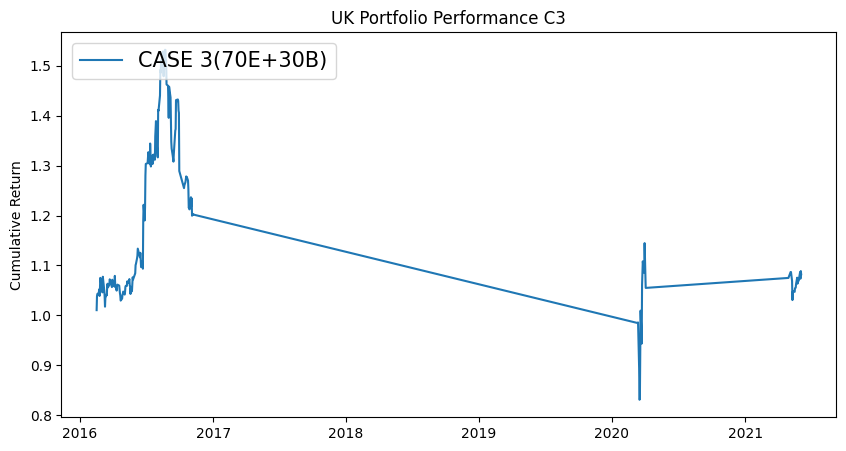

In [ ]:
# UK
weighted_return_c3_uk = (wts_c3 * case3_data_uk_ftse)

#Cumulative Portfolio UK
portfolio_return_c3_uk = weighted_return_c3_uk.sum(axis=1)
cumprod_portfolio_c3_uk = (1 + portfolio_return_c3_uk).cumprod()

#Plotting the solution portfolio's returns
plt.figure(figsize=(10, 5))
plt.plot(cumprod_portfolio_c3_uk, label='CASE 3(70E+30B)')
plt.legend(loc='upper left', fontsize=15)
plt.title("UK Portfolio Performance C3")
plt.ylabel('Cumulative Return')

#### CASE 4

In [ ]:
case4_uk=selected_returns_dataframe(filtered_dates4)
case4_uk.head()

,Date,Portfolio_Return_uk_bond
0,2020-04-07,0.083990
1,2020-04-08,0.249180
2,2020-04-09,-0.001637
3,2020-04-15,0.003333
4,2020-04-16,-0.006623


<Axes: ylabel='Frequency'>

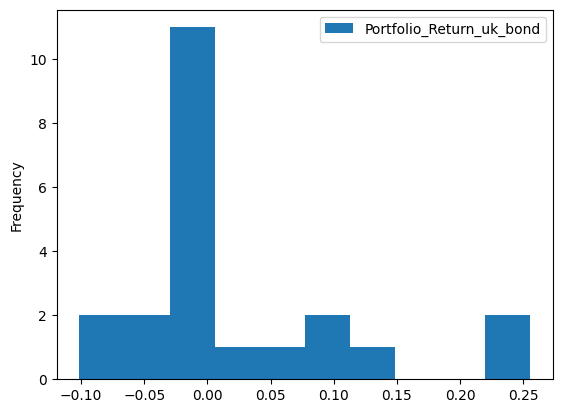

In [ ]:
# Histogram of bond
case4_uk.plot.hist()

Text(0, 0.5, 'Return')

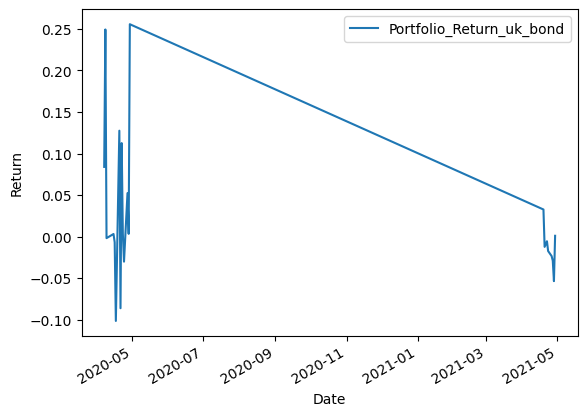

In [ ]:
selected_returns_bond_uk=case4_uk.set_index('Date')
selected_returns_bond_uk.plot()
plt.ylabel('Return')

In [ ]:
case4_ftse=case4_ftse.set_index('Date')
case4_uk=case4_uk.set_index('Date')

In [ ]:
case4_data_uk_ftse = case4_ftse.join(case4_uk, how='inner')
case4_data_uk_ftse.head()

,Portfolio_Return_ftse,Portfolio_Return_uk_bond
Date,,
2020-04-07,0.053365,0.083990
2020-04-08,-0.004698,0.249180
2020-04-09,0.029061,-0.001637
2020-04-15,-0.041933,0.003333
2020-04-16,0.005484,-0.006623


Text(0, 0.5, 'Cumulative Return')

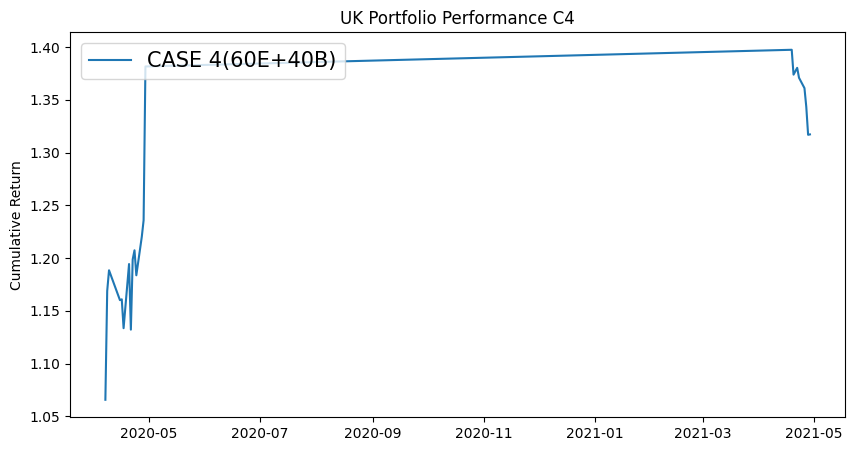

In [ ]:
# UK
weighted_return_c4_uk = (wts_c4 * case4_data_uk_ftse)

#Cumulative Portfolio UK
portfolio_return_c4_uk = weighted_return_c4_uk.sum(axis=1)
cumprod_portfolio_c4_uk = (1 + portfolio_return_c4_uk).cumprod()

#Plotting the solution portfolio's returns
plt.figure(figsize=(10, 5))
plt.plot(cumprod_portfolio_c4_uk, label='CASE 4(60E+40B)')
plt.legend(loc='upper left', fontsize=15)
plt.title("UK Portfolio Performance C4")
plt.ylabel('Cumulative Return')

#### CASE 5

In [ ]:
case5_uk=selected_returns_dataframe(filtered_dates5)
case5_uk.head()

,Date,Portfolio_Return_uk_bond
0,2020-05-04,0.126214
1,2020-05-05,-0.112069
2,2020-05-06,-0.002151
3,2020-05-11,0.084337
4,2020-05-12,0.197115


<Axes: ylabel='Frequency'>

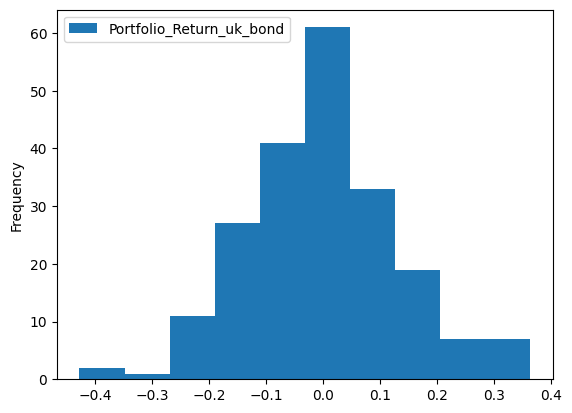

In [ ]:
# Histogram of bond
case5_uk.plot.hist()

Text(0, 0.5, 'Return')

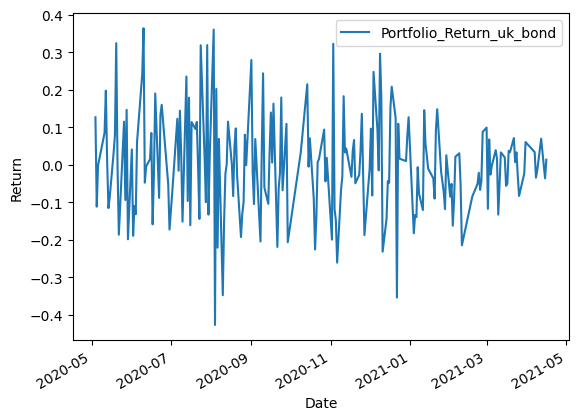

In [ ]:
selected_returns_bond_uk=case5_uk.set_index('Date')
selected_returns_bond_uk.plot()
plt.ylabel('Return')

In [ ]:
case5_ftse=case5_ftse.set_index('Date')
case5_uk=case5_uk.set_index('Date')

In [ ]:
case5_data_uk_ftse = case5_ftse.join(case5_uk, how='inner')
case5_data_uk_ftse.head()

,Portfolio_Return_ftse,Portfolio_Return_uk_bond
Date,,
2020-05-04,-0.059114,0.126214
2020-05-05,0.016615,-0.112069
2020-05-06,0.000752,-0.002151
2020-05-11,0.000623,0.084337
2020-05-12,0.009276,0.197115


Text(0, 0.5, 'Cumulative Return')

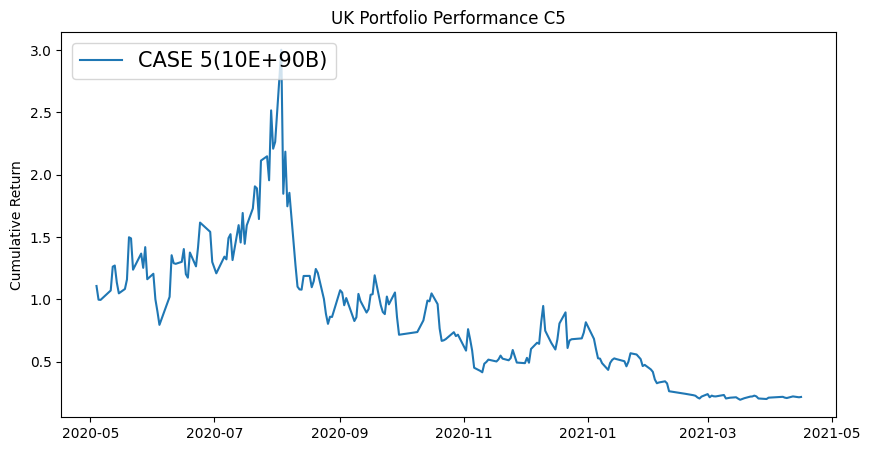

In [ ]:
# UK
weighted_return_c5_uk = (wts_c5 * case5_data_uk_ftse)

#Cumulative Portfolio UK
portfolio_return_c5_uk = weighted_return_c5_uk.sum(axis=1)
cumprod_portfolio_c5_uk = (1 + portfolio_return_c5_uk).cumprod()

#Plotting the solution portfolio's returns
plt.figure(figsize=(10, 5))
plt.plot(cumprod_portfolio_c5_uk, label='CASE 5(10E+90B)')
plt.legend(loc='upper left', fontsize=15)
plt.title("UK Portfolio Performance C5")
plt.ylabel('Cumulative Return')

**EQUITY**

In [ ]:
drawdown(case1_data_uk_ftse['Portfolio_Return_ftse'])

,Wealth,Previous Peak,Drawdown
Date,,,
2013-02-22,1007.025383,1007.025383,0.000000
2013-02-25,1010.156545,1010.156545,0.000000
2013-03-01,1012.983404,1012.983404,0.000000
2013-03-04,1007.742684,1012.983404,-0.005174
2013-03-06,1007.053323,1012.983404,-0.005854
...,...,...,...
2022-02-24,822.254104,1060.320639,-0.224523
2022-02-25,854.484822,1060.320639,-0.194126
2022-02-28,850.925160,1060.320639,-0.197483


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_210, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_211, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_212, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_213, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_214, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_215, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_216, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_217, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_218, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_219, *['Previous Peak', 'count()', None], **{})
chart

In [ ]:
drawdown(case2_data_uk_ftse['Portfolio_Return_ftse'])

,Wealth,Previous Peak,Drawdown
Date,,,
2013-01-04,1007.027930,1007.027930,0.000000
2013-01-07,1002.860829,1007.027930,-0.004138
2013-01-08,1001.041836,1007.027930,-0.005944
2013-01-09,1008.499726,1008.499726,0.000000
2013-01-10,1008.962710,1008.962710,0.000000
...,...,...,...
2022-12-29,1069.459749,1152.807859,-0.072300
2022-12-30,1060.776181,1152.807859,-0.079833
2023-01-03,1075.353173,1152.807859,-0.067188


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_220, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_221, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_222, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_223, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_224, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_225, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_226, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_227, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_228, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_229, *['Previous Peak', 'count()', None], **{})
chart

In [ ]:
drawdown(case3_data_uk_ftse['Portfolio_Return_ftse'])

,Wealth,Previous Peak,Drawdown
Date,,,
2016-02-16,1027.086708,1027.086708,0.000000
2016-02-17,1056.538598,1056.538598,0.000000
2016-02-18,1046.324181,1056.538598,-0.009668
2016-02-22,1061.710784,1061.710784,0.000000
2016-02-23,1048.451860,1061.710784,-0.012488
...,...,...,...
2021-05-28,1111.914387,1252.174457,-0.112013
2021-06-01,1121.081894,1252.174457,-0.104692
2021-06-02,1125.436071,1252.174457,-0.101215


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_230, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_231, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_232, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_233, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_234, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_235, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_236, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_237, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_238, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_239, *['Previous Peak', 'count()', None], **{})
chart

In [ ]:
drawdown(case4_data_uk_ftse['Portfolio_Return_ftse'])

,Wealth,Previous Peak,Drawdown
Date,,,
2020-04-07,1053.365340,1053.365340,0.000000
2020-04-08,1048.416618,1053.365340,-0.004698
2020-04-09,1078.884719,1078.884719,0.000000
2020-04-15,1033.644206,1078.884719,-0.041933
2020-04-16,1039.313065,1078.884719,-0.036678
2020-04-17,1068.599391,1078.884719,-0.009533
2020-04-20,1073.363458,1078.884719,-0.005118
2020-04-21,1041.639738,1078.884719,-0.034522
2020-04-22,1065.571064,1078.884719,-0.012340


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_240, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_241, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_242, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_243, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_244, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_245, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_246, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_247, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_248, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_249, *['Previous Peak', 'count()', None], **{})
chart

In [ ]:
drawdown(case5_data_uk_ftse['Portfolio_Return_ftse'])

,Wealth,Previous Peak,Drawdown
Date,,,
2020-05-04,940.885973,940.885973,0.000000
2020-05-05,956.518910,956.518910,0.000000
2020-05-06,957.238401,957.238401,0.000000
2020-05-11,957.835094,957.835094,0.000000
2020-05-12,966.720448,966.720448,0.000000
...,...,...,...
2021-04-08,1057.871973,1082.225864,-0.022504
2021-04-09,1053.849007,1082.225864,-0.026221
2021-04-12,1049.780431,1082.225864,-0.029980


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_250, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_251, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_252, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_253, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_254, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_255, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_256, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_257, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_258, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_259, *['Previous Peak', 'count()', None], **{})
chart

**BOND**

In [ ]:
drawdown(case1_data_uk_ftse['Portfolio_Return_uk_bond'])

,Wealth,Previous Peak,Drawdown
Date,,,
2013-02-22,1014.896684,1014.896684,0.000000
2013-02-25,1058.116232,1058.116232,0.000000
2013-03-01,1037.042639,1058.116232,-0.019916
2013-03-04,1008.500181,1058.116232,-0.046891
2013-03-06,979.456978,1058.116232,-0.074339
...,...,...,...
2022-02-24,5288.909757,9407.017687,-0.437770
2022-02-25,5453.370555,9407.017687,-0.420287
2022-02-28,6104.841247,9407.017687,-0.351033


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_260, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_261, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_262, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_263, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_264, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_265, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_266, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_267, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_268, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_269, *['Previous Peak', 'count()', None], **{})
chart

In [ ]:
drawdown(case2_data_uk_ftse['Portfolio_Return_uk_bond'])

,Wealth,Previous Peak,Drawdown
Date,,,
2013-01-04,1014.860978,1014.860978,0.000000
2013-01-07,1042.857143,1042.857143,0.000000
2013-01-08,1045.948617,1045.948617,0.000000
2013-01-09,1010.019084,1045.948617,-0.034351
2013-01-10,1016.322612,1045.948617,-0.028325
...,...,...,...
2022-12-29,415.062506,1443.217167,-0.712405
2022-12-30,416.880464,1443.217167,-0.711145
2023-01-03,435.976048,1443.217167,-0.697914


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_270, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_271, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_272, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_273, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_274, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_275, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_276, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_277, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_278, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_279, *['Previous Peak', 'count()', None], **{})
chart

In [ ]:
drawdown(case3_data_uk_ftse['Portfolio_Return_uk_bond'])

,Wealth,Previous Peak,Drawdown
Date,,,
2016-02-16,971.659919,971.659919,0.000000
2016-02-17,996.539792,996.539792,0.000000
2016-02-18,1032.998565,1032.998565,0.000000
2016-02-22,1004.884857,1032.998565,-0.027216
2016-02-23,1056.493030,1056.493030,0.000000
...,...,...,...
2021-05-28,653.367945,2249.142809,-0.709504
2021-06-01,675.391584,2249.142809,-0.699712
2021-06-02,642.504345,2249.142809,-0.714334


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_280, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_281, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_282, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_283, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_284, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_285, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_286, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_287, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_288, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_289, *['Previous Peak', 'count()', None], **{})
chart

In [ ]:
drawdown(case4_data_uk_ftse['Portfolio_Return_uk_bond'])

,Wealth,Previous Peak,Drawdown
Date,,,
2020-04-07,1083.989501,1083.989501,0.000000
2020-04-08,1354.098361,1354.098361,0.000000
2020-04-09,1351.882160,1354.098361,-0.001637
2020-04-15,1356.388434,1356.388434,0.000000
2020-04-16,1347.405729,1356.388434,-0.006623
2020-04-17,1211.061102,1356.388434,-0.107143
2020-04-20,1365.491712,1365.491712,0.000000
2020-04-21,1248.210216,1365.491712,-0.085890
2020-04-22,1388.793619,1388.793619,0.000000


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_290, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_291, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_292, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_293, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_294, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_295, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_296, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_297, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_298, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_299, *['Previous Peak', 'count()', None], **{})
chart

In [ ]:
drawdown(case5_data_uk_ftse['Portfolio_Return_uk_bond'])

,Wealth,Previous Peak,Drawdown
Date,,,
2020-05-04,1126.213592,1126.213592,0.000000
2020-05-05,1000.000000,1126.213592,-0.112069
2020-05-06,997.849462,1126.213592,-0.113978
2020-05-11,1082.005441,1126.213592,-0.039254
2020-05-12,1295.285360,1295.285360,0.000000
...,...,...,...
2021-04-08,144.992787,3212.307692,-0.954863
2021-04-09,142.787573,3212.307692,-0.955550
2021-04-12,152.655007,3212.307692,-0.952478


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_300, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_301, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_302, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_303, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_304, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_305, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_306, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_307, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_308, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_309, *['Previous Peak', 'count()', None], **{})
chart

In [ ]:
a1_uk=case1_data_uk_ftse['Portfolio_Return_ftse'].sum()
a2_uk=case2_data_uk_ftse['Portfolio_Return_ftse'].sum()
a3_uk=case3_data_uk_ftse['Portfolio_Return_ftse'].sum()
a4_uk=case4_data_uk_ftse['Portfolio_Return_ftse'].sum()
a5_uk=case5_data_uk_ftse['Portfolio_Return_ftse'].sum()
a_uk=(a1_uk+a2_uk+a3_uk+a4_uk+a5_uk)

b1_uk=case1_data_uk_ftse['Portfolio_Return_uk_bond'].sum()
b2_uk=case2_data_uk_ftse['Portfolio_Return_uk_bond'].sum()
b3_uk=case3_data_uk_ftse['Portfolio_Return_uk_bond'].sum()
b4_uk=case4_data_uk_ftse['Portfolio_Return_uk_bond'].sum()
b5_uk=case5_data_uk_ftse['Portfolio_Return_uk_bond'].sum()
b_uk=(b1_uk+b2_uk+b3_uk+b4_uk+b5_uk)

c1_uk=filt_case1_ftse['^FTSE'].sum()
c2_uk=filt_case2_ftse['^FTSE'].sum()
c3_uk=filt_case3_ftse['^FTSE'].sum()
c4_uk=filt_case4_ftse['^FTSE'].sum()
c5_uk=filt_case5_ftse['^FTSE'].sum()
c_uk=(c1_uk+c2_uk+c3_uk+c4_uk+c5_uk)

d_uk=return_multiData['^FTSE'].sum()
final_uk=a_uk+b_uk+c_uk-d_uk
final_uk_usd=final_uk*1000000
final_uk_usd_per_change=((final_uk_usd-1000000)/1000000)*100
final_uk_usd_per_change

495.60029262693865

## FOR UNITED STATES


In [ ]:
filtered_dates1 = ann_vol_portfolio[((ann_vol_portfolio['^GSPC'] < 15) & (ann_vol_portfolio['^GSPC'].diff() <10))]['DateTime']
filtered_dates4  = ann_vol_portfolio[(((27 > ann_vol_portfolio['^GSPC']) & (ann_vol_portfolio['^GSPC'] >= 25)) | ((15 > ann_vol_portfolio['^GSPC'].diff()) & (ann_vol_portfolio['^GSPC'].diff() > 10)))]['DateTime']
filtered_dates3  = ann_vol_portfolio[(((25 > ann_vol_portfolio['^GSPC']) & (ann_vol_portfolio['^GSPC'] >= 20)) | ((30 > ann_vol_portfolio['^GSPC'].diff()) & (ann_vol_portfolio['^GSPC'].diff() > 20)))]['DateTime']
filtered_dates2  = ann_vol_portfolio[(((20 > ann_vol_portfolio['^GSPC']) & (ann_vol_portfolio['^GSPC'] >= 15)) | ((20 > ann_vol_portfolio['^GSPC'].diff()) & (ann_vol_portfolio['^GSPC'].diff() > 15)))]['DateTime']
filtered_dates5  = ann_vol_portfolio[((ann_vol_portfolio['^GSPC']  >=  27) | (ann_vol_portfolio['^GSPC'].diff() >25))]['DateTime']

In [ ]:
# Dates fullfilling the condition
def selected_returns_dataframe(filtered_dates):
  selected_returns = []
  for date in filtered_dates:
    return_value = df_bond_return.loc[df_bond_return['Date'] == date, 'US_Price'].values
    if len(return_value) > 0:
        selected_returns.append((date, return_value[0]))

  selected_return=pd.DataFrame(selected_returns)
  selected_return.set_axis(['Date', 'Portfolio_Return_us_bond'], axis=1, inplace=True)
  return selected_return

#### CASE 1

In [ ]:
case1_us=selected_returns_dataframe(filtered_dates1)
case1_us.head()

,Date,Portfolio_Return_us_bond
0,2013-01-23,-0.012959
1,2013-01-24,-0.049769
2,2013-01-25,-0.008142
3,2013-01-29,0.003514
4,2013-01-30,0.003526


<Axes: ylabel='Frequency'>

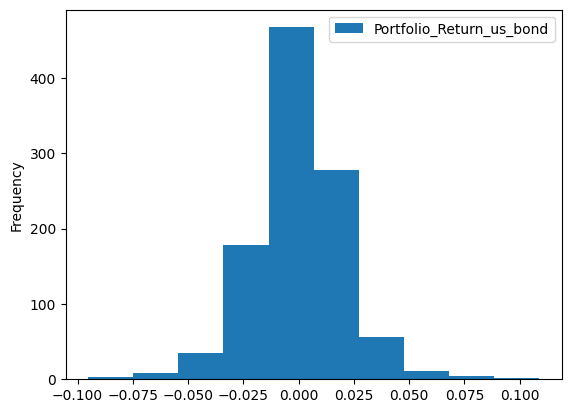

In [ ]:
# Histogram of bond
case1_us.plot.hist()

Text(0, 0.5, 'Return')

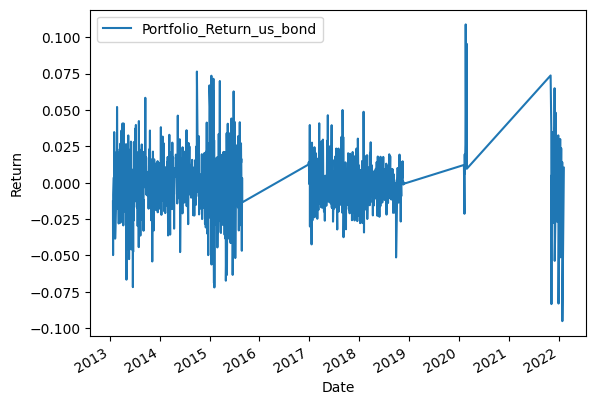

In [ ]:
selected_returns_bond_us=case1_us.set_index('Date')
selected_returns_bond_us.plot()
plt.ylabel('Return')

In [ ]:
case1_gspc=case1_gspc.set_index('Date')
case1_us=case1_us.set_index('Date')

In [ ]:
case1_data_us_gspc = case1_gspc.join(case1_us, how='inner')
case1_data_us_gspc.head()

,Portfolio_Return_gspc,Portfolio_Return_us_bond
Date,,
2013-01-23,0.001507,-0.012959
2013-01-24,0.000007,-0.049769
2013-01-25,0.005445,-0.008142
2013-01-29,0.003247,0.003514
2013-01-30,-0.003900,0.003526


Text(0, 0.5, 'Cumulative Return')

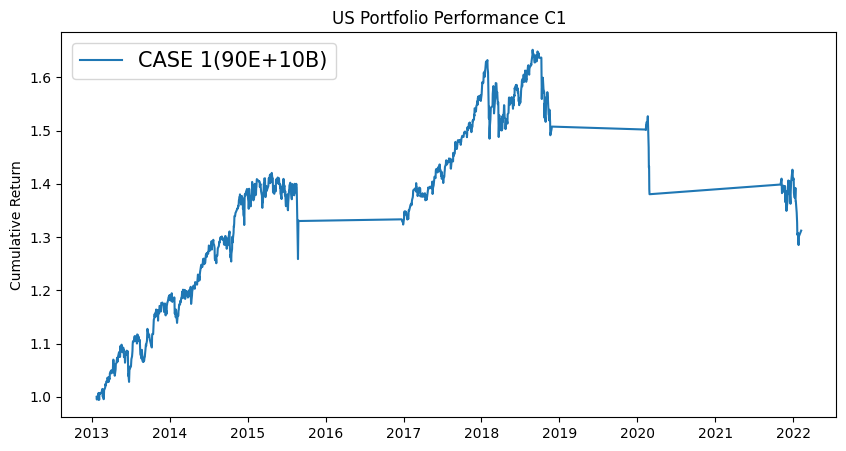

In [ ]:
# US
weighted_return_c1_us = (wts_c1 * case1_data_us_gspc)

#Cumulative Portfolio US
portfolio_return_c1_us = weighted_return_c1_us.sum(axis=1)
cumprod_portfolio_c1_us = (1 + portfolio_return_c1_us).cumprod()

#Plotting the solution portfolio's returns
plt.figure(figsize=(10, 5))
plt.plot(cumprod_portfolio_c1_us, label='CASE 1(90E+10B)')
plt.legend(loc='upper left', fontsize=15)
plt.title("US Portfolio Performance C1")
plt.ylabel('Cumulative Return')

#### CASE 2

In [ ]:
case2_us=selected_returns_dataframe(filtered_dates2)
case2_us.head()

,Date,Portfolio_Return_us_bond
0,2013-01-04,0.001052
1,2013-01-07,0.019850
2,2013-01-08,0.002151
3,2013-01-09,-0.020537
4,2013-01-10,0.017685


<Axes: ylabel='Frequency'>

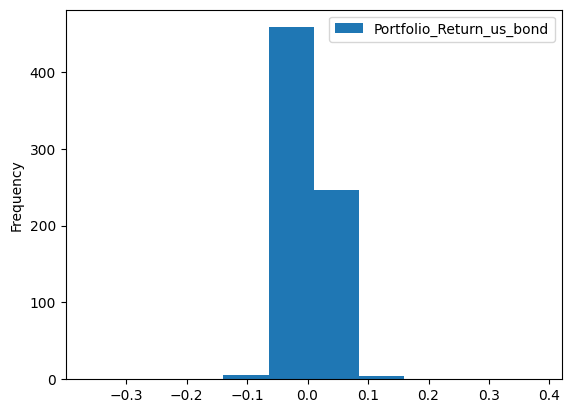

In [ ]:
# Histogram of bond
case2_us.plot.hist()

Text(0, 0.5, 'Return')

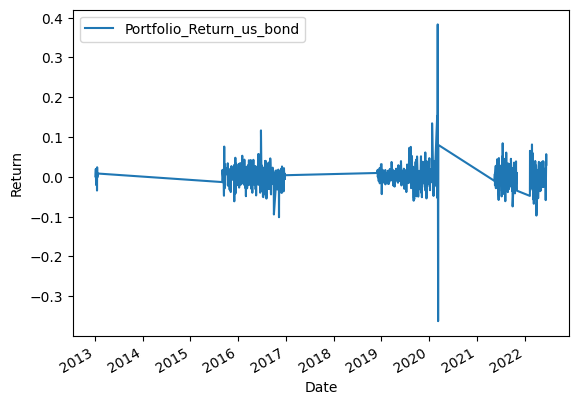

In [ ]:
selected_returns_bond_us=case2_us.set_index('Date')
selected_returns_bond_us.plot()
plt.ylabel('Return')

In [ ]:
case2_gspc=case2_gspc.set_index('Date')
case2_us=case2_us.set_index('Date')

In [ ]:
case2_data_us_gspc = case2_gspc.join(case2_us, how='inner')
case2_data_us_gspc.head()

,Portfolio_Return_gspc,Portfolio_Return_us_bond
Date,,
2013-01-04,0.004865,0.001052
2013-01-07,-0.003123,0.019850
2013-01-08,-0.003242,0.002151
2013-01-09,0.002656,-0.020537
2013-01-10,0.007597,0.017685


Text(0, 0.5, 'Cumulative Return')

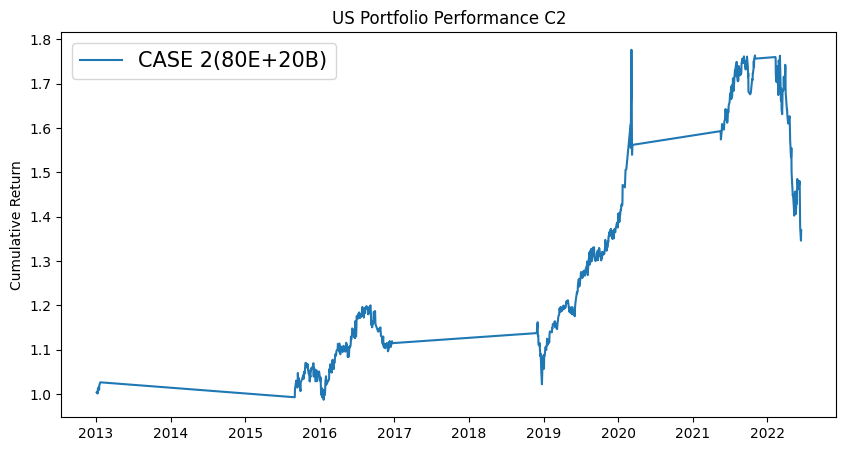

In [ ]:
# US
weighted_return_c2_us = (wts_c2 * case2_data_us_gspc)

#Cumulative Portfolio US

portfolio_return_c2_us = weighted_return_c2_us.sum(axis=1)
cumprod_portfolio_c2_us = (1 + portfolio_return_c2_us).cumprod()

#Plotting the solution portfolio's returns
plt.figure(figsize=(10, 5))
plt.plot(cumprod_portfolio_c2_us, label='CASE 2(80E+20B)')
plt.legend(loc='upper left', fontsize=15)
plt.title("US Portfolio Performance C2")
plt.ylabel('Cumulative Return')

#### CASE 3

In [ ]:
case3_us=selected_returns_dataframe(filtered_dates3)
case3_us.head()

,Date,Portfolio_Return_us_bond
0,2020-03-12,-0.173957
1,2020-03-13,0.328378
2,2021-04-28,-0.018282
3,2021-04-29,0.009225
4,2021-04-30,0.035669


<Axes: ylabel='Frequency'>

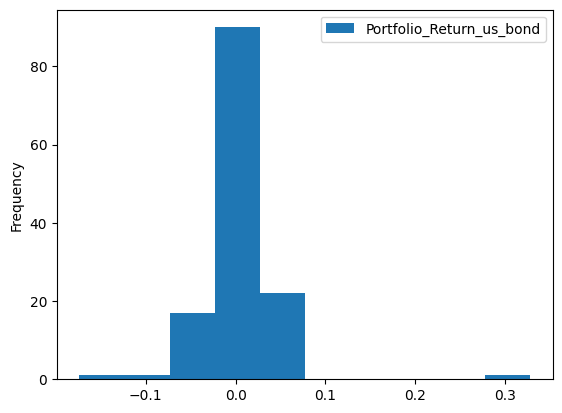

In [ ]:
# Histogram of bond
case3_us.plot.hist()

Text(0, 0.5, 'Return')

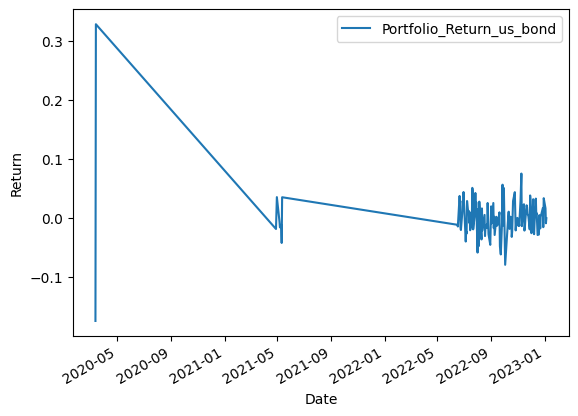

In [ ]:
selected_returns_bond_us=case3_us.set_index('Date')
selected_returns_bond_us.plot()
plt.ylabel('Return')

In [ ]:
case3_gspc=case3_gspc.set_index('Date')
case3_us=case3_us.set_index('Date')

In [ ]:
case3_data_us_gspc = case3_gspc.join(case3_us, how='inner')
case3_data_us_gspc.head()

,Portfolio_Return_gspc,Portfolio_Return_us_bond
Date,,
2020-03-12,-0.095113,-0.173957
2020-03-13,0.092871,0.328378
2021-04-28,-0.000846,-0.018282
2021-04-29,0.006763,0.009225
2021-04-30,-0.007195,0.035669


Text(0, 0.5, 'Cumulative Return')

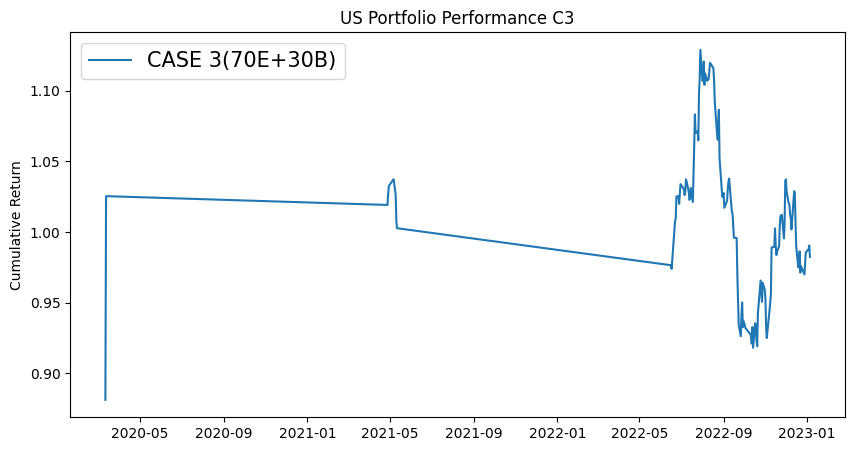

In [ ]:
# US
weighted_return_c3_us = (wts_c3 * case3_data_us_gspc)


#Cumulative Portfolio US
portfolio_return_c3_us = weighted_return_c3_us.sum(axis=1)
cumprod_portfolio_c3_us = (1 + portfolio_return_c3_us).cumprod()

#Plotting the solution portfolio's returns
plt.figure(figsize=(10, 5))
plt.plot(cumprod_portfolio_c3_us, label='CASE 3(70E+30B)')
plt.legend(loc='upper left', fontsize=15)
plt.title("US Portfolio Performance C3")
plt.ylabel('Cumulative Return')

#### CASE 4

In [ ]:
case4_us=selected_returns_dataframe(filtered_dates4)
case4_us.head()

,Date,Portfolio_Return_us_bond
0,2020-03-16,-0.307764
1,2020-03-17,-0.096365
2,2020-03-18,0.021589
3,2020-03-19,0.308475
4,2021-04-22,-0.010904


<Axes: ylabel='Frequency'>

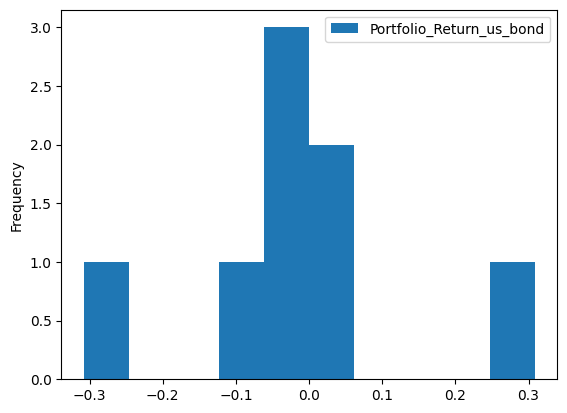

In [ ]:
# Histogram of bond
case4_us.plot.hist()

Text(0, 0.5, 'Return')

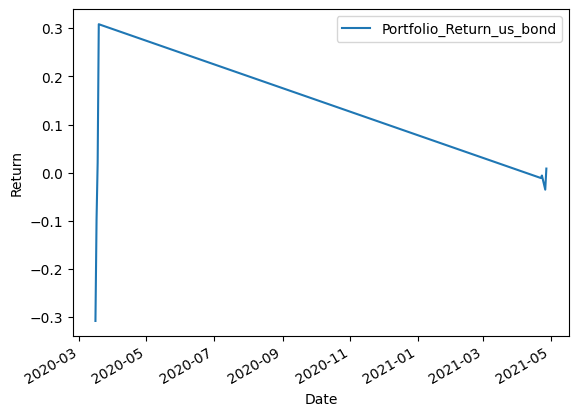

In [ ]:
selected_returns_bond_us=case4_us.set_index('Date')
selected_returns_bond_us.plot()
plt.ylabel('Return')

In [ ]:
case4_gspc=case4_gspc.set_index('Date')
case4_us=case4_us.set_index('Date')

In [ ]:
case4_data_us_gspc = case4_gspc.join(case4_us, how='inner')
case4_data_us_gspc.head()

,Portfolio_Return_gspc,Portfolio_Return_us_bond
Date,,
2020-03-16,-0.119841,-0.307764
2020-03-17,0.059955,-0.096365
2020-03-18,-0.051831,0.021589
2020-03-19,0.004708,0.308475
2021-04-22,0.000010,-0.010904


Text(0, 0.5, 'Cumulative Return')

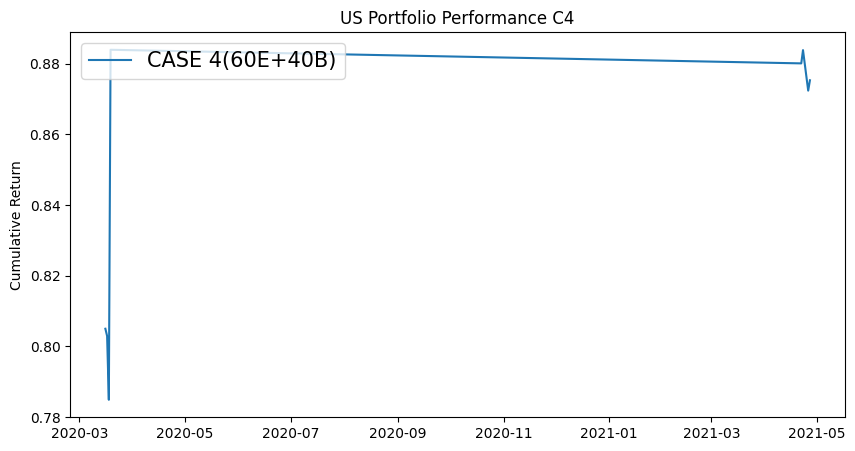

In [ ]:
# US
weighted_return_c4_us = (wts_c4 * case4_data_us_gspc)

#Cumulative Portfolio US

portfolio_return_c4_us = weighted_return_c4_us.sum(axis=1)
cumprod_portfolio_c4_us = (1 + portfolio_return_c4_us).cumprod()

#Plotting the solution portfolio's returns
plt.figure(figsize=(10, 5))
plt.plot(cumprod_portfolio_c4_us, label='CASE 4(60E+40B)')
plt.legend(loc='upper left', fontsize=15)
plt.title("US Portfolio Performance C4")
plt.ylabel('Cumulative Return')

#### CASE 5

In [ ]:
case5_us=selected_returns_dataframe(filtered_dates5)
case5_us.head()

,Date,Portfolio_Return_us_bond
0,2020-03-20,0.159895
1,2020-03-23,-0.110723
2,2020-03-24,0.011792
3,2020-03-26,0.254438
4,2020-03-27,-0.068871


<Axes: ylabel='Frequency'>

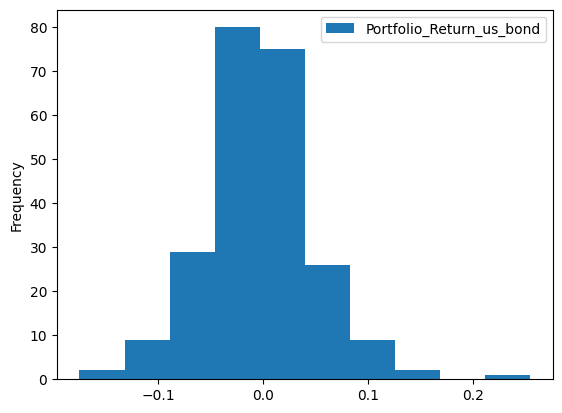

In [ ]:
# Histogram of bond
case5_us.plot.hist()

Text(0, 0.5, 'Return')

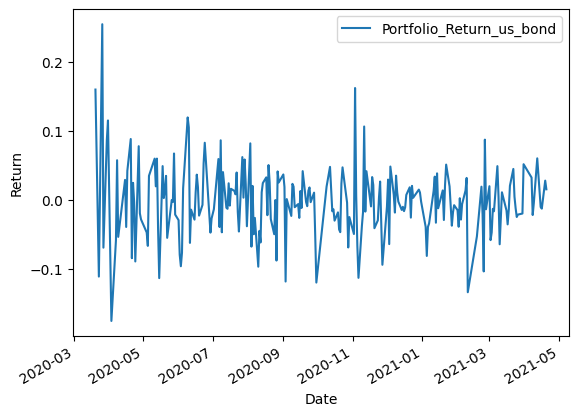

In [ ]:
selected_returns_bond_us=case5_us.set_index('Date')
selected_returns_bond_us.plot()
plt.ylabel('Return')

In [ ]:
case5_gspc=case5_gspc.set_index('Date')
case5_us=case5_us.set_index('Date')

In [ ]:
case5_data_us_gspc = case5_gspc.join(case5_us, how='inner')
case5_data_us_gspc.head()

,Portfolio_Return_gspc,Portfolio_Return_us_bond
Date,,
2020-03-20,-0.043360,0.159895
2020-03-23,-0.029294,-0.110723
2020-03-24,0.093828,0.011792
2020-03-26,0.062414,0.254438
2020-03-27,-0.033687,-0.068871


Text(0, 0.5, 'Cumulative Return')

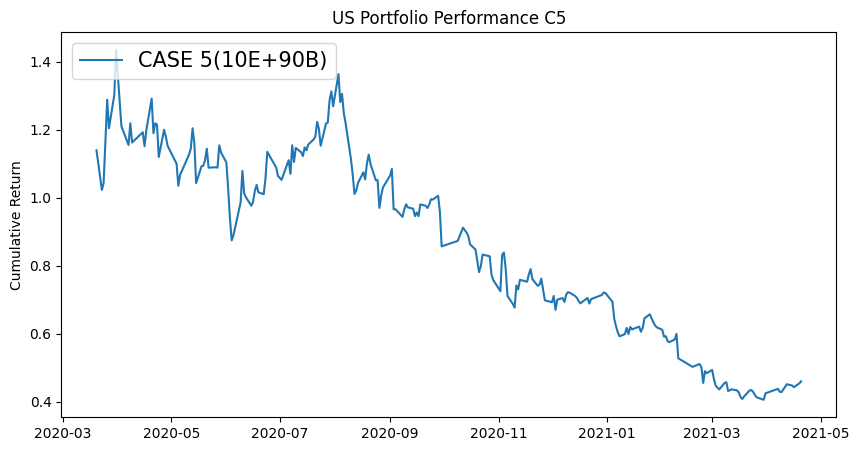

In [ ]:
# US
weighted_return_c5_us = (wts_c5 * case5_data_us_gspc)

#Cumulative Portfolio US
portfolio_return_c5_us = weighted_return_c5_us.sum(axis=1)
cumprod_portfolio_c5_us = (1 + portfolio_return_c5_us).cumprod()

#Plotting the solution portfolio's returns
plt.figure(figsize=(10, 5))
plt.plot(cumprod_portfolio_c5_us, label='CASE 5(10E+90B)')
plt.legend(loc='upper left', fontsize=15)
plt.title("US Portfolio Performance C5")
plt.ylabel('Cumulative Return')

**EQUITY**

In [ ]:
drawdown(case1_data_us_gspc['Portfolio_Return_gspc'])

,Wealth,Previous Peak,Drawdown
Date,,,
2013-01-23,1001.507477,1001.507477,0.000000
2013-01-24,1001.514101,1001.514101,0.000000
2013-01-25,1006.967828,1006.967828,0.000000
2013-01-29,1010.237382,1010.237382,0.000000
2013-01-30,1006.297838,1010.237382,-0.003900
...,...,...,...
2022-01-24,1320.332028,1761.700133,-0.250535
2022-01-25,1304.261070,1761.700133,-0.259658
2022-01-27,1295.297319,1761.700133,-0.264746


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_310, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_311, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_312, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_313, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_314, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_315, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_316, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_317, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_318, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_319, *['Previous Peak', 'count()', None], **{})
chart

In [ ]:
drawdown(case2_data_us_gspc['Portfolio_Return_gspc'])

,Wealth,Previous Peak,Drawdown
Date,,,
2013-01-04,1004.865097,1004.865097,0.000000
2013-01-07,1001.726786,1004.865097,-0.003123
2013-01-08,998.478816,1004.865097,-0.006355
2013-01-09,1001.130642,1004.865097,-0.003716
2013-01-10,1008.736647,1008.736647,0.000000
...,...,...,...
2022-06-08,1328.581544,1567.695656,-0.152526
2022-06-09,1296.963039,1567.695656,-0.172695
2022-06-10,1259.208051,1567.695656,-0.196778


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_320, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_321, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_322, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_323, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_324, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_325, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_326, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_327, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_328, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_329, *['Previous Peak', 'count()', None], **{})
chart

In [ ]:
drawdown(case3_data_us_gspc['Portfolio_Return_gspc'])

,Wealth,Previous Peak,Drawdown
Date,,,
2020-03-12,904.887319,904.887319,0.000000
2020-03-13,988.925335,988.925335,0.000000
2021-04-28,988.089159,988.925335,-0.000846
2021-04-29,994.771415,994.771415,0.000000
2021-04-30,987.614327,994.771415,-0.007195
...,...,...,...
2022-12-29,962.138581,1087.362694,-0.115163
2022-12-30,959.694035,1087.362694,-0.117411
2023-01-03,955.854732,1087.362694,-0.120942


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_330, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_331, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_332, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_333, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_334, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_335, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_336, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_337, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_338, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_339, *['Previous Peak', 'count()', None], **{})
chart

In [ ]:
drawdown(case4_data_us_gspc['Portfolio_Return_gspc'])

,Wealth,Previous Peak,Drawdown
Date,,,
2020-03-16,880.159448,880.159448,0.000000
2020-03-17,932.929275,932.929275,0.000000
2020-03-18,884.574839,932.929275,-0.051831
2020-03-19,888.739248,932.929275,-0.047367
2021-04-22,888.747853,932.929275,-0.047358
2021-04-23,898.460709,932.929275,-0.036947
2021-04-26,900.062009,932.929275,-0.035230
2021-04-27,899.868590,932.929275,-0.035438


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_340, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_341, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_342, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_343, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_344, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_345, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_346, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_347, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_348, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_349, *['Previous Peak', 'count()', None], **{})
chart

In [ ]:
drawdown(case5_data_us_gspc['Portfolio_Return_gspc'])

,Wealth,Previous Peak,Drawdown
Date,,,
2020-03-20,956.640488,956.640488,0.000000
2020-03-23,928.616787,956.640488,-0.029294
2020-03-24,1015.746802,1015.746802,0.000000
2020-03-26,1079.143788,1079.143788,0.000000
2020-03-27,1042.790291,1079.143788,-0.033687
...,...,...,...
2021-04-12,1727.184598,1727.523329,-0.000196
2021-04-15,1739.207726,1739.207726,0.000000
2021-04-16,1745.484213,1745.484213,0.000000


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_350, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_351, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_352, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_353, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_354, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_355, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_356, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_357, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_358, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_359, *['Previous Peak', 'count()', None], **{})
chart

**BOND**

In [ ]:
drawdown(case1_data_us_gspc['Portfolio_Return_us_bond'])

,Wealth,Previous Peak,Drawdown
Date,,,
2013-01-23,987.041037,987.041037,0.000000
2013-01-24,937.916880,987.041037,-0.049769
2013-01-25,930.279898,987.041037,-0.057506
2013-01-29,933.548954,987.041037,-0.054194
2013-01-30,936.841066,987.041037,-0.050859
...,...,...,...
2022-01-24,959.248077,1333.931642,-0.280887
2022-01-25,944.883297,1333.931642,-0.291655
2022-01-27,958.169058,1333.931642,-0.281696


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_360, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_361, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_362, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_363, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_364, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_365, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_366, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_367, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_368, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_369, *['Previous Peak', 'count()', None], **{})
chart

In [ ]:
drawdown(case2_data_us_gspc['Portfolio_Return_us_bond'])

,Wealth,Previous Peak,Drawdown
Date,,,
2013-01-04,1001.052078,1001.052078,0.000000
2013-01-07,1020.922747,1020.922747,0.000000
2013-01-08,1023.118280,1023.118280,0.000000
2013-01-09,1002.106372,1023.118280,-0.020537
2013-01-10,1019.828510,1023.118280,-0.003215
...,...,...,...
2022-06-08,1534.363114,2971.796373,-0.483692
2022-06-09,1476.673000,2971.796373,-0.503104
2022-06-10,1390.145760,2971.796373,-0.532220


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_370, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_371, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_372, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_373, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_374, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_375, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_376, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_377, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_378, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_379, *['Previous Peak', 'count()', None], **{})
chart

In [ ]:
drawdown(case3_data_us_gspc['Portfolio_Return_us_bond'])

,Wealth,Previous Peak,Drawdown
Date,,,
2020-03-12,826.042726,826.042726,0.000000
2020-03-13,1097.297297,1097.297297,0.000000
2021-04-28,1077.237018,1097.297297,-0.018282
2021-04-29,1087.174629,1097.297297,-0.009225
2021-04-30,1125.952832,1125.952832,0.000000
...,...,...,...
2022-12-29,959.614632,1302.768070,-0.263403
2022-12-30,992.096257,1302.768070,-0.238471
2023-01-03,1008.765625,1302.768070,-0.225675


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_380, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_381, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_382, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_383, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_384, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_385, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_386, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_387, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_388, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_389, *['Previous Peak', 'count()', None], **{})
chart

In [ ]:
drawdown(case4_data_us_gspc['Portfolio_Return_us_bond'])

,Wealth,Previous Peak,Drawdown
Date,,,
2020-03-16,692.235734,692.235734,0.000000
2020-03-17,625.528318,692.235734,-0.096365
2020-03-18,639.032815,692.235734,-0.076857
2020-03-19,836.158192,836.158192,0.000000
2021-04-22,827.040367,836.158192,-0.010904
2021-04-23,822.293324,836.158192,-0.016582
2021-04-26,793.449804,836.158192,-0.051077
2021-04-27,800.345085,836.158192,-0.042831


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_390, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_391, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_392, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_393, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_394, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_395, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_396, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_397, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_398, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_399, *['Previous Peak', 'count()', None], **{})
chart

In [ ]:
drawdown(case5_data_us_gspc['Portfolio_Return_us_bond'])

,Wealth,Previous Peak,Drawdown
Date,,,
2020-03-20,1159.895151,1159.895151,0.000000
2020-03-23,1031.468531,1159.895151,-0.110723
2020-03-24,1043.632075,1159.895151,-0.100236
2020-03-26,1309.171598,1309.171598,0.000000
2020-03-27,1219.008264,1309.171598,-0.068871
...,...,...,...
2021-04-12,376.151426,1477.462437,-0.745407
2021-04-15,372.366255,1477.462437,-0.747969
2021-04-16,367.740587,1477.462437,-0.751100


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_400, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_401, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_402, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_403, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_404, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_405, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_406, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_407, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_408, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_409, *['Previous Peak', 'count()', None], **{})
chart

In [ ]:
a1_us=case1_data_us_gspc['Portfolio_Return_gspc'].sum()
a2_us=case2_data_us_gspc['Portfolio_Return_gspc'].sum()
a3_us=case3_data_us_gspc['Portfolio_Return_gspc'].sum()
a4_us=case4_data_us_gspc['Portfolio_Return_gspc'].sum()
a5_us=case5_data_us_gspc['Portfolio_Return_gspc'].sum()
a_us=(a1_us+a2_us+a3_us+a4_us+a5_us)

b1_us=case1_data_us_gspc['Portfolio_Return_us_bond'].sum()
b2_us=case2_data_us_gspc['Portfolio_Return_us_bond'].sum()
b3_us=case3_data_us_gspc['Portfolio_Return_us_bond'].sum()
b4_us=case4_data_us_gspc['Portfolio_Return_us_bond'].sum()
b5_us=case5_data_us_gspc['Portfolio_Return_us_bond'].sum()
b_us=(b1_us+b2_us+b3_us+b4_us+b5_us)

c1_us=filt_case1_gspc['^GSPC'].sum()
c2_us=filt_case2_gspc['^GSPC'].sum()
c3_us=filt_case3_gspc['^GSPC'].sum()
c4_us=filt_case4_gspc['^GSPC'].sum()
c5_us=filt_case5_gspc['^GSPC'].sum()
c_us=(c1_us+c2_us+c3_us+c4_us+c5_us)

d_us=return_multiData['^GSPC'].sum()
final_us=a_us+b_us+c_us-d_us
final_us_usd=final_us*1000000
final_us_usd_per_change=((final_us_usd-1000000)/1000000)*100
final_us_usd_per_change

570.4119952300248

## FOR INDIA


In [ ]:
filtered_dates1 = ann_vol_portfolio[((ann_vol_portfolio['^NSEI'] < 15) & (ann_vol_portfolio['^NSEI'].diff() <10))]['DateTime']
filtered_dates4  = ann_vol_portfolio[(((27 > ann_vol_portfolio['^NSEI']) & (ann_vol_portfolio['^NSEI'] >= 25)) | ((15 > ann_vol_portfolio['^NSEI'].diff()) & (ann_vol_portfolio['^NSEI'].diff() > 10)))]['DateTime']
filtered_dates3  = ann_vol_portfolio[(((25 > ann_vol_portfolio['^NSEI']) & (ann_vol_portfolio['^NSEI'] >= 20)) | ((30 > ann_vol_portfolio['^NSEI'].diff()) & (ann_vol_portfolio['^NSEI'].diff() > 20)))]['DateTime']
filtered_dates2  = ann_vol_portfolio[(((20 > ann_vol_portfolio['^NSEI']) & (ann_vol_portfolio['^NSEI'] >= 15)) | ((20 > ann_vol_portfolio['^NSEI'].diff()) & (ann_vol_portfolio['^NSEI'].diff() > 15)))]['DateTime']
filtered_dates5  = ann_vol_portfolio[((ann_vol_portfolio['^NSEI']  >=  27) | (ann_vol_portfolio['^NSEI'].diff() >25))]['DateTime']

In [ ]:
# Dates fullfilling the condition
def selected_returns_dataframe(filtered_dates):
  selected_returns = []
  for date in filtered_dates:
    return_value = df_bond_return.loc[df_bond_return['Date'] == date, 'IN_Price'].values
    if len(return_value) > 0:
        selected_returns.append((date, return_value[0]))

  selected_return=pd.DataFrame(selected_returns)
  selected_return.set_axis(['Date', 'Portfolio_Return_IN_bond'], axis=1, inplace=True)
  return selected_return

#### CASE 1

In [ ]:
case1_in=selected_returns_dataframe(filtered_dates1)
case1_in.head()

,Date,Portfolio_Return_IN_bond
0,2014-11-11,0.003310
1,2014-11-12,-0.007663
2,2014-11-13,0.000730
3,2014-11-14,0.004156
4,2014-11-17,0.003434


<Axes: ylabel='Frequency'>

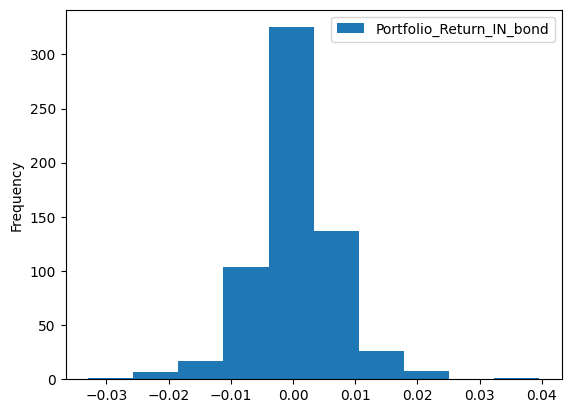

In [ ]:
# Histogram of bond
case1_in.plot.hist()

Text(0, 0.5, 'Return')

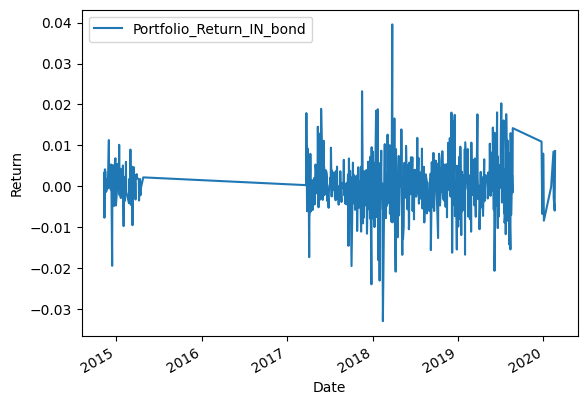

In [ ]:
selected_returns_bond_in=case1_in.set_index('Date')
selected_returns_bond_in.plot()
plt.ylabel('Return')

In [ ]:
case1_nsei=case1_nsei.set_index('Date')
case1_in=case1_in.set_index('Date')

In [ ]:
case1_data_in_nsei = case1_nsei.join(case1_in, how='inner')
case1_data_in_nsei.head()

,Portfolio_Return_nsei,Portfolio_Return_IN_bond
Date,,
2014-11-11,0.002205,0.003310
2014-11-12,0.002469,-0.007663
2014-11-13,-0.003036,0.000730
2014-11-14,0.003835,0.004156
2014-11-17,0.004869,0.003434


Text(0, 0.5, 'Cumulative Return')

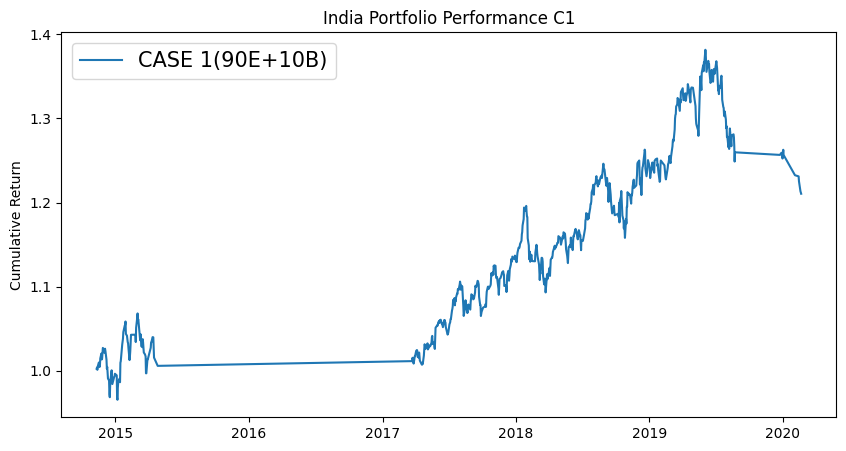

In [ ]:
# India
weighted_return_c1_in = (wts_c1 * case1_data_in_nsei)

#Cumulative Portfolio in
portfolio_return_c1_in = weighted_return_c1_in.sum(axis=1)
cumprod_portfolio_c1_in = (1 + portfolio_return_c1_in).cumprod()

#Plotting the solution portfolio's returns
plt.figure(figsize=(10, 5))
plt.plot(cumprod_portfolio_c1_in, label='CASE 1(90E+10B)')
plt.legend(loc='upper left', fontsize=15)
plt.title("India Portfolio Performance C1")
plt.ylabel('Cumulative Return')

#### CASE 2

In [ ]:
case2_in=selected_returns_dataframe(filtered_dates2)
case2_in.head()

,Date,Portfolio_Return_IN_bond
0,2013-01-04,0.003797
1,2013-01-07,-0.000759
2,2013-01-08,0.001140
3,2013-01-09,0.002539
4,2013-01-10,0.001398


<Axes: ylabel='Frequency'>

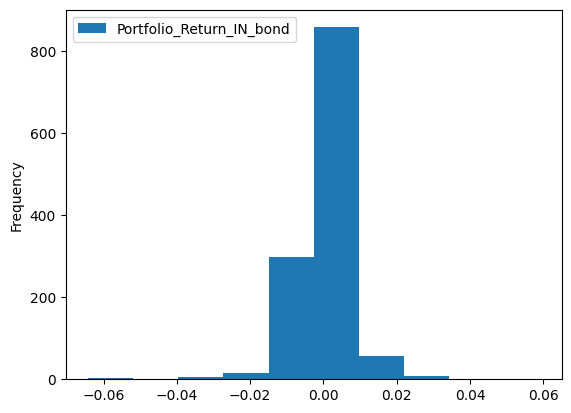

In [ ]:
# Histogram of bond
case2_in.plot.hist()

Text(0, 0.5, 'Return')

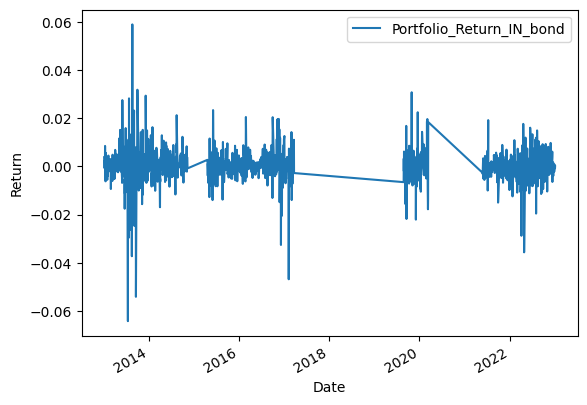

In [ ]:
selected_returns_bond_in=case2_in.set_index('Date')
selected_returns_bond_in.plot()
plt.ylabel('Return')

In [ ]:
case2_nsei=case2_nsei.set_index('Date')
case2_in=case2_in.set_index('Date')

In [ ]:
case2_data_in_nsei = case2_nsei.join(case2_in, how='inner')
case2_data_in_nsei.head()

,Portfolio_Return_nsei,Portfolio_Return_IN_bond
Date,,
2013-01-04,0.001107,0.003797
2013-01-07,-0.004613,-0.000759
2013-01-08,0.002221,0.001140
2013-01-09,-0.005032,0.002539
2013-01-10,-0.000477,0.001398


Text(0, 0.5, 'Cumulative Return')

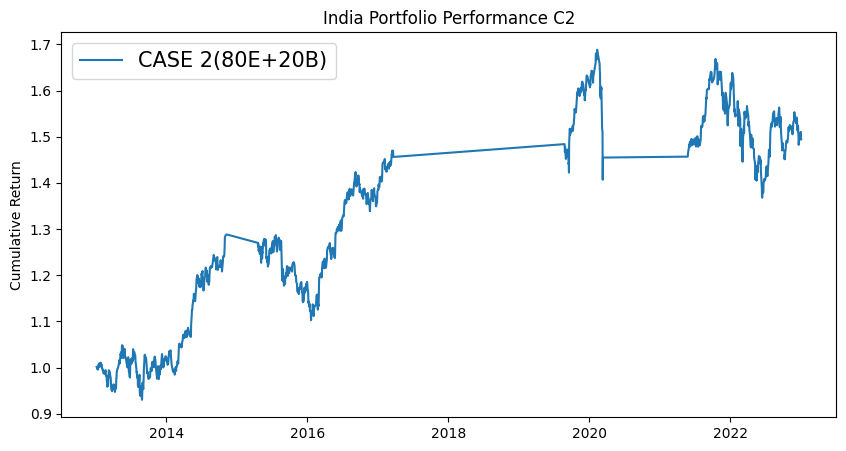

In [ ]:
# India
weighted_return_c2_in = (wts_c2 * case2_data_in_nsei)

#Cumulative Portfolio india
portfolio_return_c2_in = weighted_return_c2_in.sum(axis=1)
cumprod_portfolio_c2_in = (1 + portfolio_return_c2_in).cumprod()

#Plotting the solution portfolio's returns
plt.figure(figsize=(10, 5))
plt.plot(cumprod_portfolio_c2_in, label='CASE 2(80E+20B)')
plt.legend(loc='upper left', fontsize=15)
plt.title("India Portfolio Performance C2")
plt.ylabel('Cumulative Return')

#### CASE 3

In [ ]:
case3_in=selected_returns_dataframe(filtered_dates3)
case3_in.head()

,Date,Portfolio_Return_IN_bond
0,2020-03-16,-0.009098
1,2020-03-17,-0.004924
2,2020-03-18,-0.017785
3,2020-03-19,0.024125
4,2020-03-20,-0.018812


<Axes: ylabel='Frequency'>

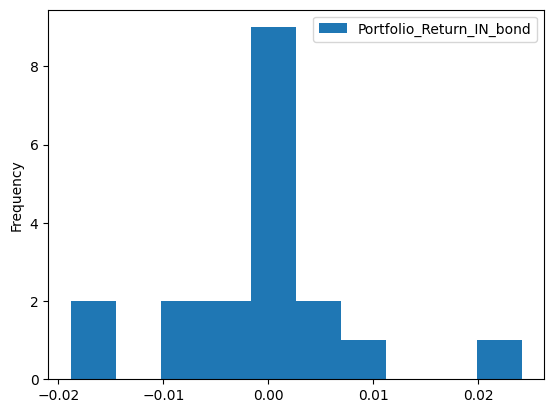

In [ ]:
# Histogram of bond
case3_in.plot.hist()

Text(0, 0.5, 'Return')

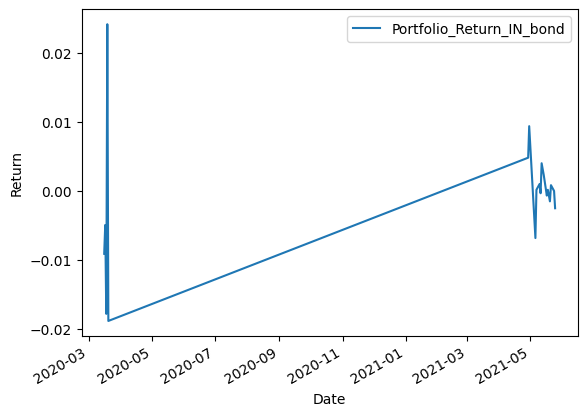

In [ ]:
selected_returns_bond_in=case3_in.set_index('Date')
selected_returns_bond_in.plot()
plt.ylabel('Return')

In [ ]:
case3_nsei=case3_nsei.set_index('Date')
case3_in=case3_in.set_index('Date')

In [ ]:
case3_data_in_nsei = case3_nsei.join(case3_in, how='inner')
case3_data_in_nsei.head()

,Portfolio_Return_nsei,Portfolio_Return_IN_bond
Date,,
2020-03-16,-0.076121,-0.009098
2020-03-17,-0.025045,-0.004924
2020-03-18,-0.055565,-0.017785
2020-03-19,-0.024248,0.024125
2020-03-20,0.058329,-0.018812


Text(0, 0.5, 'Cumulative Return')

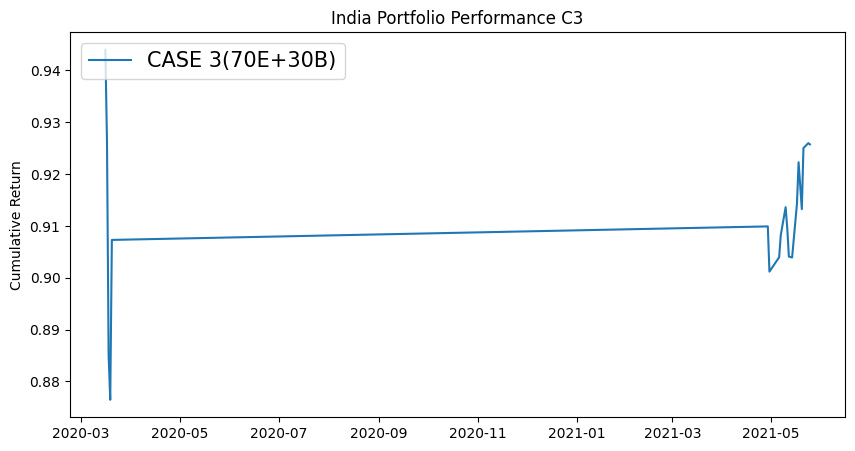

In [ ]:
# India
weighted_return_c3_in = (wts_c3 * case3_data_in_nsei)

#Cumulative Portfolio india

portfolio_return_c3_in = weighted_return_c3_in.sum(axis=1)
cumprod_portfolio_c3_in = (1 + portfolio_return_c3_in).cumprod()

#Plotting the solution portfolio's returns
plt.figure(figsize=(10, 5))
plt.plot(cumprod_portfolio_c3_in, label='CASE 3(70E+30B)')
plt.legend(loc='upper left', fontsize=15)
plt.title("India Portfolio Performance C3")
plt.ylabel('Cumulative Return')

#### CASE 4

In [ ]:
case4_in=selected_returns_dataframe(filtered_dates4)
case4_in.head()

,Date,Portfolio_Return_IN_bond
0,2020-03-23,0.011897
1,2020-03-24,0.012691


<Axes: ylabel='Frequency'>

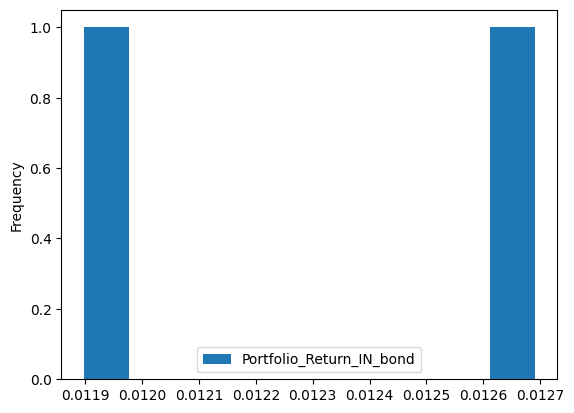

In [ ]:
# Histogram of bond
case4_in.plot.hist()

Text(0, 0.5, 'Return')

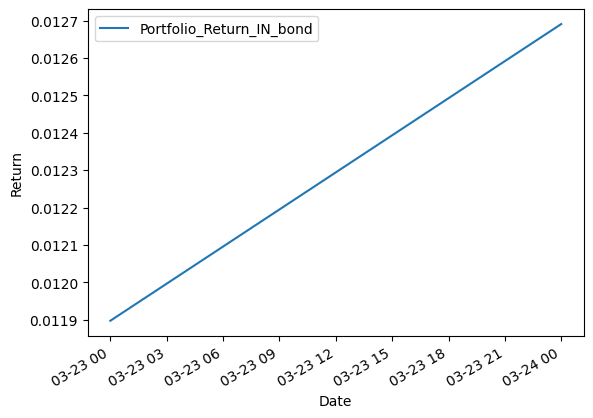

In [ ]:
selected_returns_bond_in=case4_in.set_index('Date')
selected_returns_bond_in.plot()
plt.ylabel('Return')

In [ ]:
case4_nsei=case4_nsei.set_index('Date')
case4_in=case4_in.set_index('Date')

In [ ]:
case4_data_in_nsei = case4_nsei.join(case4_in, how='inner')
case4_data_in_nsei.head()

,Portfolio_Return_nsei,Portfolio_Return_IN_bond
Date,,
2020-03-23,-0.129805,0.011897
2020-03-24,0.025071,0.012691


Text(0, 0.5, 'Cumulative Return')

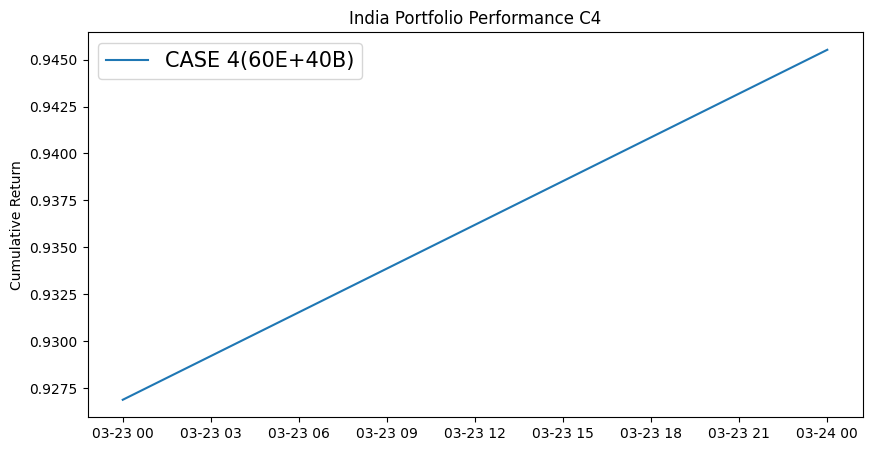

In [ ]:
# India
weighted_return_c4_in = (wts_c4 * case4_data_in_nsei)

#Cumulative Portfolio india
portfolio_return_c4_in = weighted_return_c4_in.sum(axis=1)
cumprod_portfolio_c4_in = (1 + portfolio_return_c4_in).cumprod()

#Plotting the solution portfolio's returns
plt.figure(figsize=(10, 5))
plt.plot(cumprod_portfolio_c4_in, label='CASE 4(60E+40B)')
plt.legend(loc='upper left', fontsize=15)
plt.title("India Portfolio Performance C4")
plt.ylabel('Cumulative Return')

#### CASE 5

In [ ]:
case5_in=selected_returns_dataframe(filtered_dates5)
case5_in.head()

,Date,Portfolio_Return_IN_bond
0,2020-03-26,0.013184
1,2020-03-27,-0.010469
2,2020-03-30,0.011567
3,2020-03-31,-0.026641
4,2020-04-03,-0.016838


<Axes: ylabel='Frequency'>

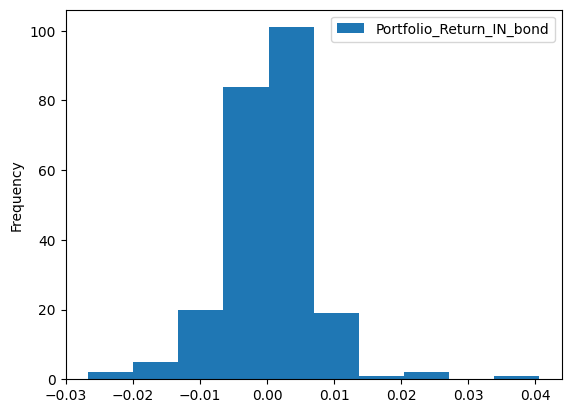

In [ ]:
# Histogram of bond
case5_in.plot.hist()

Text(0, 0.5, 'Return')

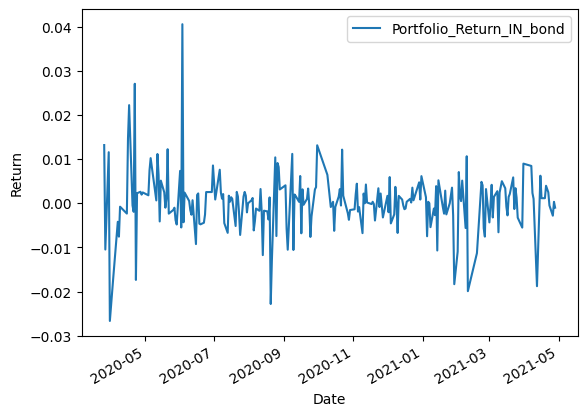

In [ ]:
selected_returns_bond_in=case5_in.set_index('Date')
selected_returns_bond_in.plot()
plt.ylabel('Return')

In [ ]:
case5_nsei=case5_nsei.set_index('Date')
case5_in=case5_in.set_index('Date')

In [ ]:
case5_data_in_nsei = case5_nsei.join(case5_in, how='inner')
case5_data_in_nsei.head()

,Portfolio_Return_nsei,Portfolio_Return_IN_bond
Date,,
2020-03-26,0.038904,0.013184
2020-03-27,0.002176,-0.010469
2020-03-30,-0.043781,0.011567
2020-03-31,0.038238,-0.026641
2020-04-03,-0.020597,-0.016838


Text(0, 0.5, 'Cumulative Return')

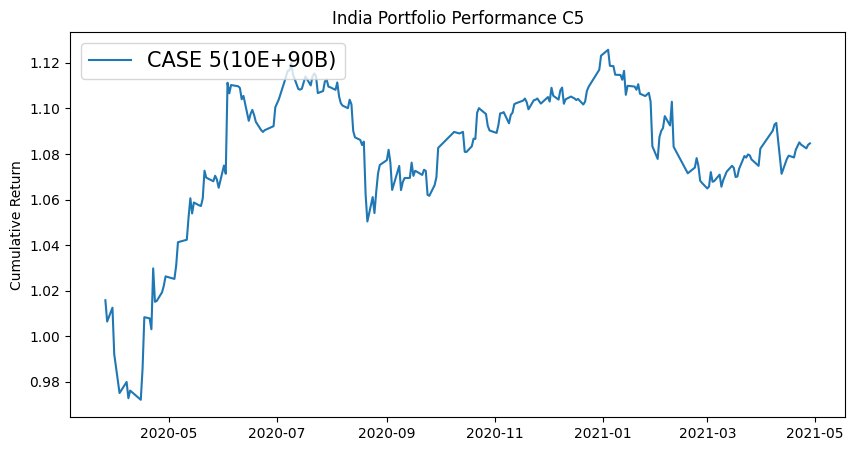

In [ ]:
# India
weighted_return_c5_in = (wts_c5 * case5_data_in_nsei)

#Cumulative Portfolio india

portfolio_return_c5_in = weighted_return_c5_in.sum(axis=1)
cumprod_portfolio_c5_in = (1 + portfolio_return_c5_in).cumprod()

#Plotting the solution portfolio's returns
plt.figure(figsize=(10, 5))
plt.plot(cumprod_portfolio_c5_in, label='CASE 5(10E+90B)')
plt.legend(loc='upper left', fontsize=15)
plt.title("India Portfolio Performance C5")
plt.ylabel('Cumulative Return')

**EQUITY**

In [ ]:
drawdown(case1_data_in_nsei['Portfolio_Return_nsei'])

,Wealth,Previous Peak,Drawdown
Date,,,
2014-11-11,1002.205158,1002.205158,0.000000
2014-11-12,1004.679846,1004.679846,0.000000
2014-11-13,1001.629818,1004.679846,-0.003036
2014-11-14,1005.470880,1005.470880,0.000000
2014-11-17,1010.366420,1010.366420,0.000000
...,...,...,...
2020-02-03,1242.113700,1420.829473,-0.125783
2020-02-13,1239.410861,1420.829473,-0.127685
2020-02-14,1233.180523,1420.829473,-0.132070


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_410, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_411, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_412, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_413, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_414, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_415, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_416, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_417, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_418, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_419, *['Previous Peak', 'count()', None], **{})
chart

In [ ]:
drawdown(case2_data_in_nsei['Portfolio_Return_nsei'])

,Wealth,Previous Peak,Drawdown
Date,,,
2013-01-04,1001.106565,1001.106565,0.000000
2013-01-07,996.488876,1001.106565,-0.004613
2013-01-08,998.702088,1001.106565,-0.002402
2013-01-09,993.676679,1001.106565,-0.007422
2013-01-10,993.202413,1001.106565,-0.007895
...,...,...,...
2022-12-29,1603.012433,1788.724077,-0.103824
2022-12-30,1595.460517,1788.724077,-0.108045
2023-01-03,1606.673937,1788.724077,-0.101777


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_420, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_421, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_422, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_423, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_424, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_425, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_426, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_427, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_428, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_429, *['Previous Peak', 'count()', None], **{})
chart

In [ ]:
drawdown(case3_data_in_nsei['Portfolio_Return_nsei'])

,Wealth,Previous Peak,Drawdown
Date,,,
2020-03-16,923.878999,923.878999,0.000000
2020-03-17,900.740279,923.878999,-0.025045
2020-03-18,850.691060,923.878999,-0.079218
2020-03-19,830.063689,923.878999,-0.101545
2020-03-20,878.480595,923.878999,-0.049139
2021-04-29,880.274286,923.878999,-0.047197
2021-04-30,864.683913,923.878999,-0.064072
2021-05-06,871.010296,923.878999,-0.057225
2021-05-07,876.827990,923.878999,-0.050928


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_430, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_431, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_432, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_433, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_434, *[[['Wealth', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_435, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_436, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_437, *['Previous Peak', 'count()', None], **{})
chart

In [ ]:
drawdown(case4_data_in_nsei['Portfolio_Return_nsei'])

,Wealth,Previous Peak,Drawdown
Date,,,
2020-03-23,870.195339,870.195339,0.0
2020-03-24,892.012376,892.012376,0.0


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_438, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_439, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_440, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_441, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_442, *[[['Wealth', 'Previous Peak']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_443, *['Wealth', 'count()', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_444, *['Previous Peak', 'count()', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_445, *['Drawdown', 'count()', None], **{})
chart

In [ ]:
drawdown(case5_data_in_nsei['Portfolio_Return_nsei'])

,Wealth,Previous Peak,Drawdown
Date,,,
2020-03-26,1038.904356,1038.904356,0.000000
2020-03-27,1041.164533,1041.164533,0.000000
2020-03-30,995.581791,1041.164533,-0.043781
2020-03-31,1033.650571,1041.164533,-0.007217
2020-04-03,1012.360911,1041.164533,-0.027665
...,...,...,...
2021-04-22,1680.092400,1823.763937,-0.078777
2021-04-23,1672.535121,1823.763937,-0.082921
2021-04-26,1689.288099,1823.763937,-0.073735


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_446, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_447, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_448, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_449, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_450, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_451, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_452, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_453, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_454, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_455, *['Previous Peak', 'count()', None], **{})
chart

**BOND**

In [ ]:
drawdown(case1_data_in_nsei['Portfolio_Return_IN_bond'])

,Wealth,Previous Peak,Drawdown
Date,,,
2014-11-11,1003.309635,1003.309635,0.000000
2014-11-12,995.620971,1003.309635,-0.007663
2014-11-13,996.348144,1003.309635,-0.006939
2014-11-14,1000.488938,1003.309635,-0.002811
2014-11-17,1003.924936,1003.924936,0.000000
...,...,...,...
2020-02-03,1114.229826,1138.180174,-0.021043
2020-02-13,1123.676899,1138.180174,-0.012743
2020-02-14,1120.510125,1138.180174,-0.015525


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_456, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_457, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_458, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_459, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_460, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_461, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_462, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_463, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_464, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_465, *['Previous Peak', 'count()', None], **{})
chart

In [ ]:
drawdown(case2_data_in_nsei['Portfolio_Return_IN_bond'])

,Wealth,Previous Peak,Drawdown
Date,,,
2013-01-04,1003.797468,1003.797468,0.000000
2013-01-07,1003.035669,1003.797468,-0.000759
2013-01-08,1004.178802,1004.178802,0.000000
2013-01-09,1006.728450,1006.728450,0.000000
2013-01-10,1008.136283,1008.136283,0.000000
...,...,...,...
2022-12-29,1086.717522,1361.652366,-0.201913
2022-12-30,1087.608152,1361.652366,-0.201259
2023-01-03,1087.608152,1361.652366,-0.201259


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_466, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_467, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_468, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_469, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_470, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_471, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_472, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_473, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_474, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_475, *['Previous Peak', 'count()', None], **{})
chart

In [ ]:
drawdown(case3_data_in_nsei['Portfolio_Return_IN_bond'])

,Wealth,Previous Peak,Drawdown
Date,,,
2020-03-16,990.901836,990.901836,0.000000
2020-03-17,986.022872,990.901836,-0.004924
2020-03-18,968.486739,990.901836,-0.022621
2020-03-19,991.851734,991.851734,0.000000
2020-03-20,973.193290,991.851734,-0.018812
2021-04-29,977.873656,991.851734,-0.014093
2021-04-30,987.040199,991.851734,-0.004851
2021-05-06,980.312244,991.851734,-0.011634
2021-05-07,980.475249,991.851734,-0.011470


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_476, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_477, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_478, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_479, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_480, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_481, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_482, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_483, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_484, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_485, *['Previous Peak', 'count()', None], **{})
chart

In [ ]:
drawdown(case4_data_in_nsei['Portfolio_Return_IN_bond'])

,Wealth,Previous Peak,Drawdown
Date,,,
2020-03-23,1011.897208,1011.897208,0.0
2020-03-24,1024.738956,1024.738956,0.0


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_486, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_487, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_488, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_489, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_490, *[[['Wealth', 'Previous Peak']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_491, *['Wealth', 'count()', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_492, *['Previous Peak', 'count()', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_493, *['Drawdown', 'count()', None], **{})
chart

In [ ]:
drawdown(case5_data_in_nsei['Portfolio_Return_IN_bond'])

,Wealth,Previous Peak,Drawdown
Date,,,
2020-03-26,1013.183594,1013.183594,0.000000
2020-03-27,1002.576904,1013.183594,-0.010469
2020-03-30,1014.173998,1014.173998,0.000000
2020-03-31,987.155090,1014.173998,-0.026641
2020-04-03,970.533209,1014.173998,-0.043031
...,...,...,...
2021-04-22,1030.554068,1094.712388,-0.058607
2021-04-23,1030.042034,1094.712388,-0.059075
2021-04-26,1027.150091,1094.712388,-0.061717


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_494, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_495, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_496, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_497, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_498, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_499, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_500, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_501, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_502, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_503, *['Previous Peak', 'count()', None], **{})
chart

In [ ]:
a1_in=case1_data_in_nsei['Portfolio_Return_nsei'].sum()
a2_in=case2_data_in_nsei['Portfolio_Return_nsei'].sum()
a3_in=case3_data_in_nsei['Portfolio_Return_nsei'].sum()
a4_in=case4_data_in_nsei['Portfolio_Return_nsei'].sum()
a5_in=case5_data_in_nsei['Portfolio_Return_nsei'].sum()
a_in=(a1_in+a2_in+a3_in+a4_in+a5_in)

b1_in=case1_data_in_nsei['Portfolio_Return_IN_bond'].sum()
b2_in=case2_data_in_nsei['Portfolio_Return_IN_bond'].sum()
b3_in=case3_data_in_nsei['Portfolio_Return_IN_bond'].sum()
b4_in=case4_data_in_nsei['Portfolio_Return_IN_bond'].sum()
b5_in=case5_data_in_nsei['Portfolio_Return_IN_bond'].sum()
b_in=(b1_in+b2_in+b3_in+b4_in+b5_in)

c1_in=filt_case1_nsei['^NSEI'].sum()
c2_in=filt_case2_nsei['^NSEI'].sum()
c3_in=filt_case3_nsei['^NSEI'].sum()
c4_in=filt_case4_nsei['^NSEI'].sum()
c5_in=filt_case5_nsei['^NSEI'].sum()
c_in=(c1_in+c2_in+c3_in+c4_in+c5_in)

d_in=return_multiData['^NSEI'].sum()
final_in=a_in+b_in+c_in-d_in
final_in_usd=final_in*1000000
final_in_usd_per_change=((final_in_usd-1000000)/1000000)*100
final_in_usd_per_change

701.2344161308868

## FOR CHINA


In [ ]:
filtered_dates1 = ann_vol_portfolio[((ann_vol_portfolio['^HSI'] < 15) & (ann_vol_portfolio['^HSI'].diff() <10))]['DateTime']
filtered_dates4  = ann_vol_portfolio[(((27 > ann_vol_portfolio['^HSI']) & (ann_vol_portfolio['^HSI'] >= 25)) | ((15 > ann_vol_portfolio['^HSI'].diff()) & (ann_vol_portfolio['^HSI'].diff() > 10)))]['DateTime']
filtered_dates3  = ann_vol_portfolio[(((25 > ann_vol_portfolio['^HSI']) & (ann_vol_portfolio['^HSI'] >= 20)) | ((30 > ann_vol_portfolio['^HSI'].diff()) & (ann_vol_portfolio['^HSI'].diff() > 20)))]['DateTime']
filtered_dates2  = ann_vol_portfolio[(((20 > ann_vol_portfolio['^HSI']) & (ann_vol_portfolio['^HSI'] >= 15)) | ((20 > ann_vol_portfolio['^HSI'].diff()) & (ann_vol_portfolio['^HSI'].diff() > 15)))]['DateTime']
filtered_dates5  = ann_vol_portfolio[((ann_vol_portfolio['^HSI']  >=  27) | (ann_vol_portfolio['^HSI'].diff() >25))]['DateTime']

In [ ]:
# Dates fullfilling the condition
def selected_returns_dataframe(filtered_dates):
  selected_returns = []
  for date in filtered_dates:
    return_value = df_bond_return.loc[df_bond_return['Date'] == date, 'CHI_Price'].values
    if len(return_value) > 0:
        selected_returns.append((date, return_value[0]))

  selected_return=pd.DataFrame(selected_returns)
  selected_return.set_axis(['Date', 'Portfolio_Return_chi_bond'], axis=1, inplace=True)
  return selected_return

#### CASE 1

In [ ]:
case1_chi=selected_returns_dataframe(filtered_dates1)
case1_chi.head()

,Date,Portfolio_Return_chi_bond
0,2015-03-20,0.006814
1,2015-03-23,0.001137
2,2015-03-24,0.002279
3,2015-03-25,-0.006229
4,2015-03-26,-0.008422


<Axes: ylabel='Frequency'>

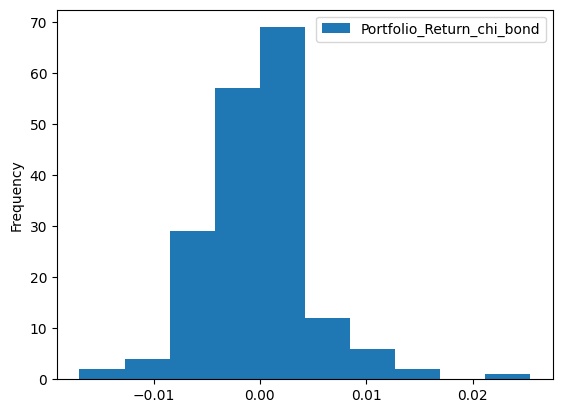

In [ ]:
# Histogram of bond
case1_chi.plot.hist()

Text(0, 0.5, 'Return')

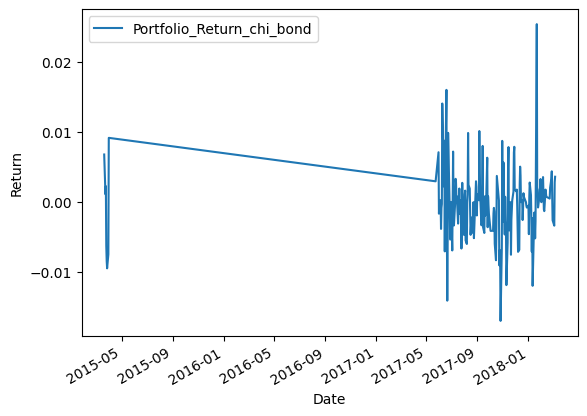

In [ ]:
selected_returns_bond_chi=case1_chi.set_index('Date')
selected_returns_bond_chi.plot()
plt.ylabel('Return')

In [ ]:
case1_hsi=case1_hsi.set_index('Date')
case1_chi=case1_chi.set_index('Date')

In [ ]:
case1_data_chi_hsi = case1_hsi.join(case1_chi, how='inner')
case1_data_chi_hsi.head()

,Portfolio_Return_hsi,Portfolio_Return_chi_bond
Date,,
2015-03-20,-0.003827,0.006814
2015-03-23,0.004893,0.001137
2015-03-24,-0.003875,0.002279
2015-03-25,0.005272,-0.006229
2015-03-26,-0.001270,-0.008422


Text(0, 0.5, 'Cumulative Return')

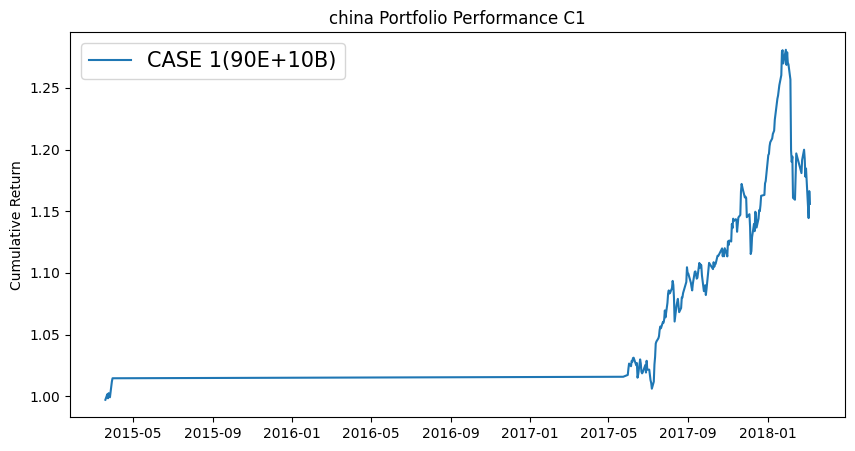

In [ ]:
# chi
weighted_return_c1_chi = (wts_c1 * case1_data_chi_hsi)

#Cumulative Portfolio chi
portfolio_return_c1_chi = weighted_return_c1_chi.sum(axis=1)
cumprod_portfolio_c1_chi = (1 + portfolio_return_c1_chi).cumprod()

#Plotting the solution portfolio's returns
plt.figure(figsize=(10, 5))
plt.plot(cumprod_portfolio_c1_chi, label='CASE 1(90E+10B)')
plt.legend(loc='upper left', fontsize=15)
plt.title("china Portfolio Performance C1")
plt.ylabel('Cumulative Return')

#### CASE 2

In [ ]:
case2_chi=selected_returns_dataframe(filtered_dates2)
case2_chi.head()

,Date,Portfolio_Return_chi_bond
0,2013-01-04,0.005571
1,2013-01-07,-0.002778
2,2013-01-08,0.005587
3,2013-01-09,-0.002786
4,2013-01-10,-0.002778


<Axes: ylabel='Frequency'>

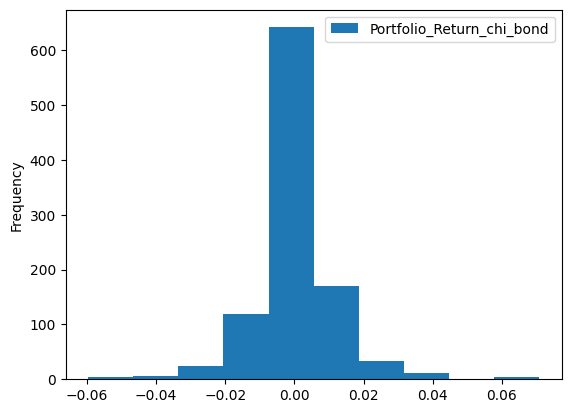

In [ ]:
# Histogram of bond
case2_chi.plot.hist()

Text(0, 0.5, 'Return')

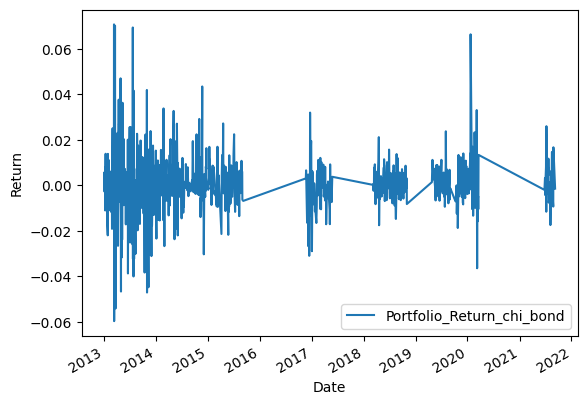

In [ ]:
selected_returns_bond_chi=case2_chi.set_index('Date')
selected_returns_bond_chi.plot()
plt.ylabel('Return')

In [ ]:
case2_hsi=case2_hsi.set_index('Date')
case2_chi=case2_chi.set_index('Date')

In [ ]:
case2_data_chi_hsi = case2_hsi.join(case2_chi, how='inner')
case2_data_chi_hsi.head()

,Portfolio_Return_hsi,Portfolio_Return_chi_bond
Date,,
2013-01-04,-0.002885,0.005571
2013-01-07,-0.000057,-0.002778
2013-01-08,-0.009368,0.005587
2013-01-09,0.004642,-0.002786
2013-01-10,0.005851,-0.002778


Text(0, 0.5, 'Cumulative Return')

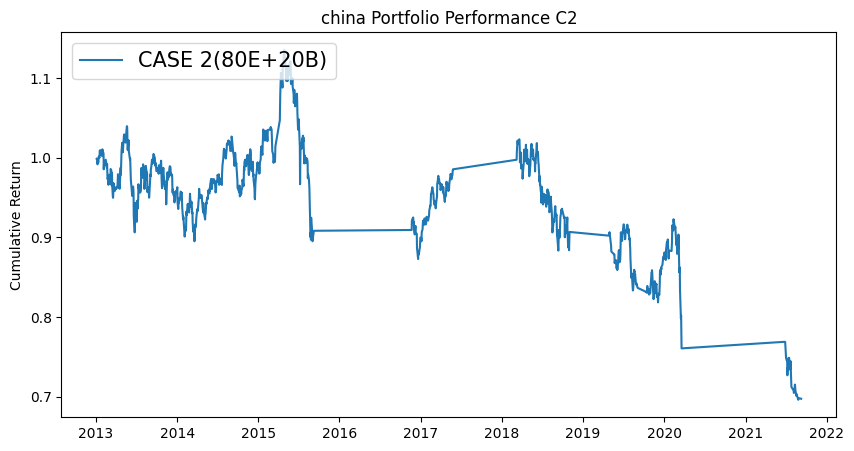

In [ ]:
# china
weighted_return_c2_chi = (wts_c2 * case2_data_chi_hsi)

#Cumulative Portfolio chi
portfolio_return_c2_chi = weighted_return_c2_chi.sum(axis=1)
cumprod_portfolio_c2_chi = (1 + portfolio_return_c2_chi).cumprod()

#Plotting the solution portfolio's returns
plt.figure(figsize=(10, 5))
plt.plot(cumprod_portfolio_c2_chi, label='CASE 2(80E+20B)')
plt.legend(loc='upper left', fontsize=15)
plt.title("china Portfolio Performance C2")
plt.ylabel('Cumulative Return')

#### CASE 3

In [ ]:
case3_chi=selected_returns_dataframe(filtered_dates3)
case3_chi.head()

,Date,Portfolio_Return_chi_bond
0,2015-09-09,0.003851
1,2015-09-10,0.000889
2,2015-09-11,0.003570
3,2015-09-14,0.000595
4,2015-09-15,0.005388


<Axes: ylabel='Frequency'>

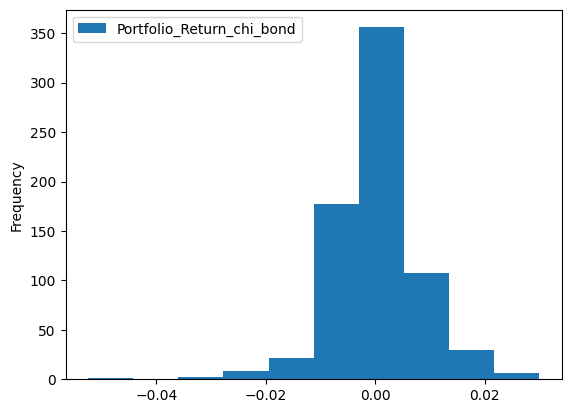

In [ ]:
# Histogram of bond
case3_chi.plot.hist()

Text(0, 0.5, 'Return')

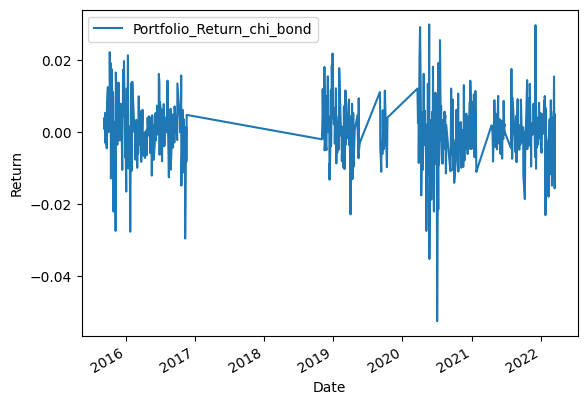

In [ ]:
selected_returns_bond_chi=case3_chi.set_index('Date')
selected_returns_bond_chi.plot()
plt.ylabel('Return')

In [ ]:
case3_hsi=case3_hsi.set_index('Date')
case3_chi=case3_chi.set_index('Date')

In [ ]:
case3_data_chi_hsi = case3_hsi.join(case3_chi, how='inner')
case3_data_chi_hsi.head()

,Portfolio_Return_hsi,Portfolio_Return_chi_bond
Date,,
2015-09-09,0.041031,0.003851
2015-09-10,-0.025702,0.000889
2015-09-11,-0.002696,0.003570
2015-09-14,0.002675,0.000595
2015-09-15,-0.004947,0.005388


Text(0, 0.5, 'Cumulative Return')

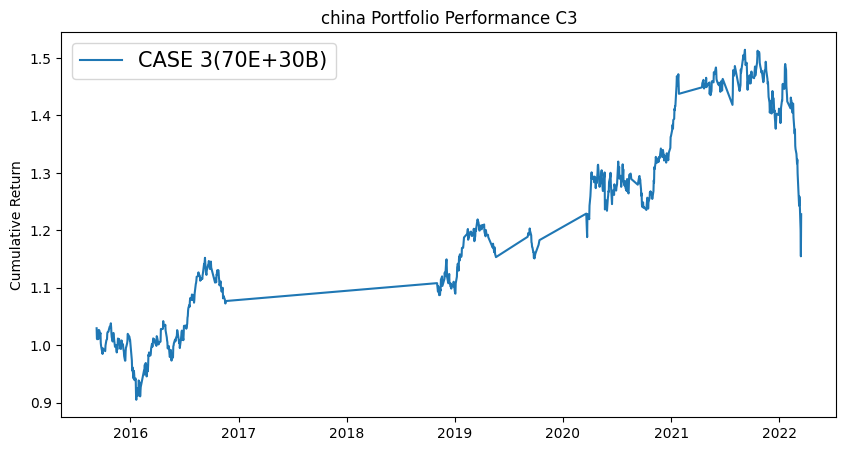

In [ ]:
# china
weighted_return_c3_chi = (wts_c3 * case3_data_chi_hsi)

#Cumulative Portfolio chi

portfolio_return_c3_chi = weighted_return_c3_chi.sum(axis=1)
cumprod_portfolio_c3_chi = (1 + portfolio_return_c3_chi).cumprod()

#Plotting the solution portfolio's returns
plt.figure(figsize=(10, 5))
plt.plot(cumprod_portfolio_c3_chi, label='CASE 3(70E+30B)')
plt.legend(loc='upper left', fontsize=15)
plt.title("china Portfolio Performance C3")
plt.ylabel('Cumulative Return')

#### CASE 4

In [ ]:
case4_chi=selected_returns_dataframe(filtered_dates4)
case4_chi.head()

,Date,Portfolio_Return_chi_bond
0,2020-08-20,-0.000666
1,2020-08-21,0.000666
2,2020-08-24,-0.015410
3,2020-08-25,-0.002942
4,2020-08-26,-0.002608


<Axes: ylabel='Frequency'>

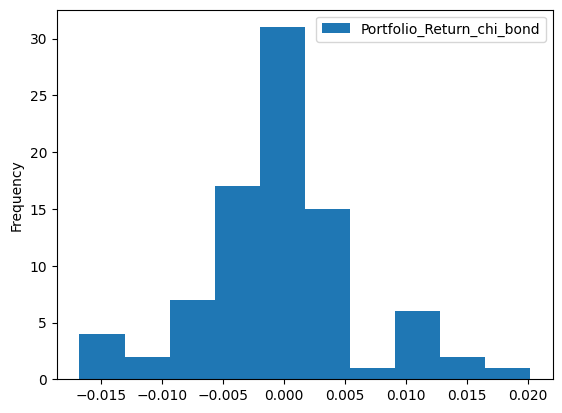

In [ ]:
# Histogram of bond
case4_chi.plot.hist()

Text(0, 0.5, 'Return')

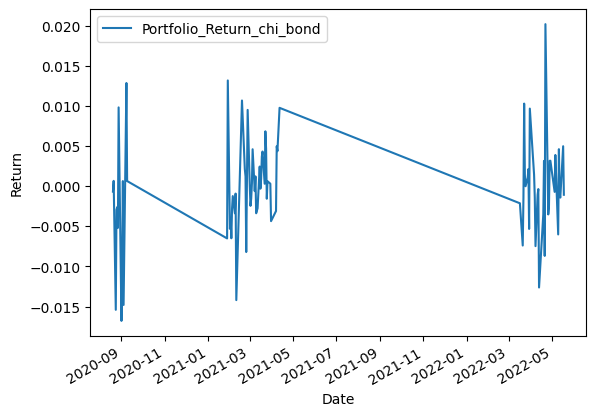

In [ ]:
selected_returns_bond_chi=case4_chi.set_index('Date')
selected_returns_bond_chi.plot()
plt.ylabel('Return')

In [ ]:
case4_hsi=case4_hsi.set_index('Date')
case4_chi=case4_chi.set_index('Date')

In [ ]:
case4_data_chi_hsi = case4_hsi.join(case4_chi, how='inner')
case4_data_chi_hsi.head()

,Portfolio_Return_hsi,Portfolio_Return_chi_bond
Date,,
2020-08-20,-0.015391,-0.000666
2020-08-21,0.013006,0.000666
2020-08-24,0.017430,-0.015410
2020-08-25,-0.002558,-0.002942
2020-08-26,0.000218,-0.002608


Text(0, 0.5, 'Cumulative Return')

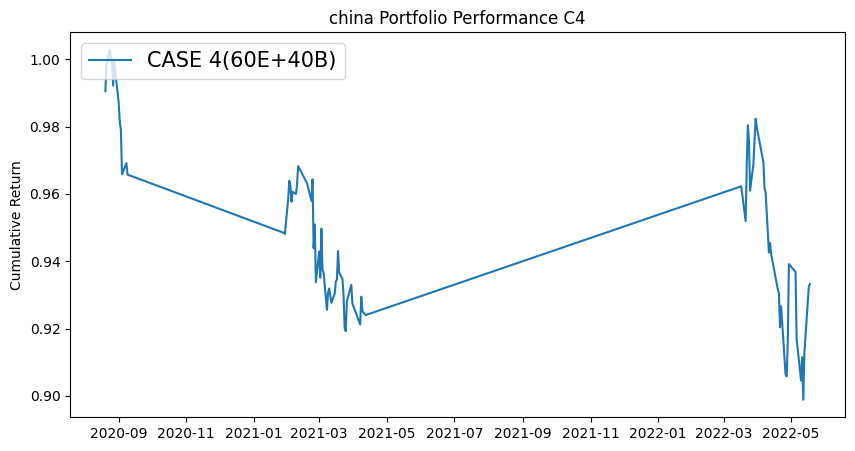

In [ ]:
# china
weighted_return_c4_chi = (wts_c4 * case4_data_chi_hsi)

#Cumulative Portfolio chi
portfolio_return_c4_chi = weighted_return_c4_chi.sum(axis=1)
cumprod_portfolio_c4_chi = (1 + portfolio_return_c4_chi).cumprod()

#Plotting the solution portfolio's returns
plt.figure(figsize=(10, 5))
plt.plot(cumprod_portfolio_c4_chi, label='CASE 4(60E+40B)')
plt.legend(loc='upper left', fontsize=15)
plt.title("china Portfolio Performance C4")
plt.ylabel('Cumulative Return')

#### CASE 5

In [ ]:
case5_chi=selected_returns_dataframe(filtered_dates5)
case5_chi.head()

,Date,Portfolio_Return_chi_bond
0,2022-05-19,-0.003898
1,2022-05-20,0.006061
2,2022-05-23,0.001428
3,2022-05-24,0.006830
4,2022-05-25,0.012741


<Axes: ylabel='Frequency'>

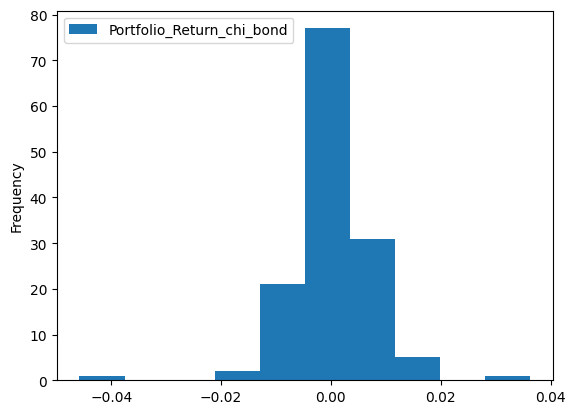

In [ ]:
# Histogram of bond
case5_chi.plot.hist()

Text(0, 0.5, 'Return')

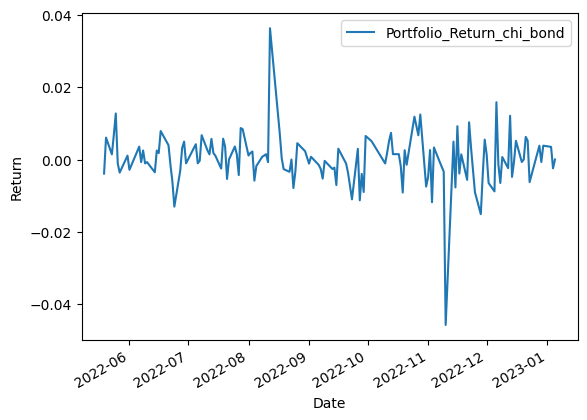

In [ ]:
selected_returns_bond_chi=case5_chi.set_index('Date')
selected_returns_bond_chi.plot()
plt.ylabel('Return')

In [ ]:
case5_hsi=case5_hsi.set_index('Date')
case5_chi=case5_chi.set_index('Date')

In [ ]:
case5_data_chi_hsi = case5_hsi.join(case5_chi, how='inner')
case5_data_chi_hsi.head()

,Portfolio_Return_hsi,Portfolio_Return_chi_bond
Date,,
2022-05-19,-0.025363,-0.003898
2022-05-20,0.029649,0.006061
2022-05-23,-0.011931,0.001428
2022-05-24,-0.017487,0.006830
2022-05-25,0.002942,0.012741


Text(0, 0.5, 'Cumulative Return')

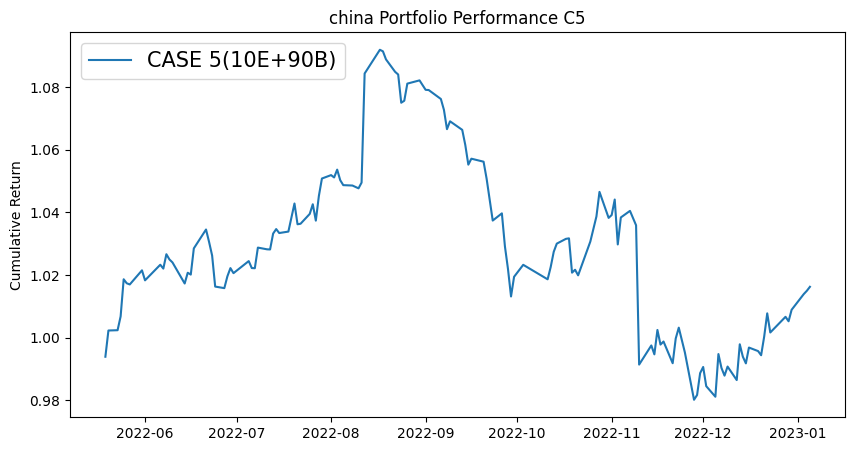

In [ ]:
# china
weighted_return_c5_chi = (wts_c5 * case5_data_chi_hsi)

#Cumulative Portfolio china
portfolio_return_c5_chi = weighted_return_c5_chi.sum(axis=1)
cumprod_portfolio_c5_chi = (1 + portfolio_return_c5_chi).cumprod()

#Plotting the solution portfolio's returns
plt.figure(figsize=(10, 5))
plt.plot(cumprod_portfolio_c5_chi, label='CASE 5(10E+90B)')
plt.legend(loc='upper left', fontsize=15)
plt.title("china Portfolio Performance C5")
plt.ylabel('Cumulative Return')

**EQUITY**

In [ ]:
drawdown(case1_data_chi_hsi['Portfolio_Return_hsi'])

,Wealth,Previous Peak,Drawdown
Date,,,
2015-03-20,996.172675,996.172675,0.000000
2015-03-23,1001.047009,1001.047009,0.000000
2015-03-24,997.168200,1001.047009,-0.003875
2015-03-25,1002.425114,1002.425114,0.000000
2015-03-26,1001.152053,1002.425114,-0.001270
...,...,...,...
2018-02-28,1208.089624,1329.979345,-0.091648
2018-03-01,1215.904552,1329.979345,-0.085772
2018-03-05,1170.554883,1329.979345,-0.119870


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_504, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_505, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_506, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_507, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_508, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_509, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_510, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_511, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_512, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_513, *['Previous Peak', 'count()', None], **{})
chart

In [ ]:
drawdown(case2_data_chi_hsi['Portfolio_Return_hsi'])

,Wealth,Previous Peak,Drawdown
Date,,,
2013-01-04,997.114795,997.114795,0.000000
2013-01-07,997.057533,997.114795,-0.000057
2013-01-08,987.716780,997.114795,-0.009425
2013-01-09,992.301723,997.114795,-0.004827
2013-01-10,998.107192,998.107192,0.000000
...,...,...,...
2021-08-17,589.486037,1137.842493,-0.481927
2021-08-18,592.259713,1137.842493,-0.479489
2021-08-26,585.845672,1137.842493,-0.485126


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_514, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_515, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_516, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_517, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_518, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_519, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_520, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_521, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_522, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_523, *['Previous Peak', 'count()', None], **{})
chart

In [ ]:
drawdown(case3_data_chi_hsi['Portfolio_Return_hsi'])

,Wealth,Previous Peak,Drawdown
Date,,,
2015-09-09,1041.030617,1041.030617,0.000000
2015-09-10,1014.274443,1041.030617,-0.025702
2015-09-11,1011.540036,1041.030617,-0.028328
2015-09-14,1014.246238,1041.030617,-0.025729
2015-09-15,1009.228611,1041.030617,-0.030549
...,...,...,...
2022-03-10,1270.194730,1671.907147,-0.240272
2022-03-11,1249.736233,1671.907147,-0.252509
2022-03-14,1187.587520,1671.907147,-0.289681


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_524, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_525, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_526, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_527, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_528, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_529, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_530, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_531, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_532, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_533, *['Previous Peak', 'count()', None], **{})
chart

In [ ]:
drawdown(case4_data_chi_hsi['Portfolio_Return_hsi'])

,Wealth,Previous Peak,Drawdown
Date,,,
2020-08-20,984.609360,984.609360,0.000000
2020-08-21,997.415682,997.415682,0.000000
2020-08-24,1014.800876,1014.800876,0.000000
2020-08-25,1012.205077,1014.800876,-0.002558
2020-08-26,1012.426229,1014.800876,-0.002340
...,...,...,...
2022-05-11,870.521733,1014.800876,-0.142175
2022-05-12,851.015016,1014.800876,-0.161397
2022-05-13,873.779913,1014.800876,-0.138964


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_534, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_535, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_536, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_537, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_538, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_539, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_540, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_541, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_542, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_543, *['Previous Peak', 'count()', None], **{})
chart

In [ ]:
drawdown(case5_data_chi_hsi['Portfolio_Return_hsi'])

,Wealth,Previous Peak,Drawdown
Date,,,
2022-05-19,974.637060,974.637060,0.000000
2022-05-20,1003.534196,1003.534196,0.000000
2022-05-23,991.560919,1003.534196,-0.011931
2022-05-24,974.221445,1003.534196,-0.029210
2022-05-25,977.087611,1003.534196,-0.026353
...,...,...,...
2022-12-29,928.392618,1085.965288,-0.145099
2022-12-30,930.286427,1085.965288,-0.143355
2023-01-03,947.399039,1085.965288,-0.127597


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_544, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_545, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_546, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_547, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_548, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_549, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_550, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_551, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_552, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_553, *['Previous Peak', 'count()', None], **{})
chart

**BOND**

In [ ]:
drawdown(case1_data_chi_hsi['Portfolio_Return_chi_bond'])

,Wealth,Previous Peak,Drawdown
Date,,,
2015-03-20,1006.814310,1006.814310,0.000000
2015-03-23,1007.959068,1007.959068,0.000000
2015-03-24,1010.256410,1010.256410,0.000000
2015-03-25,1003.963760,1010.256410,-0.006229
2015-03-26,995.508141,1010.256410,-0.014599
...,...,...,...
2018-02-28,929.687692,1028.542292,-0.096111
2018-03-01,927.281045,1028.542292,-0.098451
2018-03-05,924.170970,1028.542292,-0.101475


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_554, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_555, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_556, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_557, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_558, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_559, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_560, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_561, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_562, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_563, *['Previous Peak', 'count()', None], **{})
chart

In [ ]:
drawdown(case2_data_chi_hsi['Portfolio_Return_chi_bond'])

,Wealth,Previous Peak,Drawdown
Date,,,
2013-01-04,1005.571031,1005.571031,0.000000
2013-01-07,1002.777778,1005.571031,-0.002778
2013-01-08,1008.379888,1008.379888,0.000000
2013-01-09,1005.571031,1008.379888,-0.002786
2013-01-10,1002.777778,1008.379888,-0.005556
...,...,...,...
2021-08-17,1254.791379,1274.636580,-0.015569
2021-08-18,1253.471935,1274.636580,-0.016604
2021-08-26,1241.837785,1274.636580,-0.025732


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_564, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_565, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_566, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_567, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_568, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_569, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_570, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_571, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_572, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_573, *['Previous Peak', 'count()', None], **{})
chart

In [ ]:
drawdown(case3_data_chi_hsi['Portfolio_Return_chi_bond'])

,Wealth,Previous Peak,Drawdown
Date,,,
2015-09-09,1003.850711,1003.850711,0.000000
2015-09-10,1004.743552,1004.743552,0.000000
2015-09-11,1008.330854,1008.330854,0.000000
2015-09-14,1008.931230,1008.931230,0.000000
2015-09-15,1014.366956,1014.366956,0.000000
...,...,...,...
2022-03-10,1164.155310,1347.260025,-0.135909
2022-03-11,1182.162029,1347.260025,-0.122544
2022-03-14,1163.743074,1347.260025,-0.136215


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_574, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_575, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_576, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_577, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_578, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_579, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_580, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_581, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_582, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_583, *['Previous Peak', 'count()', None], **{})
chart

In [ ]:
drawdown(case4_data_chi_hsi['Portfolio_Return_chi_bond'])

,Wealth,Previous Peak,Drawdown
Date,,,
2020-08-20,999.334443,999.334443,0.000000
2020-08-21,1000.000000,1000.000000,0.000000
2020-08-24,984.590164,1000.000000,-0.015410
2020-08-25,981.693364,1000.000000,-0.018307
2020-08-26,979.132703,1000.000000,-0.020867
...,...,...,...
2022-05-11,968.394084,1000.000000,-0.031606
2022-05-12,967.363147,1000.000000,-0.032637
2022-05-13,965.991973,1000.000000,-0.034008


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_584, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_585, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_586, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_587, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_588, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_589, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_590, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_591, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_592, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_593, *['Previous Peak', 'count()', None], **{})
chart

In [ ]:
drawdown(case5_data_chi_hsi['Portfolio_Return_chi_bond'])

,Wealth,Previous Peak,Drawdown
Date,,,
2022-05-19,996.102055,996.102055,0.000000
2022-05-20,1002.139037,1002.139037,0.000000
2022-05-23,1003.570154,1003.570154,0.000000
2022-05-24,1010.424155,1010.424155,0.000000
2022-05-25,1023.298143,1023.298143,0.000000
...,...,...,...
2022-12-29,1011.508183,1104.248944,-0.083985
2022-12-30,1015.380995,1104.248944,-0.080478
2023-01-03,1018.927558,1104.248944,-0.077266


import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_594, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_595, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def value_plot(df, y, figscale=1):
  from matplotlib import pyplot as plt
  df[y].plot(kind='line', figsize=(8 * figscale, 4 * figscale), title=y)
  plt.gca().spines[['top', 'right']].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = value_plot(_df_596, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_597, *['Wealth'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_598, *['Previous Peak'], **{})
chart

import numpy as np
from google.colab import autoviz

def histogram(df, colname, num_bins=20, figscale=1):
  from matplotlib import pyplot as plt
  df[colname].plot(kind='hist', bins=num_bins, title=colname, figsize=(8*figscale, 4*figscale))
  plt.gca().spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = histogram(_df_599, *['Drawdown'], **{})
chart

import numpy as np
from google.colab import autoviz

def scatter_plots(df, colname_pairs, figscale=1, alpha=.8):
  from matplotlib import pyplot as plt
  plt.figure(figsize=(len(colname_pairs) * 6 * figscale, 6 * figscale))
  for plot_i, (x_colname, y_colname) in enumerate(colname_pairs, start=1):
    ax = plt.subplot(1, len(colname_pairs), plot_i)
    df.plot(kind='scatter', x=x_colname, y=y_colname, s=(32 * figscale), alpha=alpha, ax=ax)
    ax.spines[['top', 'right',]].set_visible(False)
  plt.tight_layout()
  return autoviz.MplChart.from_current_mpl_state()

chart = scatter_plots(_df_600, *[[['Wealth', 'Previous Peak'], ['Previous Peak', 'Drawdown']]], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_601, *['Previous Peak', 'Wealth', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_602, *['Previous Peak', 'Drawdown', None], **{})
chart

import numpy as np
from google.colab import autoviz

def time_series_multiline(df, timelike_colname, value_colname, series_colname, figscale=1, mpl_palette_name='Dark2'):
  from matplotlib import pyplot as plt
  import seaborn as sns
  figsize = (10 * figscale, 5.2 * figscale)
  palette = list(sns.palettes.mpl_palette(mpl_palette_name))
  def _plot_series(series, series_name, series_index=0):
    if value_colname == 'count()':
      counted = (series[timelike_colname]
                 .value_counts()
                 .reset_index(name='counts')
                 .rename({'index': timelike_colname}, axis=1)
                 .sort_values(timelike_colname, ascending=True))
      xs = counted[timelike_colname]
      ys = counted['counts']
    else:
      xs = series[timelike_colname]
      ys = series[value_colname]
    plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

  fig, ax = plt.subplots(figsize=figsize, layout='constrained')
  df = df.sort_values(timelike_colname, ascending=True)
  if series_colname:
    for i, (series_name, series) in enumerate(df.groupby(series_colname)):
      _plot_series(series, series_name, i)
    fig.legend(title=series_colname, bbox_to_anchor=(1, 1), loc='upper left')
  else:
    _plot_series(df, '')
  sns.despine(fig=fig, ax=ax)
  plt.xlabel(timelike_colname)
  plt.ylabel(value_colname)
  return autoviz.MplChart.from_current_mpl_state()

chart = time_series_multiline(_df_603, *['Previous Peak', 'count()', None], **{})
chart

In [ ]:
a1_chi=case1_data_chi_hsi['Portfolio_Return_hsi'].sum()
a2_chi=case2_data_chi_hsi['Portfolio_Return_hsi'].sum()
a3_chi=case3_data_chi_hsi['Portfolio_Return_hsi'].sum()
a4_chi=case4_data_chi_hsi['Portfolio_Return_hsi'].sum()
a5_chi=case5_data_chi_hsi['Portfolio_Return_hsi'].sum()
a_chi=(a1_chi+a2_chi+a3_chi+a4_chi+a5_chi)

b1_chi=case1_data_chi_hsi['Portfolio_Return_chi_bond'].sum()
b2_chi=case2_data_chi_hsi['Portfolio_Return_chi_bond'].sum()
b3_chi=case3_data_chi_hsi['Portfolio_Return_chi_bond'].sum()
b4_chi=case4_data_chi_hsi['Portfolio_Return_chi_bond'].sum()
b5_chi=case5_data_chi_hsi['Portfolio_Return_chi_bond'].sum()
b_chi=(b1_chi+b2_chi+b3_chi+b4_chi+b5_chi)

c1_chi=filt_case1_hsi['^HSI'].sum()
c2_chi=filt_case2_hsi['^HSI'].sum()
c3_chi=filt_case3_hsi['^HSI'].sum()
c4_chi=filt_case4_hsi['^HSI'].sum()
c5_chi=filt_case5_hsi['^HSI'].sum()
c_chi=(c1_chi+c2_chi+c3_chi+c4_chi+c5_chi)

d_chi=return_multiData['^HSI'].sum()
final_chi=a_chi+b_chi+c_chi-d_chi
final_chi_usd=final_chi*1000000
final_chi_usd_per_change=((final_chi_usd-1000000)/1000000)*100
final_chi_usd_per_change

144.09711313419874

Returns of an investments of $1000000 from different markets

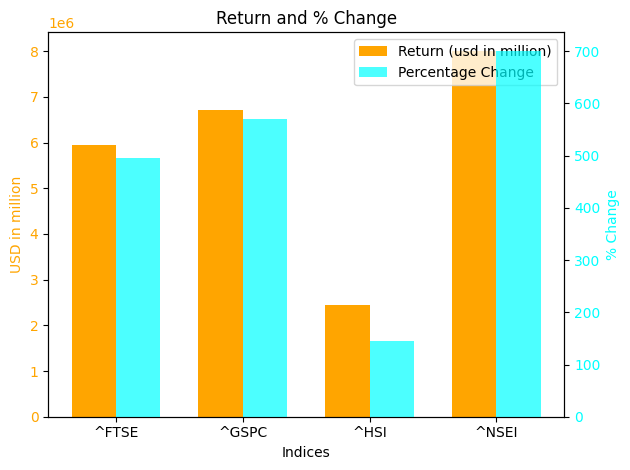

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
data = {
    'Indices': ['^FTSE', '^GSPC', '^HSI', '^NSEI'],
    'USD_Value': [final_uk_usd, final_us_usd, final_chi_usd, final_in_usd],
    'Percentage_change':[final_uk_usd_per_change,final_us_usd_per_change,final_chi_usd_per_change,final_in_usd_per_change]
}

df=pd.DataFrame(data)
# Calculate the width of each bar
bar_width = 0.35

# Create a figure and primary y-axis (left)
fig, ax1 = plt.subplots()

# Create an array of x positions for the bars
x = np.arange(len(df['Indices']))

# Plot the first bar graph on the primary y-axis
ax1.bar(x - bar_width/2, df['USD_Value'], bar_width, color='orange', label='Return (usd in million)')
ax1.set_xlabel('Indices')
ax1.set_ylabel('USD in million', color='orange')
ax1.tick_params(axis='y', labelcolor='orange')

# Create a secondary y-axis (right)
ax2 = ax1.twinx()

# Plot the second bar graph on the secondary y-axis
ax2.bar(x + bar_width/2, df['Percentage_change'], bar_width, color='cyan', label='Percentage Change', alpha=0.7)
ax2.set_ylabel('% Change', color='cyan')
ax2.tick_params(axis='y', labelcolor='cyan')

# Adjust x-axis positions and labels
ax1.set_xticks(x)
ax1.set_xticklabels(df['Indices'])

# Combine legends from both axes
lines1, labels1 = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
lines = lines1 + lines2
labels = labels1 + labels2

# Display a single legend for both bar graphs
ax1.legend(lines, labels, loc='upper right')

plt.title('Return and % Change')
plt.tight_layout()
plt.show()


Cumulative returns during Pandemic year of 2020



**Equity**

In [ ]:
Tickers_P = [ '^FTSE', '^GSPC', '^HSI','^NSEI','GLD']
Start_Date1 = "2020-01-01"
End_Date1 = "2020-12-31"

In [ ]:
CovidData = GetAdjCloseQuotes(Tickers_P, Start_Date1, End_Date1)
CovidData.head()

,^FTSE,^GSPC,^HSI,^NSEI,GLD
DateTime,,,,,
2020-01-02,7604.299805,3257.850098,28543.519531,12282.200195,143.949997
2020-01-03,7622.399902,3234.850098,28451.500000,12226.650391,145.860001
2020-01-06,7575.299805,3246.280029,28226.189453,11993.049805,147.389999
2020-01-07,7573.899902,3237.179932,28322.060547,12052.950195,147.970001
2020-01-08,7574.899902,3253.050049,28087.919922,12025.349609,146.860001


In [ ]:
# Calculating daily returns
return_CovidData = CovidData.pct_change().dropna()
return_CovidData

,^FTSE,^GSPC,^HSI,^NSEI,GLD
DateTime,,,,,
2020-01-03,0.002380,-0.007060,-0.003224,-0.004523,0.013269
2020-01-06,-0.006179,0.003533,-0.007919,-0.019106,0.010489
2020-01-07,-0.000185,-0.002803,0.003397,0.004995,0.003935
2020-01-08,0.000132,0.004902,-0.008267,-0.002290,-0.007502
2020-01-09,0.003063,0.006655,0.016843,0.015846,-0.005652
...,...,...,...,...,...
2020-12-22,0.000000,-0.002073,-0.007125,0.010346,-0.007903
2020-12-23,0.012390,0.000746,0.008570,0.010010,0.006648
2020-12-24,0.000970,0.003537,0.001650,0.010893,0.003985


In [ ]:
# Cumulative return
cumprod_return_CovidData = (1 + return_CovidData).cumprod()
cumprod_return_CovidData.head()

,^FTSE,^GSPC,^HSI,^NSEI,GLD
DateTime,,,,,
2020-01-03,1.002380,0.992940,0.996776,0.995477,1.013269
2020-01-06,0.996186,0.996449,0.988883,0.976458,1.023897
2020-01-07,0.996002,0.993655,0.992241,0.981335,1.027926
2020-01-08,0.996134,0.998527,0.984038,0.979088,1.020215
2020-01-09,0.999185,1.005172,1.000612,0.994602,1.014449


Text(0.5, 1.0, 'Cumulative Returns of Equity During Covid')

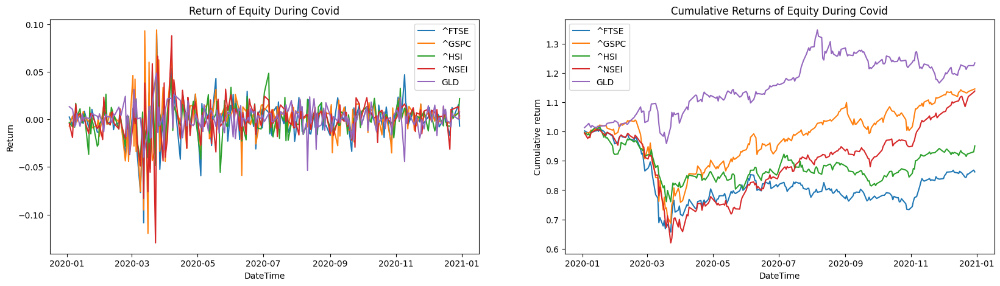

In [ ]:
fig, axes = plt.subplots(1, 2, sharex=True, figsize=(20,5))

sns.lineplot(data=return_CovidData, dashes=False, ax=axes[0])
axes[0].set_ylabel('Return')
axes[0].set_title('Return of Equity During Covid')


sns.lineplot(data=cumprod_return_CovidData, dashes=False, ax=axes[1])
axes[1].set_ylabel('Cumulative return')
axes[1].set_title('Cumulative Returns of Equity During Covid')


**Bond**

In [ ]:
bond_CovidData=df_bond.loc[Start_Date1:End_Date1]
bond_CovidData.head()

,US_Price,IN_Price,UK_Price,CHI_Price
Date,,,,
2020-12-31,0.916,5.894,0.196,3.203
2020-12-30,0.926,5.899,0.211,3.192
2020-12-29,0.940,5.927,0.213,3.205
2020-12-28,0.923,5.925,0.253,3.213
2020-12-24,0.926,5.929,0.257,3.259


In [ ]:
# Return
bond_return_CovidData=bond_CovidData.pct_change().dropna()
bond_return_CovidData.head()

,US_Price,IN_Price,UK_Price,CHI_Price
Date,,,,
2020-12-30,0.010917,0.000848,0.076531,-0.003434
2020-12-29,0.015119,0.004747,0.009479,0.004073
2020-12-28,-0.018085,-0.000337,0.187793,0.002496
2020-12-24,0.003250,0.000675,0.015810,0.014317
2020-12-23,0.020518,0.003542,0.108949,-0.004603


In [ ]:
# Cumulative Return
cumprod_cum_return_CovidData=(1+bond_return_CovidData).cumprod()
cumprod_cum_return_CovidData.head()

,US_Price,IN_Price,UK_Price,CHI_Price
Date,,,,
2020-12-30,1.010917,1.000848,1.076531,0.996566
2020-12-29,1.026201,1.005599,1.086735,1.000624
2020-12-28,1.007642,1.005260,1.290816,1.003122
2020-12-24,1.010917,1.005938,1.311224,1.017484
2020-12-23,1.031659,1.009501,1.454082,1.012800


Text(0.5, 1.0, 'Cumulative Returns of Bond During Covid')

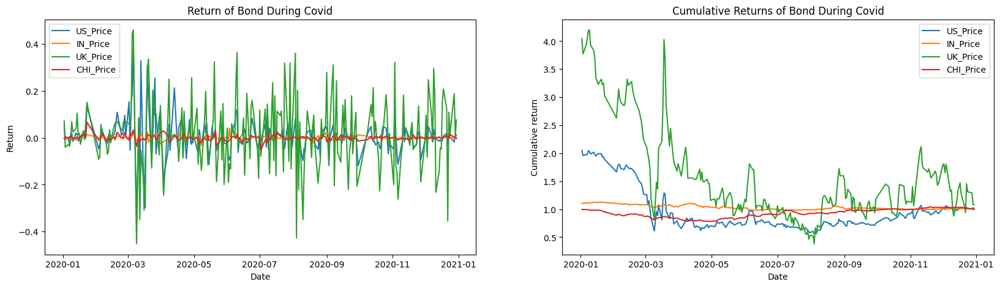

In [ ]:
fig, axes = plt.subplots(1, 2, sharex=True, figsize=(20,5))

sns.lineplot(data=bond_return_CovidData, dashes=False, ax=axes[0])
axes[0].set_ylabel('Return')
axes[0].set_title('Return of Bond During Covid')


sns.lineplot(data=cumprod_cum_return_CovidData, dashes=False, ax=axes[1])
axes[1].set_ylabel('Cumulative return')
axes[1].set_title('Cumulative Returns of Bond During Covid')